<a href="https://colab.research.google.com/github/Vincent-B-Faust/From-Vectors-to-Neural-Manifolds/blob/main/20260121%E4%BB%8E%E5%90%91%E9%87%8F%E5%88%B0%E7%A5%9E%E7%BB%8F%E6%B5%81%E5%BD%A2%E8%AE%B2%E4%B9%89.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 从向量到神经流形：大脑计算的几何原理


> 面向：**缺乏计算背景**的神经科学学生  
> 目标：跨越数学与生物学鸿沟，构建连贯认知框架：**向量 → 线性变换 → 频域（傅立叶/小波）→ 稀疏性 → 神经流形**  
> 核心逻辑链：  
> **表示（Representation）**：神经元活动如何抽象为向量空间中的点与轨迹  
> **变换（Transformation）**：神经网络如何通过矩阵运算与基变换（傅立叶/小波）处理信息  
> **结构（Structure）**：这种处理如何在高维数据中显现低维几何结构（神经流形/拓扑）  
>
> 说明：本讲义每一节尽量遵循“**当前问题 → 如何解决 → 推导到下一步**”。  


## 概览

本讲义旨在提供一份使用导向的教学指南。学习完成后，你将能：  
1) 把群体神经活动写成 $\mathbf{r}(t)\in\mathbb{R}^N$，并用“状态空间轨迹”思考。  
2) 用点积/余弦相似度解释“神经匹配”“模板响应”“去相关”。  
3) 用矩阵解释跨脑区投射与层间变换，并理解行列式（体积缩放）与特征值（动力学稳定性）。  
4) 把傅立叶变换理解为“坐标系变换”：时域基 → 频域基；理解欧拉公式的“旋转含义”。  
5) 面对非平稳神经信号，理解 STFT 的窗长权衡，并用小波实现多分辨率分析。  
6) 理解“稀疏性”为什么暗示低维结构，并自然过渡到“流形假设”。  
7) 用 PCA / Isomap 等方法在玩具数据上“展开纸团”，并理解环/环面/旋转动力学等典型结构。  
8) 了解 Takens 时间延迟嵌入：仅靠少量观测，也能恢复动力系统流形的拓扑结构（直觉版）。

## 大纲

| 节 | 模块 | 主题 | 核心概念与技能 |
|---:|---|---|---|
| 1 | 基础 | 向量与神经编码 | 状态空间、轨迹、高维直觉（维数灾难/祝福） |
| 2 | 线代 | 矩阵与线性变换 | 矩阵乘法、行列式（体积）、特征值/特征向量 |
| 3 | 度量 | 相似度与几何距离 | 点积、余弦相似度、欧氏距离、赫布学习几何解释 |
| 4 | 频域 | 傅立叶变换基础 | 正弦基、幅值/相位、功率谱 |
| 5 | 复数 | 欧拉公式与旋转 | 复平面、旋转矩阵、相位编码、旋转动力学 |
| 6 | 非平稳 | STFT 与测不准 | 加窗、谱图、时频权衡 |
| 7 | 小波 | 多分辨率与重构 | 母小波、尺度/平移、MRA、能量图 |
| 8 | 过渡 | 稀疏编码与降维 | 感受野作为基、稀疏性、去噪、PCA 局限 |
| 9 | 流形 | 流形假设与拓扑 | 揉皱纸团、内蕴维度 vs 外嵌维度、测地线 |
|10 | 实例 | 环形吸引子与 HD | 连续吸引子、1D 环流形、头朝向解码直觉 |
|11 | 实例 | 环面与网格细胞 | torus 直觉、周期边界、TDA 概念入口 |
|12 | 应用 | 动力学与重构/解码 | 旋转动力学、Takens 嵌入、基于流形的解码 |

## 0. 环境准备

导入 numpy / matplotlib / scipy / pywavelets / scikit-learn。  
（如果你在 Colab 上运行，小波库可能需要安装。）

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# Colab: 如缺失可安装
# !pip -q install pywavelets
import pywt

from sklearn.decomposition import PCA
from sklearn.manifold import Isomap
from sklearn.neighbors import NearestNeighbors
from sklearn.datasets import make_swiss_roll

np.random.seed(0)
plt.rcParams["figure.figsize"] = (7.5, 5)
plt.rcParams["axes.grid"] = True


 # 第一部分：神经编码的语言——向量与空间

## 1.1 从“数字列表”到“状态空间”



### 当前问题
传统训练要么看单细胞机制，要么看脑区结构；但当我们同时记录成百上千个神经元时，关键问题变成：  
**如何用一种统一语言描述群体活动？**

### 解决：向量是信息的容器
同时记录三个神经元在某一瞬间的发放率（Hz）：  
A：10，B：40，C：5  
写成向量：
$$
\mathbf{r}=(10,\ 40,\ 5)\in\mathbb{R}^3
$$
在以 A/B/C 为坐标轴的 3D 空间里，$\mathbf{r}$ 就是一个点。  
若记录 $N$ 个神经元：
$$
\mathbf{r}(t)\in\mathbb{R}^N
$$

### 推导到下一步：轨迹
随着时间变化，点在高维空间中移动，形成轨迹（trajectory）。这就是“神经状态空间（Neural State Space）”。

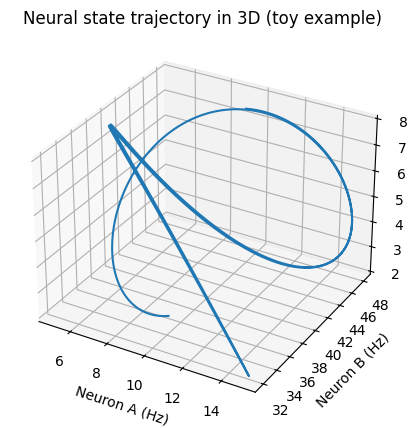

In [ ]:
# @title
# 3 个神经元的玩具示例：状态空间轨迹
t = np.linspace(0, 6*np.pi, 800)
rA = 10 + 5*np.sin(t)
rB = 40 + 8*np.sin(0.5*t + 0.8)
rC =  5 + 3*np.cos(1.2*t)
R = np.c_[rA, rB, rC]

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot(R[:,0], R[:,1], R[:,2])
ax.set_title("Neural state trajectory in 3D (toy example)")
ax.set_xlabel("Neuron A (Hz)")
ax.set_ylabel("Neuron B (Hz)")
ax.set_zlabel("Neuron C (Hz)")
plt.show()

## 1.2 相似度的度量：点积（Dot Product）

### 当前问题
大脑如何判断“眼前这张脸是祖母”？几何上等价于：
**输入向量 $\mathbf{x}$ 与记忆模板 $\mathbf{w}$ 有多相似？**

### 点积：计算相似性

神经元实际上就是一个点积计算器。如果我们将突触权重看作一个“模板向量”，神经元就会时刻计算输入向量与模板向量的点积。点积越大，发放越强。这意味着神经元在探测匹配度。

### 祖母细胞 vs. 分布式编码

这引出了神经编码的两种极端基底观点：

1. **祖母细胞（Local Basis）：** 每个坐标轴代表一个具体的概念（“祖母”，“红色”，“法拉利”）。向量非常稀疏（只有一个维度非零）。
    
2. **分布式编码（Distributed Basis）：** 概念由所有坐标轴的组合表示。祖母是向量 $[0.1, -0.5, 0.3...]$。这是大脑实际采用的方式，因为它对损伤具有鲁棒性——死掉一个神经元不会让你忘掉祖母，只会让图像稍微模糊一点。

### 解决：点积的几何定义
$$
\mathbf{a}\cdot\mathbf{b}=\sum_{i=1}^{N}a_i b_i=|\mathbf{a}|\,|\mathbf{b}|\cos\theta
$$
其中 $\theta$ 是两个向量的夹角。

- **正相关（相似）：** 当夹角锐角时，点积为正。
    
- **无关（正交）：** 当夹角为 90 度时，点积为零。这在神经科学中对应**去相关（Decorrelation）**，即两个神经元的活动完全独立。
    
- **负相关（相反）：** 当夹角为钝角时，点积为负。

### 模长与归一化：把“强弱”和“模式”分开
**问题**：两次群体活动可能只是整体强弱不同，但模式相同；我们不想被强弱误导。  
**解决**：用模长衡量强弱，用归一化去掉强弱只保留模式。

模长（长度）：
$$
|\mathbf{x}|=\sqrt{\sum_{i=1}^{n}x_i^2}
$$
归一化的obserer（即归一化基，单位向量）：
$$
\hat{\mathbf{x}}=\frac{\mathbf{x}}{|\mathbf{x}|}
$$

### 点积与投影：相似度的核心从哪里来？
**问题**：我们想回答“两个群体模式有多像？”  
**解决**：点积 = 投影的代数形式；投影系数给出“像多少”。

点积：
$$
\mathbf{x}\cdot\mathbf{y}=\sum_{i=1}^{n}x_i y_i
$$
几何关系（夹角 $\theta$）：
$$
\mathbf{x}\cdot\mathbf{y}=\|\mathbf{x}\|\,\|\mathbf{y}\|\cos\theta
$$

$\mathbf{x}$ 在 $\mathbf{y}$ 上的投影标量（长度）$=\|\mathbf{x}\|\cdot\cos\theta=\frac{|\mathbf{x}||\mathbf{y}|\cdot\cos\theta}{|\mathbf{y}|}=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{y}|}$


$\mathbf{x}$ 在 $\mathbf{y}$ 上的投影向量（把 $\mathbf{x}$ 投到 $\mathbf{y}$ 上）：

$$
\mathrm{proj}_{\mathbf{y}}(\mathbf{x})=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{y}|}\cdot\frac{\mathbf{y}}{|\mathbf{y}|}=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{y}|^2}\mathbf{y}
$$

可以把“目标向量”写成一组**归一化基**(**正交归一基**)的线性组合
$$目标向量=\sum 归一系数\cdot 归一化基=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{y}|}\cdot\frac{\mathbf{y}}{|\mathbf{y}|}$$

$$目标向量=\sum 投影系数\cdot 非归一化基=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{y}|^2}\mathbf{y}$$

沿 $\mathbf y$ 的分量/投影长度：
$${c_{\text{comp}}=\mathbf x\cdot \hat{\mathbf y}
=\frac{\mathbf x\cdot \mathbf y}{|\mathbf y|}}$$

投影系数（沿 $\mathbf{y}$ 的含量）：
$$
c=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{y}|^2}
$$

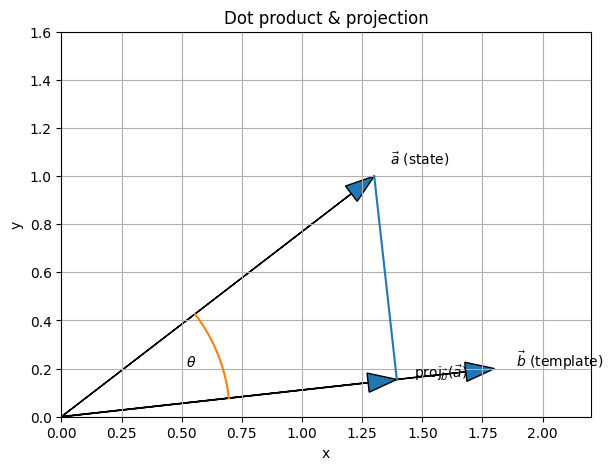

a·b = 2.5400000000000005
cosine similarity = 0.8551073802680691


In [ ]:
# @title
# 点积=投影的直觉图
def draw_vector(ax, v, label=None):
    ax.arrow(0, 0, v[0], v[1], length_includes_head=True,
             head_width=0.08, head_length=0.12)
    if label is not None:
        ax.text(v[0]*1.05, v[1]*1.05, label)

def draw_angle_arc(ax, angle1, angle2, r=0.7, n=120, label=r"$\theta$"):
    th = np.linspace(angle1, angle2, n)
    ax.plot(r*np.cos(th), r*np.sin(th))
    mid = 0.5*(angle1+angle2)
    ax.text(0.8*r*np.cos(mid), 0.8*r*np.sin(mid), label)

a = np.array([1.3, 1.0])
b = np.array([1.8, 0.2])
c = (a @ b) / (b @ b)
proj = c * b

fig, ax = plt.subplots()
draw_vector(ax, b, r"$\vec b$ (template)")
draw_vector(ax, a, r"$\vec a$ (state)")
draw_vector(ax, proj, r"$\mathrm{proj}_{\vec b}(\vec a)$")
ax.plot([a[0], proj[0]], [a[1], proj[1]])

ang_a = np.arctan2(a[1], a[0])
ang_b = np.arctan2(b[1], b[0])
draw_angle_arc(ax, min(ang_a, ang_b), max(ang_a, ang_b))

ax.set_aspect("equal")
ax.set_xlim(0, 2.2)
ax.set_ylim(0, 1.6)
ax.set_title("Dot product & projection")
ax.set_xlabel("x")
ax.set_ylabel("y")
plt.show()

cos_sim = (a@b)/(np.linalg.norm(a)*np.linalg.norm(b))
print("a·b =", a@b)
print("cosine similarity =", cos_sim)

# 为了简化和计算，常常把单个神经元的计算模型（如感知机）看作一个点积运算器。突触权重构成向量 $\mathbf{w}$，输入信号构成向量 $\mathbf{x}$。神经元的膜电位变化大致等于 $\mathbf{w} \cdot \mathbf{x}$。

- **赫布学习（Hebbian Learning）：** “一同发放的神经元连在一起”。这实际上是在旋转权重向量 $\mathbf{w}$，使其方向尽可能与输入向量 $\mathbf{x}$ 对齐，从而最大化点积（即最大化相似度响应）。
    
- **模式匹配：** 当我们在高维空间中进行分类时，实际上是在寻找与目标模板向量夹角最小的输入向量。点积是衡量这种“神经相似性”的天然尺子 5。

## 1.3 余弦相似度：去掉强度，只比较模式


$$
\mathrm{cos\_sim}(\mathbf{x},\mathbf{y})=\frac{\mathbf{x}\cdot\mathbf{y}}{|\mathbf{x}|\,|\mathbf{y}|}
$$
它把每个向量投到单位球面上，因此比较的是方向（模式），不是强弱（整体发放率）。



## 1.4 函数即向量：无限维的跨越



### 当前问题
LFP、行为、钙信号是随时间变化的波形。向量概念如何覆盖“连续信号”？

### 将n维向量$X_n$\{$x_1,...,x_n$}散布在时间轴上
当$n\to\infty$时，即为在$[t_1,t_2]$的函数
此时$X_n\cdot Y_n =x_1y_1+x_2y_2+...+x_ny_n$

LFP、行为轨迹、钙信号本质上是“随时间变化的量”。当我们把它们写成向量，并不是在假设信号必须连续，而是在引入一套几何语言：用“加法、数乘、内积、范数、投影”来刻画信号的相似度、能量与可分解结构。

### 1) 离散观测：采样后的时间序列就是 $\mathbb{R}^n$ 向量

实验记录总是离散采样得到
$$x=(x_1,\dots,x_n)\in\mathbb{R}^n,\quad y=(y_1,\dots,y_n)\in\mathbb{R}^n,$$
其中 $x_k=x(t_k)，t_{k+1}-t_k=\Delta t$。最常用的“相似度/相关”用点积表达。为了与连续时间的能量定义一致，常用带权点积
$$\langle x,y\rangle_{\Delta t}=\sum_{k=1}^n x_k\,y_k\,\Delta t,
\qquad
\|x\|_{\Delta t}^2=\langle x,x\rangle_{\Delta t}$$.
这样 $\|x\|_{\Delta t}^2$ 直接对应“信号能量”的离散近似。

### 2) 连续模型：极限对象不必是连续函数，通常取 L^2([t_1,t_2])

如果把采样视为对某个连续时间信号 x(t) 的观测，更自然的数学对象不是“连续函数集合”，而是平方可积空间
$$L^2([t_1,t_2])=\Big\{x(t):\int_{t_1}^{t_2}|x(t)|^2dt<\infty\Big\}$$.
该选择贴合神经信号：真实记录可能出现突变、断点、伪迹、尖峰等，不要求处处连续；只要整体能量有限（平方可积）即可。

在 $L^2$ 中，内积定义为
$$\langle x,y\rangle=\int_{t_1}^{t_2} x(t)\,y(t)\,dt,
\qquad
\|x\|^2=\int_{t_1}^{t_2}|x(t)|^2dt.$$
离散点积与连续内积的关系正是“黎曼和近似积分”：
$$\sum_{k=1}^n x_k y_k\,\Delta t \;\approx\; \int_{t_1}^{t_2}x(t)y(t)\,dt
\quad (\Delta t\to 0).$$

### 3) 不连续并不破坏“向量化”：我们关心的是投影与能量

在 $L^2$ 的几何中，信号可以做投影与基展开（滤波、相关、回归、PCA/ICA、时频分解等都依赖这一点）：
$$x(t)\approx \sum_{m=1}^M a_m\,\phi_m(t),\qquad
a_m=\langle x,\phi_m\rangle.$$
这里的关键不是连续性，而是内积存在，使得“相似度 $\langle x,\phi_m\rangle$”与“重构 $\sum a_m\phi_m$”可定义。跳变/有限断点的信号通常仍属于 $L^2$，因此完全可以用同一套向量几何来处理。

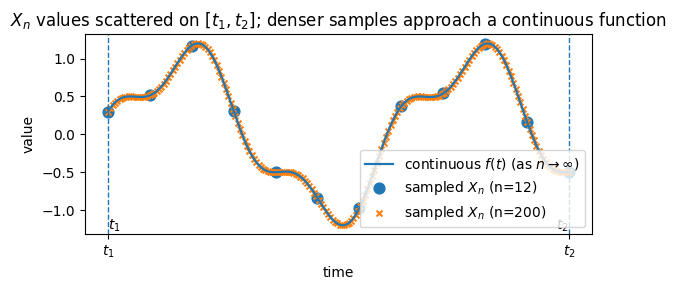

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# ===================== 可改参数 =====================
t1, t2 = 0.0, 10.0          # 时间区间 [t1, t2]
n_small = 12                # 稀疏采样（示例）
n_large = 200               # 密集采样（更接近连续）
# ===================================================

# 连续“极限函数” f(t)：你可以替换成任意函数
def f(t):
    return np.sin(t) + 0.3 * np.cos(3 * t)

# 连续曲线（近似 n→∞）
t_cont = np.linspace(t1, t2, 2000)
y_cont = f(t_cont)

# n维向量 X_n：在 n 个时刻采样得到的函数值
t_small = np.linspace(t1, t2, n_small)
x_small = f(t_small)

t_large = np.linspace(t1, t2, n_large)
x_large = f(t_large)

# ===================== 绘图 =====================
plt.figure(figsize=(6, 3))

# 连续曲线
plt.plot(t_cont, y_cont, linewidth=1.6, label=r"continuous $f(t)$ (as $n\to\infty$)")

# 离散散点（两个 n 对比）
plt.scatter(t_small, x_small, s=60, marker="o", label=rf"sampled $X_n$ (n={n_small})")
plt.scatter(t_large, x_large, s=18, marker="x", label=rf"sampled $X_n$ (n={n_large})")

# 用 t1, t2 标注时间端点：刻度 + 竖线 + 注释
plt.xticks([t1, t2], [r"$t_1$", r"$t_2$"])
plt.axvline(t1, linestyle="--", linewidth=1)
plt.axvline(t2, linestyle="--", linewidth=1)
plt.text(t1, plt.ylim()[0], r"$t_1$", va="bottom", ha="left")
plt.text(t2, plt.ylim()[0], r"$t_2$", va="bottom", ha="right")

plt.xlabel("time")
plt.ylabel("value")
plt.title(r"$X_n$ values scattered on $[t_1,t_2]$; denser samples approach a continuous function")
plt.legend()
plt.tight_layout()
plt.show()

### 解决：采样 → 向量；极限 → 函数（无限维向量）
1 秒信号以 1000 Hz 采样是 1000 维向量；采样趋于无限密时得到连续函数 $f(t)$。  
因此：**函数可以看成无限维向量**。


既然函数是向量，我们就能定义“点积/夹角/相似度”——但离散求和要升级为积分。

### 维数灾难与祝福

高维空间具有许多反直觉的特性，被称为“维数灾难（Curse of Dimensionality）”。

- **直觉：** 在 2D 桌面，随机扔两个针，它们重叠或靠近的概率很大。
    
- **高维：** 在 10,000 维空间，随机选两个向量，它们几乎必然是**相互正交（垂直）**的。这意味着高维空间极其空旷。
    
- **生物学意义：** 这其实是“维数的祝福”。大脑利用这种空旷性来实现**超容量存储**。既然随机向量之间互不干扰（正交），大脑就可以在一个网络中叠加存储近乎无数个记忆模式，而不会相互混淆（Cross-talk）。

高维空间的优化很难陷入局部最小，总有方向可以继续优化（不过这是对人工神经网络的梯度下降而言）

## 1.5 函数内积：积分点积（Hilbert 空间的门槛）


这一部分只抓住一个核心想法：把“很多神经元的活动同时发生变化”写成一条统一公式。你不需要线性代数基础，把“向量”理解为“把很多数排成一列”，把“矩阵”理解为“把连接强度排成一张表”即可。

### 当前问题
离散向量：$\sum_i x_i y_i$  
连续信号：如何定义“点积”？

### 解决：求和极限 → 积分

$$\langle x,y\rangle=\int_{t_1}^{t_2} x(t)\,y(t)\,dt$$

$\langle x,y\rangle$表示向量$x$和$y$的内积

### 面积值即为相似性,轴上面积为正，轴下面积为负





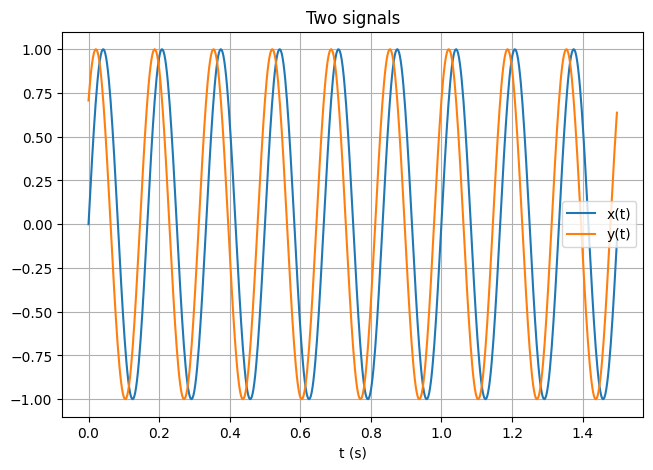

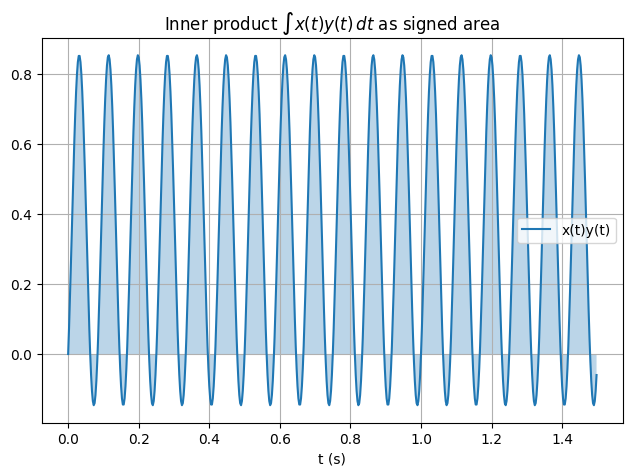

inner product ≈ ∫ x(t)y(t) dt = 0.5303300858899112


In [ ]:
# @title
# 积分内积的“面积”直觉
fs = 400
t = np.arange(0, 1.5, 1/fs)
x = np.sin(2*np.pi*6*t)
y = np.sin(2*np.pi*6*t + np.pi/4)

prod = x*y
dt = 1/fs
inner = np.sum(prod)*dt

plt.figure()
plt.plot(t, x, label="x(t)")
plt.plot(t, y, label="y(t)")
plt.title("Two signals")
plt.xlabel("t (s)")
plt.legend()
plt.show()

plt.figure()
plt.plot(t, prod, label="x(t)y(t)")
plt.fill_between(t, 0, prod, alpha=0.3)
plt.title(r"Inner product $\int x(t)y(t)\,dt$ as signed area")
plt.xlabel("t (s)")
plt.legend()
plt.show()

print("inner product ≈ ∫ x(t)y(t) dt =", inner)


### 如果想要看一个函数$f(t)$ 与$cosnt$ 的相似度就可以

对于周期函数，取一个周期即可
$$\langle f(t),cosnt\rangle=\int_{-\pi}^{\pi} f(t)\cos(nt)\,dt$$


### 首先要判断**基**是否归一，即模长是否为1
模长等价于自己跟自己点乘后开方，所以
连续函数的模长（即2-范数）
$$|f|_2=\sqrt{\int_{-\pi}^{\pi} f(t)^2\,dt}$$

$$|\cos(nt)|_2=\sqrt{\int_{-\pi}^{\pi} \cos^2(nt)\,dt}$$

基不归一

所以使用投影系数（沿 $\mathbf{y}$ 的含量）：
$${c_{\text{proj}}=\frac{\mathbf {f(t)}\cdot \mathbf cos{nt}}{|\mathbf cosnt|^2}}=\frac{1}{\pi}\int_{-\pi}^{\pi} f(t)\cos(nt)\,dt$$



### 这就是傅立叶变换求$a_n$的公式，即对应到不同频率基的振幅(原函数在不同频率下的投影)
$$a_n=\frac{1}{\pi}\int_{-\pi}^{\pi} f(t)\cos(nt)\,dt$$

$$f(t)=\frac{a_0}{2}+\sum_{n\ge1}(a_n\cos nt+b_n\sin nt)$$

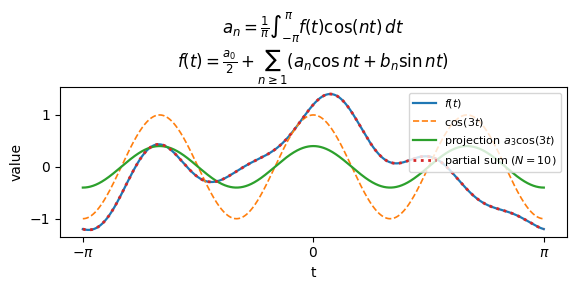

a_3 = 0.400000
||cos(3t)||_2 ≈ 1.772454  (sqrt(pi) = 1.772454)


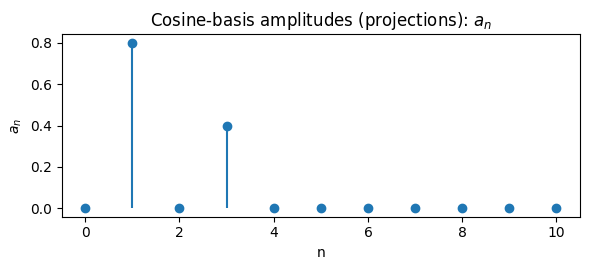

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# ===================== 1) 设置：原函数、采样与演示的 n =====================
t1, t2 = -np.pi, np.pi
M = 4000                 # 积分采样点数（越大越准）
N_terms = 10             # 用于重构的傅立叶项数（部分和）
n0 = 3                   # 演示“投影到 cos(n0 t)”那一项

t = np.linspace(t1, t2, M)

# 示例周期函数 f(t)：你可以替换成任意函数
def f(t):
    return (0.8*np.cos(1*t) +
            0.4*np.cos(3*t) +
            0.3*np.sin(2*t) +
            0.2*np.sin(5*t))

ft = f(t)

# ===================== 2) 数值计算傅立叶系数 a_n, b_n =====================
# a_n = (1/pi) ∫ f(t) cos(nt) dt
# b_n = (1/pi) ∫ f(t) sin(nt) dt
def a_n(n):
    return (1/np.pi) * np.trapezoid(ft * np.cos(n*t), t)

def b_n(n):
    return (1/np.pi) * np.trapezoid(ft * np.sin(n*t), t)

a0 = (1/np.pi) * np.trapezoid(ft, t)  # a_0

# 计算所有系数（用于谱图与重构）
a = np.array([a_n(n) for n in range(N_terms + 1)])   # a[0]=a0
b = np.array([0.0] + [b_n(n) for n in range(1, N_terms + 1)])  # b[0]不用

# ===================== 3) 投影示意：在 cos(n0 t) 上的投影向量 =====================
an0 = a_n(n0)
proj_cos_n0 = an0 * np.cos(n0*t)     # 投影：a_{n0} cos(n0 t)

# 验证 cos(nt) 的 2-范数（非归一）
cos_norm2 = np.sqrt(np.trapezoid(np.cos(n0*t)**2, t))  # ≈ sqrt(pi)

# ===================== 4) 用部分和重构 f(t) =====================
f_rec = a0/2 * np.ones_like(t)
for n in range(1, N_terms + 1):
    f_rec += a[n] * np.cos(n*t) + b[n] * np.sin(n*t)

# ===================== 5) 图1：时间域示意 =====================
plt.figure(figsize=(6, 3))  # 缩小图像大小

plt.plot(t, ft, linewidth=1.6, label=r"$f(t)$")
plt.plot(t, np.cos(n0*t), linestyle="--", linewidth=1.2, label=rf"$\cos({n0}t)$")
plt.plot(t, proj_cos_n0, linewidth=1.6, label=rf"projection $a_{{{n0}}}\cos({n0}t)$")
plt.plot(t, f_rec, linestyle=":", linewidth=2.0, label=rf"partial sum ($N={N_terms}$)")

plt.xticks([-np.pi, 0, np.pi], [r"$-\pi$", r"$0$", r"$\pi$"])
plt.xlabel("t")
plt.ylabel("value")

# 关键：\ge 改为 \geq
plt.title(
    r"$a_n=\frac{1}{\pi}\int_{-\pi}^{\pi} f(t)\cos(nt)\,dt$" "\n"
    r"$f(t)=\frac{a_0}{2}+\sum_{n\geq 1}(a_n\cos nt+b_n\sin nt)$"
)

plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

print(f"a_{n0} = {an0:.6f}")
print(f"||cos({n0}t)||_2 ≈ {cos_norm2:.6f}  (sqrt(pi) = {np.sqrt(np.pi):.6f})")

# ===================== 6) 图2：a_n 的“频率基振幅”示意（余弦系数谱） =====================
n_idx = np.arange(0, N_terms + 1)

plt.figure(figsize=(6, 2.8))
plt.stem(n_idx, a, basefmt=" ")
plt.xlabel("n")
plt.ylabel(r"$a_n$")
plt.title(r"Cosine-basis amplitudes (projections): $a_n$")
plt.tight_layout()
plt.show()

### 推导到下一步：选择一套基（Basis）去投影
一旦内积存在，我们就能把“投影到一个方向”升级为“投影到一个基函数”。接下来将进入傅立叶/小波：基变换。

# 第二部分：空间的变换——矩阵、行列式与特征结构



## 2.1 矩阵作为神经连接：$\,\mathbf{y}=\mathbf{W}\mathbf{x}\,$



### 当前问题  
神经信息不是静止的：它在层级之间流动、被重组、被放大/抑制。跨脑区投射、层间连接如何用统一的数学描述？

### 把符号变成“人话”  
- 输入活动 $\mathbf{x}$：层 A 的 $M$ 个神经元活动，排成一列  
$$
\mathbf{x}=
\begin{bmatrix}
x_1\\x_2\\\vdots\\x_M
\end{bmatrix}
$$

- 输出活动 $\mathbf{y}$：层 B 的 $N$ 个神经元活动，排成一列  
$$
\mathbf{y}=
\begin{bmatrix}
y_1\\y_2\\\vdots\\y_N
\end{bmatrix}
$$

- 连接矩阵 $\mathbf{W}$：从 A 到 B 的权重表，是一个 $N\times M$ 的数表  
$$
\mathbf{W}\in\mathbb{R}^{N\times M}
$$

### 解决：连接矩阵就是线性变换器  
核心公式：
$$
\mathbf{y}=\mathbf{W}\mathbf{x}
$$

它的含义是：每个输出神经元 $y_i$，都是把所有输入 $x_j$ 按权重加权求和得到的：
$$
y_i=\sum_{j=1}^{M}W_{ij}x_j
$$



输出向量$ \mathbf{y} $的每个分量，等于矩阵 $\mathbf{W} $的一行与输入向量 $\mathbf{x} $的点积（加权求和）。


### 维度规则（先判断能不能乘）
$$\mathbf{W}\in\mathbb{R}^{N\times M}$$
$$\mathbf{x}\in\mathbb{R}^{M\times 1}$$

则乘法成立，结果
$$\mathbf{y}\in\mathbb{R}^{N\times 1}$$

记法：左边“列数”必须等于右边“行数”（内维度匹配）。


### 最小例子（2 个输入 $\to$ 2 个输出）  
$$
\mathbf{W}=
\begin{bmatrix}
2 & 0\\
1 & 1
\end{bmatrix},\quad
\mathbf{x}=
\begin{bmatrix}
x_1\\x_2
\end{bmatrix}
$$

那么
$$
\mathbf{y}=\mathbf{W}\mathbf{x}=
\begin{bmatrix}
2x_1+0x_2\\
1x_1+1x_2
\end{bmatrix}
=
\begin{bmatrix}
2x_1\\
x_1+x_2
\end{bmatrix}
$$

解释：第一个输出只看 $x_1$ 并放大 2 倍；第二个输出把两路输入相加。

### 几何直觉（记一句就够）  
把 $\mathbf{x}$ 当作空间里的一个点或箭头，$\mathbf{W}$ 会把它变成另一个点或箭头：可能发生拉伸、压缩、旋转、剪切。也就是说矩阵不仅在“算数”，它在“改造空间”。

### 推导到下一步：变换如何改变“空间体积”？  
如果一个变换把许多不同输入挤在一起，信息可能丢失；如果把输入拉开，模式更容易区分。要定量描述“总体扩张还是压缩”，引出行列式。

---



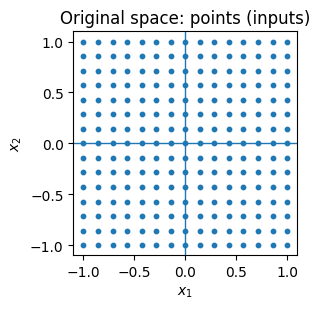

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# 生成一个小点云 + 网格（用于观察几何变换）
xs = np.linspace(-1, 1, 15)
ys = np.linspace(-1, 1, 15)
X, Y = np.meshgrid(xs, ys)
pts = np.c_[X.ravel(), Y.ravel()]

plt.figure(figsize=(4.6, 3.2))
plt.scatter(pts[:, 0], pts[:, 1], s=10)
plt.axhline(0, linewidth=1)
plt.axvline(0, linewidth=1)
plt.gca().set_aspect("equal", adjustable="box")
plt.xlabel(r"$x_1$")
plt.ylabel(r"$x_2$")
plt.title("Original space: points (inputs)")
plt.tight_layout()
plt.show()

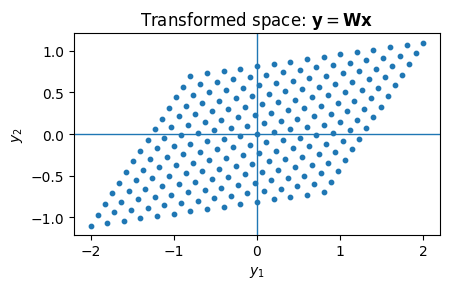

W=
 [[1.4 0.6]
 [0.2 0.9]]
det(W) = 1.14


In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# 选一个 2x2 矩阵（你可以改它来观察不同变换）
W = np.array([[1.4, 0.6],
              [0.2, 0.9]])

xs = np.linspace(-1, 1, 15)
ys = np.linspace(-1, 1, 15)
X, Y = np.meshgrid(xs, ys)
pts = np.c_[X.ravel(), Y.ravel()]

pts2 = pts @ W.T   # y = W x（列向量写法等价于这里的转置乘法）

plt.figure(figsize=(4.6, 3.2))
plt.scatter(pts2[:, 0], pts2[:, 1], s=10)
plt.axhline(0, linewidth=1)
plt.axvline(0, linewidth=1)
plt.gca().set_aspect("equal", adjustable="box")
plt.xlabel(r"$y_1$")
plt.ylabel(r"$y_2$")
plt.title(r"Transformed space: $\mathbf{y}=\mathbf{W}\mathbf{x}$")
plt.tight_layout()
plt.show()

print("W=\n", W)
print("det(W) =", np.linalg.det(W))

## 2.2 行列式（Determinant）：体积的缩放



### 当前问题  
变换后空间到底“变大还是变小”？信息被扩张还是压缩？有没有方向被压扁导致不可逆？

### 解决：行列式是体积缩放倍数（仅对方阵）  
行列式只对方阵定义（$N=M$）：
$$
\det(\mathbf{W})
$$

直觉：单位立方体变成平行六面体，体积变化倍数就是 $|\det(\mathbf{W})|$。

### 神经含义（直觉）  
- $|\det(\mathbf{W})|>1$：扩张 $\to$ 模式分离（相似刺激拉开）  

 神经群体扩大了状态空间。这通常发生在感觉处理的早期，有助于**模式分离(Pattern Separation)**，使得原本相似的刺激（如两种相似的气味）在神经表征上变得截然不同。
- $|\det(\mathbf{W})|<1$：压缩 $\to$ 不变性（丢弃无关变异）

 这对应于**不变性(Invariance)**的形成。例如，无论光照如何变化，我们都能识别出同一张脸。系统丢弃了无关的变异（光照），保留了核心信息。
- $\det(\mathbf{W})=0$：坍缩 $\to$ 降维/过滤（某些方向被完全抹去）

这是**降维(Dimensionality Reduction)**的极端形式，意味着某些输入模式被完全过滤掉了 。

备注：符号正负还能表示是否发生“翻转”（镜像），很多直觉讨论更关心大小 $|\det|$。

### 推导到下一步：不同方向被不同对待  
行列式告诉你总体体积怎么变，但不告诉你“每个方向分别怎么变”。矩阵通常会对不同方向拉伸/压缩不同程度，引出特征结构。

---



### 补充知识：行列式计算
#### 1) 定义与前提
•	det(W) 记作 $ \det(\mathbf W) $，只对方阵 $ \mathbf W\in\mathbb{R}^{n\times n} $ 定义。


#### 2) 2×2 公式

若
$$
\mathbf W=
\begin{bmatrix}
a & b\\
c & d
\end{bmatrix}
$$
则
$$
\det(\mathbf W)=ad-bc
$$


#### 3) 3×3 公式（按第一行展开）

若
$$
\mathbf W=
\begin{bmatrix}
a & b & c\\
d & e & f\\
g & h & i
\end{bmatrix}
$$
则
$$
\det(\mathbf W)=a(ei-fh)-b(di-fg)+c(dh-eg)
$$

#### 4) 任意 $n\times n$：消元法（推荐手算/程序）

思想：用初等行变换把矩阵化为上三角矩阵 $ \mathbf U $，然后用对角线求行列式。

行变换对行列式的影响：\
	1.	交换两行：$\det$ 变号\
	2.	某行乘以常数 $k$：$\det$ 乘以 $k$\
	3.	用“某行加上另一行的倍数”替换该行：$\det$ 不变

若消元得到上三角 $ \mathbf U $，换行次数为 $s$，行缩放因子乘积为 $K$，则
$$
\det(\mathbf W)=(-1)^s\cdot K \cdot \prod_{j=1}^{n}U_{jj}
$$

### 一个完整手算示例（用消元）

$$\mathbf W=
\begin{bmatrix}
1 & 2 & 3\\
2 & 5 & 8\\
1 & 3 & 4
\end{bmatrix}$$

用“加倍数替换行”（不改变 det）：

•	$R_2 \leftarrow R_2-2R_1$：
\begin{bmatrix}
1&2&3\\
0&1&2\\
1&3&4
\end{bmatrix}
•	$R_3 \leftarrow R_3-R_1$：
\begin{bmatrix}
1&2&3\\
0&1&2\\
0&1&1
\end{bmatrix}

•	$R_3 \leftarrow R_3-R_2$：
\begin{bmatrix}
1&2&3\\
0&1&2\\
0&0&-1
\end{bmatrix}

现在是上三角，且过程中没有换行、没有把某行整体乘常数，所以
$$\det(\mathbf W)=1\cdot 1\cdot (-1)=-1$$

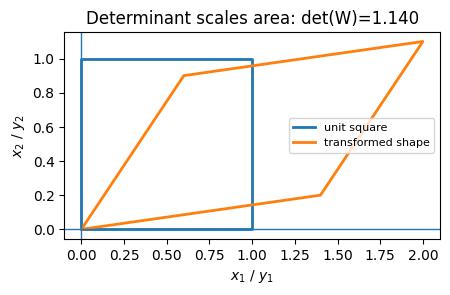

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

W = np.array([[1.4, 0.6],
              [0.2, 0.9]])

# 单位正方形（按顶点顺序闭合）
square = np.array([[0,0],[1,0],[1,1],[0,1],[0,0]])
para = square @ W.T

detW = np.linalg.det(W)

plt.figure(figsize=(4.6, 3.2))
plt.plot(square[:,0], square[:,1], linewidth=2, label="unit square")
plt.plot(para[:,0], para[:,1], linewidth=2, label="transformed shape")
plt.axhline(0, linewidth=1)
plt.axvline(0, linewidth=1)
plt.gca().set_aspect("equal", adjustable="box")
plt.xlabel(r"$x_1$ / $y_1$")
plt.ylabel(r"$x_2$ / $y_2$")
plt.title(rf"Determinant scales area: det(W)={detW:.3f}")
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

## 2.3 特征值与特征向量：找到矩阵偏好的方向



### 当前问题  
矩阵对某些方向可能只拉伸不旋转；在动力学里，这决定系统是衰减、爆发还是振荡。

### 解决：特征值/特征向量的定义  
若存在非零向量 $\mathbf{v}$ 使得
$$
\mathbf{W}\mathbf{v}=\lambda\mathbf{v}
$$
也就是说在经由矩阵变换的空间中，变换前后能找到$\mathbf{v}$其方向不发生变化，只发生伸缩


则 $\mathbf{v}$ 是特征向量（特殊方向），$\lambda$ 是特征值（该方向被放大/缩小的倍数）。

•	特征向量 $\mathbf{v}$ ：被矩阵作用后方向不变的向量（只允许变长或反向）。

•	特征值 $\lambda$：方向不变的同时，长度被乘上的倍数。


直观：沿着 $\mathbf{v}$ 这个方向推动，变换后方向不变，只改变长度。

### 连接到神经动力学  
在连续时间系统
$$
\dot{\mathbf{x}}=\mathbf{A}\mathbf{x}
$$
特征值决定模式随时间的变化趋势。

### 由于用实数标量无法在一个方向上同时表达“旋转相位”和“幅度变化”；复数把这两件事统一成一个指数项

若
$$
\lambda=\alpha+i\beta
$$
则对应模态随时间大致表现为
$$
e^{\lambda t}=e^{(\alpha+i\beta)t}=e^{\alpha t}e^{i\beta t}
$$

含义对应为：  
- $\alpha<0$：衰减（稳定） 活动逐渐衰减（记忆遗忘）
- $\alpha>0$：发散（不稳定） 活动指数级增强（癫痫发作）
- $\beta\neq 0$：旋转/振荡成分（频率与 $\beta$ 有关）活动能持续保持（工作记忆，积分器）

### 推导到下一步：进入“旋转”与“频域”的统一语言  
出现 $e^{i\beta t}$ 这类“旋转”项，会自然引出欧拉公式 $e^{i\theta}=\cos\theta+i\sin\theta$，并进一步引出傅立叶分析。


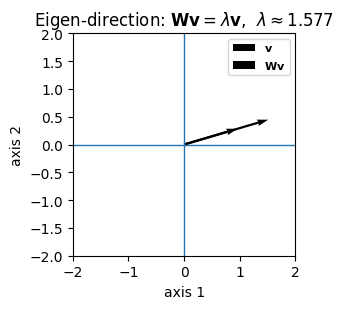

Eigenvalues: [1.57720019 0.72279981]


In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

W = np.array([[1.4, 0.6],
              [0.2, 0.9]])

eigvals, eigvecs = np.linalg.eig(W)

# 选第一个特征向量
v = eigvecs[:, 0].real
lam = eigvals[0].real

# 归一化仅用于画箭头（不影响方向）
v = v / (np.linalg.norm(v) + 1e-12)
Wv = W @ v

plt.figure(figsize=(4.6, 3.2))
plt.axhline(0, linewidth=1)
plt.axvline(0, linewidth=1)

# 画 v 与 Wv（两者应同向或反向）
plt.quiver(0, 0, v[0], v[1], angles="xy", scale_units="xy", scale=1, width=0.01, label=r"$\mathbf{v}$")
plt.quiver(0, 0, Wv[0], Wv[1], angles="xy", scale_units="xy", scale=1, width=0.01, label=r"$\mathbf{Wv}$")

plt.gca().set_aspect("equal", adjustable="box")
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.xlabel("axis 1")
plt.ylabel("axis 2")
plt.title(rf"Eigen-direction: $\mathbf{{Wv}}=\lambda\mathbf{{v}}$,  $\lambda\approx{lam:.3f}$")
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

print("Eigenvalues:", eigvals)

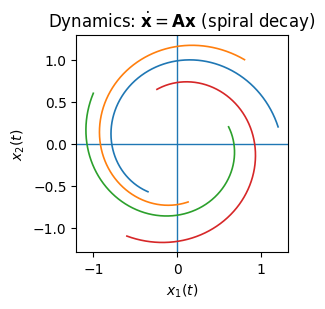

Eigenvalues of A: [-0.3+2.j -0.3-2.j]


In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# 一个“带旋转且衰减”的系统：会螺旋收敛到 0
A = np.array([[-0.3, -2.0],
              [ 2.0, -0.3]])

dt = 0.001
T = 2.0
steps = int(T / dt)

# 多个初值
inits = np.array([
    [1.2, 0.2],
    [0.8, 1.0],
    [-1.0, 0.6],
    [-0.6, -1.1]
])

plt.figure(figsize=(4.6, 3.2))
plt.axhline(0, linewidth=1)
plt.axvline(0, linewidth=1)

for x0 in inits:
    x = x0.copy()
    traj = np.zeros((steps, 2))
    for k in range(steps):
        traj[k] = x
        x = x + dt * (A @ x)   # 欧拉法
    plt.plot(traj[:,0], traj[:,1], linewidth=1.2)

plt.gca().set_aspect("equal", adjustable="box")
plt.xlabel(r"$x_1(t)$")
plt.ylabel(r"$x_2(t)$")
plt.title(r"Dynamics: $\dot{\mathbf{x}}=\mathbf{A}\mathbf{x}$ (spiral decay)")
plt.tight_layout()
plt.show()

eigvals = np.linalg.eigvals(A)
print("Eigenvalues of A:", eigvals)

# 第三部分：频域视角——傅立叶与欧拉公式（节奏与旋转）



## 3.1 基函数（Basis）的概念：换一种坐标系看同一个信号



### 当前问题
神经系统不仅在空间上编码（哪些神经元发放），也在时间上编码（以什么频率发放）。  
面对 LFP/EEG，我们想问：**信号由哪些频率成分组成？**


在向量空间中，我们可以用不同的坐标系来描述同一个点。

- **标准基（Standard Basis）：** 用每个时间点的值来描述信号（时域）。例如：“第1毫秒电压为X，第2毫秒电压为Y...”。
    
- **频率基（Frequency Basis）：** 用不同频率的正弦波的叠加来描述信号（频域）。例如：“信号由 50% 的 10Hz 正弦波和 20% 的 60Hz 正弦波组成”。
    
### 解决：傅立叶作为“基变换”
**傅立叶变换（Fourier Transform）** 的核心思想是：任何复杂的波形都可以分解为不同频率的正弦波之和。

在几何上，这是一次坐标系变换（Change of Basis）。

- 原坐标系：基底是 $\delta(t)$ （不同时刻的脉冲）。
    
- 新坐标系：基底是 $e^{i\omega t}$ （不同频率的波）。

这对于分析脑电波（EEG/LFP）至关重要。我们将杂乱的电压信号分解为 Delta, Theta, Alpha, Beta, Gamma 波段，因为这些波段对应着不同的神经生理机制（如抑制性中间神经元的回路时间常数）。

**傅立叶变换（Fourier Transform）** 本质上就是一种**基变换（Change of Basis）**。它将信号从“时间坐标系”旋转到了“频率坐标系”。这与我们在前面讲的向量旋转在数学原理上是一致的，只是这里的“向量”是无限维的函数 。

- 时域坐标：每个时间点的值  
- 频域坐标：不同频率的正弦波/复指数的权重  
傅立叶变换就是把信号从“时间坐标系”旋转到“频率坐标系”。



### 推导到下一步：统一 sin/cos → 复指数
拓展到复指数基，这需要欧拉公式。

## 3.2 欧拉公式：旋转的引擎


$$
e^{ix}=\cos x+i\sin x
$$
复数平面是二维平面：实部-虚部。  

### 使用角速度的表示形式
$$e^{i\omega t}=\cos(\omega t)+i\sin(\omega t)$$

- 这个公式告诉我们：正弦波（$\sin, \cos$）只是复指数（旋转向量）在实轴上的投影。
    
- **神经动力学的旋转：** 在分析运动皮层数据时，我们发现神经状态 $\mathbf{x}(t)$ 遵循 $\dot{\mathbf{x}} = \mathbf{M}\mathbf{x}$。如果 $\mathbf{M}$ 有虚数特征值，系统就会产生**旋转动力学**。这意味着，就像行星绕恒星旋转一样，神经状态在抽象空间中画圈。欧拉公式是我们描述这种“画圈”行为的数学工具 。


复数$z=a+bi$的模
$$|z|=\sqrt{z\,\overline{z}}=\sqrt{(a+bi)(a-bi)}=\sqrt{a^2+b^2}$$

也就是说
$e^{i\omega t}$的模长为$\sqrt{sin^2(wt)+cos^2(wt)}=1$ ,是归一化的

$\omega $为复空间的角频率，旋转半径为1






### 神经科学中的应用

- **相位编码：** 神经元不仅仅通过发放率编码，还通过相对于群体振荡（如 Theta 波）的**相位**来编码信息（如海马体中的相位进动）。欧拉公式提供了描述相位 $(e^{i\phi})$ 的数学语言。
    
- **旋转动力学（Rotational Dynamics）：** 在运动皮层中，神经群体的轨迹常表现为旋转。使用复平面和欧拉公式，我们可以将这种复杂的群体活动建模为简单的旋转系统 $\dot{\mathbf{x}} = \mathbf{M}\mathbf{x}$，其中 $\mathbf{M}$ 的特征值为虚数，代表旋转分量 。

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from IPython.display import HTML

# =========================
# 轻量参数（省资源）
# =========================
omega = 10.0
T = 3.0
fps = 30
trail = 80
figsize = (6, 4)

n_frames = int(T * fps)
t = np.linspace(0, T, n_frames)

coswt = np.cos(omega * t)
sinwt = np.sin(omega * t)

# 3D 坐标：x=t, y=cos(ωt), z=sin(ωt)
# 这样一条曲线就“同时包含”sin 和 cos 的关系（相位差 90°）
X = t
Y = coswt
Z = sinwt

# 为了更直观：在同一张 3D 图里再画两个“投影轨迹”
# cos(ωt)：(t, cos, z=0)  在 z=0 平面
# sin(ωt)：(t, y=0, sin)  在 y=0 平面
Y_cos, Z_cos = coswt, np.zeros_like(t)
Y_sin, Z_sin = np.zeros_like(t), sinwt

fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111, projection="3d")

ax.set_xlim(0, T)
ax.set_ylim(-1.1, 1.1)
ax.set_zlim(-1.1, 1.1)
ax.set_xlabel("t")
ax.set_ylabel("cos(ωt)")
ax.set_zlabel("sin(ωt)")
ax.view_init(elev=18, azim=-55)

# 三条轨迹：1) helix（关系） 2) cos 投影 3) sin 投影
(line_helix,) = ax.plot([], [], [], lw=2, label="(t, cos, sin) helix")
(line_cos,)   = ax.plot([], [], [], lw=1.6, label="cos(ωt) on z=0")
(line_sin,)   = ax.plot([], [], [], lw=1.6, label="sin(ωt) on y=0")

# 当前点（同步）
(pt_helix,) = ax.plot([], [], [], marker="o")
(pt_cos,)   = ax.plot([], [], [], marker="o")
(pt_sin,)   = ax.plot([], [], [], marker="o")

ax.legend(loc="upper left")

def init():
    for ln in [line_helix, line_cos, line_sin]:
        ln.set_data([], [])
        ln.set_3d_properties([])
    for pt in [pt_helix, pt_cos, pt_sin]:
        pt.set_data([], [])
        pt.set_3d_properties([])
    return line_helix, line_cos, line_sin, pt_helix, pt_cos, pt_sin

def update(frame):
    i0 = max(0, frame - trail)

    # helix：同时包含 sin 与 cos 的关系
    line_helix.set_data(X[i0:frame+1], Y[i0:frame+1])
    line_helix.set_3d_properties(Z[i0:frame+1])

    # cos 投影：z=0 平面
    line_cos.set_data(X[i0:frame+1], Y_cos[i0:frame+1])
    line_cos.set_3d_properties(Z_cos[i0:frame+1])

    # sin 投影：y=0 平面
    line_sin.set_data(X[i0:frame+1], Y_sin[i0:frame+1])
    line_sin.set_3d_properties(Z_sin[i0:frame+1])

    # 当前点同步
    pt_helix.set_data([X[frame]], [Y[frame]])
    pt_helix.set_3d_properties([Z[frame]])

    pt_cos.set_data([X[frame]], [Y_cos[frame]])
    pt_cos.set_3d_properties([Z_cos[frame]])

    pt_sin.set_data([X[frame]], [Y_sin[frame]])
    pt_sin.set_3d_properties([Z_sin[frame]])

    ax.set_title(rf"Complex exponential basis: $\omega={omega}$   ($x=t,\ y=\cos\omega t,\ z=\sin\omega t$)")
    return line_helix, line_cos, line_sin, pt_helix, pt_cos, pt_sin

ani = FuncAnimation(fig, update, frames=n_frames, init_func=init,
                    interval=1000/fps, blit=True)

plt.close(fig)
HTML(ani.to_jshtml())

## 3.3 傅立叶变换：幅值与相位


### 比较复函数与$e^{i\omega t}$的相似度
复函数点乘取后者的共轭函数运算$$f\cdot g =\int f\overline{g}\, dx$$

所以
$$f(t)\cdot e^{i\omega t}=\int_{-\infty}^{\infty}{f(t) e^{-i\omega t}\,dt}$$
### 即得到连续函数的傅立叶变换公式
$$X(\omega)=\int_{-\infty}^{\infty}{f(t) e^{-i\omega t}\,dt}$$

得到$X(\omega)$为$\omega$频率下的幅度

其中$ |X(\omega)| $表示信号在角频率 $\omega $对应的复指数基上的“投影强度”（幅度大小），可作为幅值谱的纵坐标。


一般 X(\omega) 是复数，可写成极坐标形式：
$$X(\omega)=|X(\omega)|e^{i\angle X(\omega)}$$

常看的量：  
- 幅值谱：$|X(\omega)|$  
- 相位谱：$\angle X(\omega)$  
- 功率谱：$|X(\omega)|^2$  

### 傅立叶的局限
全局基 $e^{i\omega t}$ 覆盖整个时间轴，无法定位“短时突发发生在何时”。这引出 STFT。

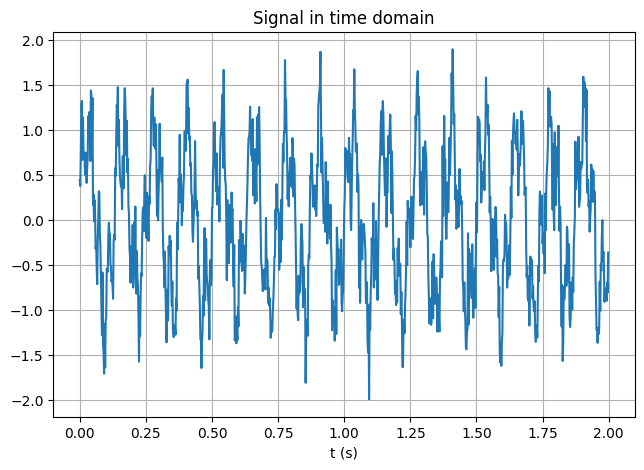

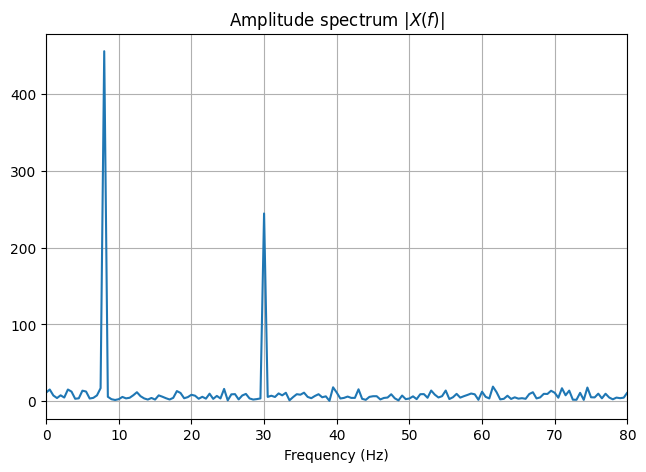

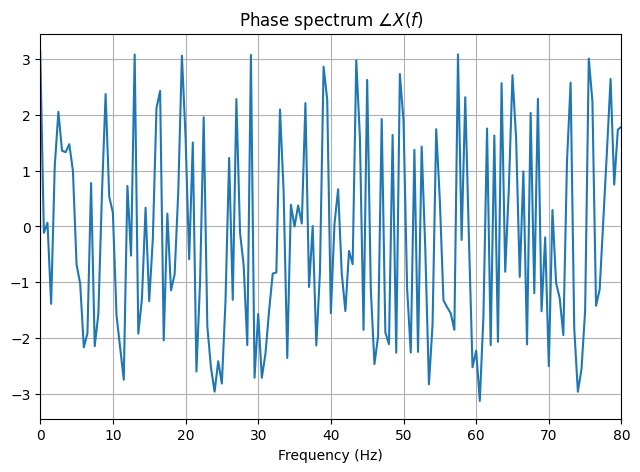

In [ ]:
# @title
# FFT：时间域 -> 幅值/相位谱
fs = 500
t = np.arange(0, 2, 1/fs)
sig = 0.9*np.sin(2*np.pi*8*t) + 0.5*np.sin(2*np.pi*30*t) + 0.25*np.random.randn(len(t))

X = np.fft.rfft(sig)
f = np.fft.rfftfreq(len(t), d=1/fs)

plt.figure()
plt.plot(t, sig)
plt.title("Signal in time domain")
plt.xlabel("t (s)")
plt.show()

plt.figure()
plt.plot(f, np.abs(X))
plt.title(r"Amplitude spectrum $|X(f)|$")
plt.xlabel("Frequency (Hz)")
plt.xlim(0, 80)
plt.show()

plt.figure()
plt.plot(f, np.angle(X))
plt.title(r"Phase spectrum $\angle X(f)$")
plt.xlabel("Frequency (Hz)")
plt.xlim(0, 80)
plt.show()

## 3.4 傅立叶的局限：为什么“定位不了突发发生在何时”


### 1) 核心原因：基函数是全局的

$e^{i\omega t}$ 在整个时间轴上都不为 $0$，它“覆盖全时域”。因此 $X(\omega)$ 是把 $f(t)$ 在整个时间轴上与 $e^{i\omega t}$ 做相似度汇总的结果。

### 2) 直接后果：频谱只告诉“有哪些频率”，不告诉“什么时候出现”

很多不同的时间结构（例如同样的短时高频突发但发生时刻不同）会得到非常相近甚至相同的幅值谱；时间位置信息不会被直接保留下来。

# 第四部分：捕捉瞬态——STFT、小波与多分辨率分析



本章围绕一个核心目标：把信号/函数 $f(t)$ 表示为一组“系数”，并用这些系数

- 衡量信号在不同时间位置、不同频段/尺度上的**相似度/强度（贡献）**  
- 支持**重构**：通过“基函数 + 系数”的线性组合把信号还原（或近似还原）

---

### 4.1 STFT：加窗把基局域化（固定窗口）

#### 4.1.1 为什么仅用傅立叶不够
经典傅立叶变换能告诉你“有 $\gamma$ 频段成分”，但无法回答“$\gamma$ 在第几秒出现”。原因是神经信号通常高度非平稳：频率成分随时间变化，而傅立叶把全时间轴的信息叠加到一起。

傅立叶变换是对全时间轴做频率投影：
$$
X(\omega)=\int_{-\infty}^{\infty} f(t)e^{-i\omega t}\,dt
$$
不同时间段对同一频率的贡献都会加到同一个 $X(\omega)$ 中，因此天然缺少“发生在什么时候”的定位能力。

#### 4.1.2 “基的局域化”：把全局投影变成局部投影
傅立叶基 $e^{i\omega t}$ 在所有 $t$ 上都非零，是**全局基**。所谓“局域化”，就是把全局起作用的基函数改造成只在某个时间邻域内起作用的分析函数，从而让投影结果携带时间位置信息。

一个直观标准：若 $g(t)$ 除了某个有限区域外几乎为 0（紧支撑或快速衰减），则称它在时间上是局域的。

#### 4.1.3 STFT：用窗函数把全局基变成局部原子



从全局基 $e^{i\omega t}$ 出发，引入窗函数 $\varphi(t)$ ：
- **高斯窗（连续）**  
  $$\varphi(t)=\exp\!\left(-\frac{t^2}{2\sigma^2}\right)$$

- **汉宁窗（离散，长度 $N$）**  
  $$\varphi[n]=\frac12\left(1-\cos\left(\frac{2\pi n}{N-1}\right)\right),\quad n=0,\dots,N-1$$
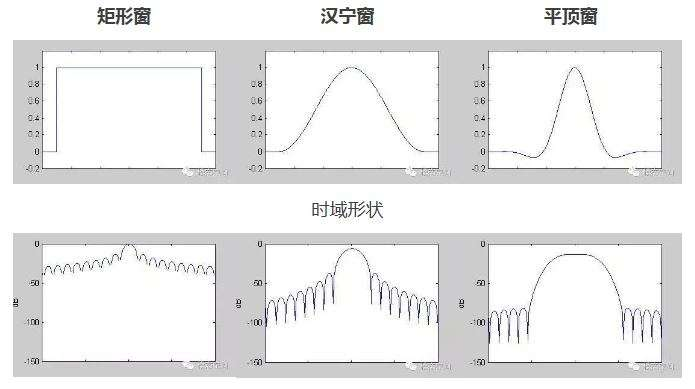

把窗平移到时刻 $\tau$ 附近（连续形式）：
$$\varphi_\tau(t)\stackrel{\mathrm{def}}{=}\varphi(t-\tau)$$
于是 $\varphi_\tau(t)$ 只在 $t\approx \tau$ 附近显著，远离 $\tau$ 的部分权重趋近于 0。

将窗与复指数相乘，得到 STFT 的局部原子：
$$
g_{\tau,\omega}(t)=\varphi(t-\tau)e^{i\omega t}
$$
若 $\varphi$ 在 0 附近非零、远处快速衰减，则 $g_{\tau,\omega}(t)$ 只在 $t\approx\tau$ 附近显著，实现时间局域化。





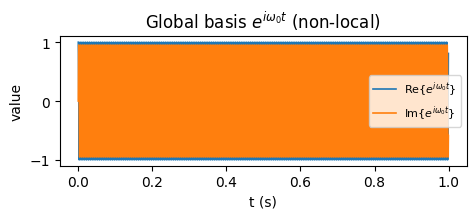

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

fs = 2000.0
T = 1.0
t = np.arange(0, T, 1/fs)

f0 = 200.0
w0 = 2*np.pi*f0
g = np.exp(1j*w0*t)

plt.figure(figsize=(5.0, 2.3))
plt.plot(t, np.real(g), linewidth=1.2, label=r"Re{$e^{i\omega_0 t}$}")
plt.plot(t, np.imag(g), linewidth=1.2, label=r"Im{$e^{i\omega_0 t}$}")
plt.xlabel("t (s)")
plt.ylabel("value")
plt.title(r"Global basis $e^{i\omega_0 t}$ (non-local)")
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

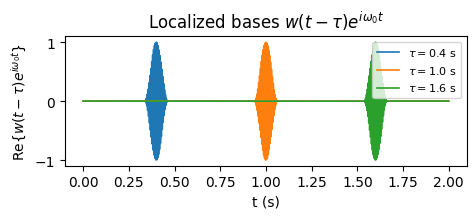

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

fs = 2000.0
T = 2.0
t = np.arange(0, T, 1/fs)

f0 = 200.0
w0 = 2*np.pi*f0

def hann_window(center_s, win_len):
    w = np.zeros_like(t)
    half = win_len // 2
    c = int(round(center_s * fs))
    start = max(0, c - half)
    end = min(len(t), c + half)
    L = end - start
    if L > 2:
        w[start:end] = np.hanning(L)
    return w

tau_list = [0.4, 1.0, 1.6]
win_len = 256

plt.figure(figsize=(5.0, 2.3))
for tau in tau_list:
    w = hann_window(tau, win_len)
    g_loc = w * np.exp(1j*w0*t)
    plt.plot(t, np.real(g_loc), linewidth=1.2, label=rf"$\tau={tau:.1f}$ s")

plt.xlabel("t (s)")
plt.ylabel(r"Re{$\varphi(t-\tau)e^{i\omega_0 t}$}")
plt.title(r"Localized bases $\varphi(t-\tau)e^{i\omega_0 t}$")
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

#### 4.1.4 两种等价理解：先截取再傅立叶（局部信号）vs 直接做内积（内积投影）

视角 A：先得到局部信号再做傅立叶
$$
f_\tau(t)=f(t)\varphi(t-\tau)
$$
$$
X(\tau,\omega)=\int_{-\infty}^{\infty} f_\tau(t)e^{-i\omega t}\,dt
=\int_{-\infty}^{\infty} f(t)\varphi(t-\tau)e^{-i\omega t}\,dt
$$

视角 B：把 $f$ 投影到局部原子（内积）
$$
X(\tau,\omega)=\langle f,g_{\tau,\omega}\rangle
=\int_{-\infty}^{\infty} f(t)\overline{g_{\tau,\omega}(t)}\,dt
$$
常取实窗 $\varphi$，则 $\overline{g_{\tau,\omega}(t)}=\varphi(t-\tau)e^{-i\omega t}$，回到同一积分式。

#### 4.1.5 符号分工：谁定位时间、谁定位频率、谁回答强度
在
$$
X(\tau,\omega)=\int_{-\infty}^{\infty} f(t)\varphi(t-\tau)e^{-i\omega t}\,dt
$$
中各项含义是：

- $\tau$：窗的位置（时间定位），表示“我在 $\tau$ 附近看信号”
- $\omega$：角频率索引，表示“我在频率轴 $\omega$ 处测量”
- $\varphi(t-\tau)$：时间局域化与加权，决定“看多长、边缘压多强”
- $e^{\pm i\omega t}$：频率匹配项，在窗内做相关
- $X(\tau,\omega)$：局部投影系数（复数），$|X(\tau,\omega)|$ 表示局部强度

#### 4.1.6 谱图：把“什么时候强”画出来
常用可视化为谱图（spectrogram）：
$$
\mathrm{Spectrogram}(\tau,\omega)=|X(\tau,\omega)|^2
$$

#### 4.1.7 固定窗的时频权衡（固定分辨率的瓶颈）
窗越窄，时间定位越好但频域越扩散；窗越宽，频率分辨越好但时间定位越差：

- 短窗：时间分辨好，频率分辨差
- 长窗：频率分辨好，时间分辨差

由于窗宽通常固定，STFT 的时频分辨率也是固定的：同一套窗难以同时兼顾低频趋势（更需要长窗）与高频突发（更需要短窗）。这直接引出小波：用“平移 + 缩放”实现多尺度自适应局域化。

---

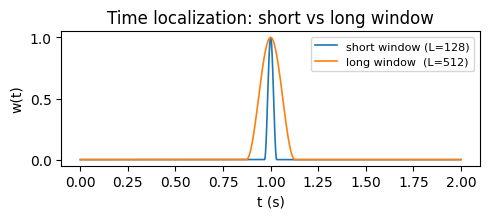

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

fs = 2000.0
T = 2.0
t = np.arange(0, T, 1/fs)

def hann_window(center_s, win_len):
    w = np.zeros_like(t)
    half = win_len // 2
    c = int(round(center_s * fs))
    start = max(0, c - half)
    end = min(len(t), c + half)
    L = end - start
    if L > 2:
        w[start:end] = np.hanning(L)
    return w

tau = 1.0
w_short = hann_window(tau, 128)
w_long  = hann_window(tau, 512)

plt.figure(figsize=(5.0, 2.3))
plt.plot(t, w_short, linewidth=1.2, label="short window (L=128)")
plt.plot(t, w_long,  linewidth=1.2, label="long window  (L=512)")
plt.xlabel("t (s)")
plt.ylabel("w(t)")
plt.title("Time localization: short vs long window")
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

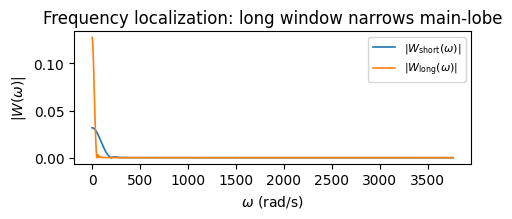

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

fs = 2000.0
T = 2.0
t = np.arange(0, T, 1/fs)
dt = 1/fs

def hann_window(center_s, win_len):
    w = np.zeros_like(t)
    half = win_len // 2
    c = int(round(center_s * fs))
    start = max(0, c - half)
    end = min(len(t), c + half)
    L = end - start
    if L > 2:
        w[start:end] = np.hanning(L)
    return w

def window_spectrum(w_time, nfft=4096):
    W = np.fft.rfft(w_time, n=nfft) * dt
    f = np.fft.rfftfreq(nfft, d=dt)      # Hz
    omega = 2*np.pi*f                    # rad/s
    return omega, np.abs(W)

tau = 1.0
wS = hann_window(tau, 128)
wL = hann_window(tau, 512)

omegaS, magS = window_spectrum(wS)
omegaL, magL = window_spectrum(wL)

omega_max = 2*np.pi*600
mS = omegaS <= omega_max
mL = omegaL <= omega_max

plt.figure(figsize=(5.0, 2.3))
plt.plot(omegaS[mS], magS[mS], linewidth=1.2, label=r"$|W_{\rm short}(\omega)|$")
plt.plot(omegaL[mL], magL[mL], linewidth=1.2, label=r"$|W_{\rm long}(\omega)|$")
plt.xlabel(r"$\omega$ (rad/s)")
plt.ylabel(r"$|W(\omega)|$")
plt.title("Frequency localization: long window narrows main-lobe")
plt.legend(fontsize=8)
plt.tight_layout()
plt.show()

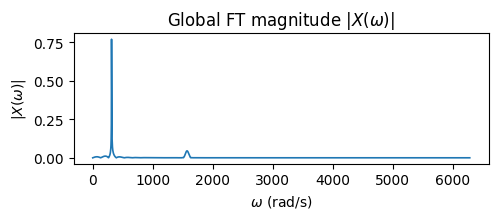

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

fs = 2000.0
T = 2.0
t = np.arange(0, T, 1/fs)
dt = 1/fs

# signal: low freq + short high-freq burst
f1, f2 = 50.0, 250.0
x = np.sin(2*np.pi*f1*t)

t0, t1 = 0.8, 1.0
mask = (t >= t0) & (t <= t1)
env = np.zeros_like(t)
env[mask] = np.hanning(mask.sum())
x += 0.9 * env * np.sin(2*np.pi*f2*t)

N = 4096
X = np.fft.fft(x, n=N) * dt
freq = np.fft.fftfreq(N, d=dt)
omega = 2*np.pi*freq

pos = freq >= 0
omega_pos = omega[pos]
mag = np.abs(X[pos])

plt.figure(figsize=(5.0, 2.3))
plt.plot(omega_pos, mag, linewidth=1.2)
plt.xlabel(r"$\omega$ (rad/s)")
plt.ylabel(r"$|X(\omega)|$")
plt.title(r"Global FT magnitude $|X(\omega)|$")
plt.tight_layout()
plt.show()

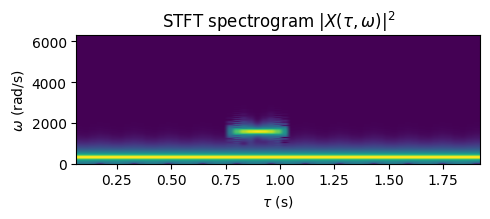

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

fs = 2000.0
T = 2.0
t = np.arange(0, T, 1/fs)
dt = 1/fs

# signal: low freq + short high-freq burst
f1, f2 = 50.0, 250.0
x = np.sin(2*np.pi*f1*t)

t0, t1 = 0.8, 1.0
mask = (t >= t0) & (t <= t1)
env = np.zeros_like(t)
env[mask] = np.hanning(mask.sum())
x += 0.9 * env * np.sin(2*np.pi*f2*t)

# STFT params
win_len = 256
hop = 64
nfft = 256
window = np.hanning(win_len)

frames = 1 + (len(x) - win_len) // hop
S_list = []
tau_list = []

for k in range(frames):
    start = k * hop
    seg = x[start:start+win_len] * window
    S = np.fft.rfft(seg, n=nfft) * dt
    S_list.append(np.abs(S)**2)
    tau_list.append((start + win_len/2) * dt)

S = np.array(S_list).T
f = np.fft.rfftfreq(nfft, d=dt)
omega = 2*np.pi*f
tau = np.array(tau_list)

S_db = 10*np.log10(S + 1e-12)

plt.figure(figsize=(5.0, 2.3))
plt.imshow(
    S_db, aspect="auto", origin="lower",
    extent=[tau[0], tau[-1], omega[0], omega[-1]]
)
plt.xlabel(r"$\tau$ (s)")
plt.ylabel(r"$\omega$ (rad/s)")
plt.title(r"STFT spectrogram $|X(\tau,\omega)|^2$")
plt.tight_layout()
plt.show()

### 4.2 小波变换：可缩放的局域基（多分辨率）



#### 4.2.1 从“局部投影”到“可缩放局部投影”
小波的核心思想：分析函数不仅随时间平移，还能随尺度伸缩，使不同频段自动采用不同的有效窗长。

小波局部原子写成“平移 + 缩放”的族：
$$
\psi_{a,b}(t)=\frac{1}{\sqrt{|a|}}\psi\!\left(\frac{t-b}{a}\right)
$$

- $\psi(t)$：母小波（mother wavelet），具有局域性（通常零均值、快速衰减/紧支撑）
- $b$：平移参数（时间定位）
- $a$：尺度参数（控制“窗长/频段”）
- $\frac{1}{\sqrt{|a|}}$：能量归一化，保证跨尺度比较公平

尺度直觉：

- $|a|$ 小：时间上更窄，像短窗，适合高频/突发
- $|a|$ 大：时间上更宽，像长窗，适合低频/趋势

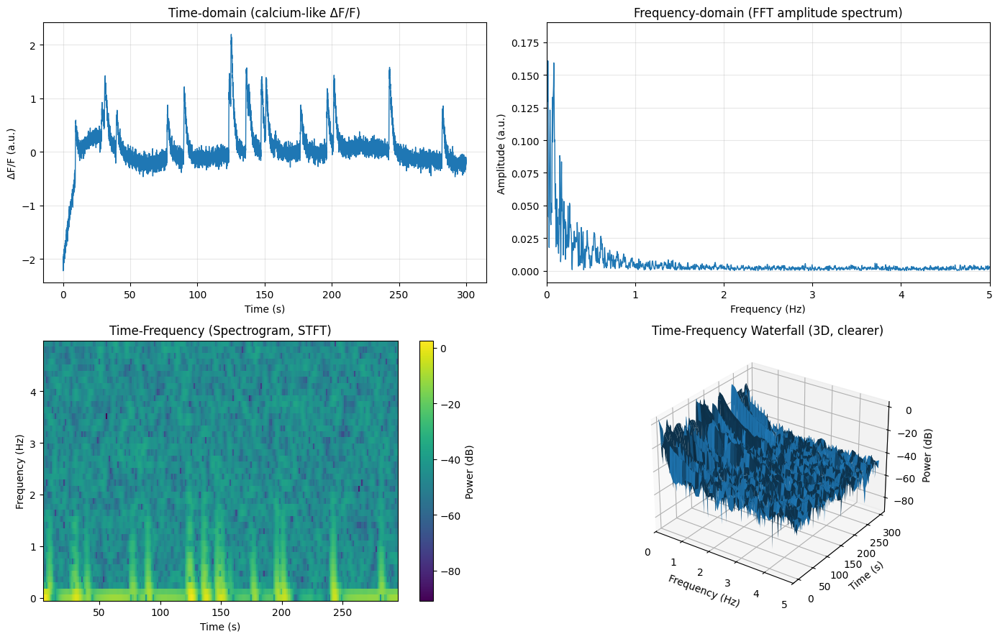

In [ ]:
# @title
# ============================================================
# Colab: Calcium-like demo signal + Time/Freq + Clear Waterfall
# Waterfall uses 3D surface by default (cleaner than many lines).
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

try:
    from scipy import signal
except Exception:
    !pip -q install scipy
    from scipy import signal

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401


# ==================================
# 1) Calcium-like synthetic signal
# ==================================
def make_calcium_demo_signal(
    fs=30.0,
    duration=300.0,
    seed=0,
    event_rate=0.08,     # events per second (Poisson); tune to be sparser/denser
    event_amp_mean=1.0,
    event_amp_cv=0.35,   # amplitude variability
    tau_rise=0.25,       # seconds (fast rise)
    tau_decay=1.5,       # seconds (slow decay)
    drift_strength=0.25, # slow baseline drift strength
    noise_std=0.08       # observation noise (ΔF/F)
):
    """
    Generate calcium-like ΔF/F:
    - Poisson events convolved with a bi-exponential kernel (rise + decay)
    - slow drift (baseline)
    - measurement noise
    """
    rng = np.random.default_rng(seed)
    N = int(fs * duration)
    t = np.arange(N) / fs

    # 1) event train (Poisson) with random amplitudes
    p = event_rate / fs
    events = rng.random(N) < p

    # amplitude per event (lognormal-like, positive)
    amps = rng.normal(loc=event_amp_mean, scale=event_amp_mean * event_amp_cv, size=N)
    amps = np.clip(amps, 0.05, None)
    e = events.astype(np.float64) * amps

    # 2) calcium kernel: difference of exponentials (normalized)
    # k(t) = (1-exp(-t/tau_rise)) * exp(-t/tau_decay)  (a common shape)
    k_len = int(fs * 10.0)  # 10 s kernel tail is usually enough for tau_decay~1-2s
    kt = np.arange(k_len) / fs
    k = (1.0 - np.exp(-kt / max(tau_rise, 1e-6))) * np.exp(-kt / max(tau_decay, 1e-6))
    k = k / (np.max(k) + 1e-12)

    ca = np.convolve(e, k, mode="full")[:N]

    # 3) slow baseline drift (low-frequency component)
    # Generate pink-ish drift via lowpass filtered noise
    drift_noise = rng.standard_normal(N)
    b, a = signal.butter(2, 0.02, btype="lowpass", fs=fs)  # cutoff ~0.02 Hz (~50 s timescale)
    drift = signal.filtfilt(b, a, drift_noise)
    drift = drift_strength * drift / (np.std(drift) + 1e-12)

    # 4) add observation noise
    y = ca + drift + noise_std * rng.standard_normal(N)

    # optional normalization to typical ΔF/F scale
    y = y - np.median(y)
    return t, y


# ==========================================
# 2) Plot: time + FFT + STFT + clear waterfall
# ==========================================
def plot_time_freq_waterfall_clear(
    x,
    fs,
    t=None,
    nperseg=256,
    noverlap=220,
    window="hann",
    fmax=None,
    log_power=True,
    waterfall_mode="surface",  # "surface" (recommended) or "lines"
    surf_t_stride=1,
    surf_f_stride=1,
    line_stride=6
):
    """
    Clearer waterfall:
    - surface: 3D plot_surface (clean, not visually tangled)
    - lines: plot a subset of time-slices (still available if you want)
    """
    x = np.asarray(x).astype(np.float64).squeeze()
    if x.ndim != 1:
        raise ValueError("x must be 1D")
    if fs is None or fs <= 0:
        raise ValueError("fs must be provided and > 0")
    if t is None:
        t = np.arange(len(x)) / fs

    x_d = x - np.mean(x)

    # FFT amplitude spectrum (one-sided)
    N = len(x_d)
    freqs = np.fft.rfftfreq(N, d=1.0/fs)
    win = np.hanning(N)
    X = np.fft.rfft(x_d * win)
    amp = np.abs(X) * 2.0 / (np.sum(win) + 1e-12)

    # STFT for calcium: low fs -> choose moderate nperseg
    f, tt, Zxx = signal.stft(
        x_d,
        fs=fs,
        window=window,
        nperseg=nperseg,
        noverlap=noverlap,
        detrend=False,
        boundary=None,
        padded=False,
    )
    power = np.abs(Zxx) ** 2

    if fmax is None:
        fmax = fs / 2
    fmask = (f >= 0) & (f <= fmax)
    f2 = f[fmask]
    P = power[fmask, :]

    if log_power:
        eps = 1e-12
        Pplot = 10.0 * np.log10(P + eps)
        zlabel = "Power (dB)"
    else:
        Pplot = P
        zlabel = "Power"

    # ===== Figure layout (2x2) =====
    fig = plt.figure(figsize=(14, 9))

    # (A) Time-domain
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.plot(t, x, linewidth=1.0)
    ax1.set_title("Time-domain (calcium-like ΔF/F)")
    ax1.set_xlabel("Time (s)")
    ax1.set_ylabel("ΔF/F (a.u.)")
    ax1.grid(True, alpha=0.3)

    # (B) Frequency-domain
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.plot(freqs, amp, linewidth=1.0)
    ax2.set_title("Frequency-domain (FFT amplitude spectrum)")
    ax2.set_xlabel("Frequency (Hz)")
    ax2.set_ylabel("Amplitude (a.u.)")
    ax2.set_xlim(0, fmax)
    ax2.grid(True, alpha=0.3)

    # (C) 2D Spectrogram
    ax3 = fig.add_subplot(2, 2, 3)
    im = ax3.pcolormesh(tt, f2, Pplot, shading="auto")
    ax3.set_title("Time-Frequency (Spectrogram, STFT)")
    ax3.set_xlabel("Time (s)")
    ax3.set_ylabel("Frequency (Hz)")
    fig.colorbar(im, ax=ax3, label=zlabel)

    # (D) Clear 3D Waterfall
    ax4 = fig.add_subplot(2, 2, 4, projection="3d")
    ax4.set_title("Time-Frequency Waterfall (3D, clearer)")

    if waterfall_mode == "surface":
        # Build grid for surface
        # X axis: frequency, Y axis: time, Z axis: power
        Fgrid, Tgrid = np.meshgrid(f2, tt, indexing="xy")  # shapes: (len(tt), len(f2))
        Zgrid = Pplot.T  # (time, freq)

        ax4.plot_surface(
            Fgrid[::surf_t_stride, ::surf_f_stride],
            Tgrid[::surf_t_stride, ::surf_f_stride],
            Zgrid[::surf_t_stride, ::surf_f_stride],
            linewidth=0,
            antialiased=True,
            shade=True
        )

    elif waterfall_mode == "lines":
        idx = np.arange(0, len(tt), max(1, int(line_stride)))
        for k in idx:
            ax4.plot(
                f2,
                np.full_like(f2, tt[k]),
                Pplot[:, k],
                linewidth=0.9
            )
    else:
        raise ValueError("waterfall_mode must be 'surface' or 'lines'.")

    ax4.set_xlabel("Frequency (Hz)")
    ax4.set_ylabel("Time (s)")
    ax4.set_zlabel(zlabel)
    ax4.set_xlim(0, fmax)
    ax4.view_init(elev=28, azim=-55)

    plt.tight_layout()
    plt.show()


# =========================
# 3) Run calcium demo
# =========================
fs = 30.0
t, x = make_calcium_demo_signal(
    fs=fs,
    duration=300.0,      # 5 minutes
    seed=0,
    event_rate=0.06,     # adjust event density
    tau_rise=0.25,
    tau_decay=1.8,
    drift_strength=0.25,
    noise_std=0.08
)

plot_time_freq_waterfall_clear(
    x=x,
    fs=fs,
    t=t,
    nperseg=256,          # ~8.5 s window @30Hz
    noverlap=220,         # heavy overlap -> smoother TF
    fmax=5.0,             # calcium usually focuses on very low freq (<~5 Hz)
    log_power=True,
    waterfall_mode="surface",  # key change for clarity
    surf_t_stride=1,
    surf_f_stride=1,
    line_stride=6
)



#### 4.2.2 连续小波变换（CWT）
把信号投影到小波族上：
$$
W(a,b)=\int_{-\infty}^{\infty} f(t)\psi_{a,b}^*(t)\,dt
$$
$|W(a,b)|$ 或 $|W(a,b)|^2$ 可视化为“时间-尺度”强度图。

#### 4.2.3 从频率索引到尺度索引
STFT 用 $\omega$ 扫频率轴；小波常用尺度 $a$ 索引频段，直觉上：

- 尺度越小 $\Rightarrow$ 更高频
- 尺度越大 $\Rightarrow$ 更低频

---

### 4.3 Haar 小波与离散小波分解：从“平均”到“细节”的可重构表示（MRA）

本节按“手稿逻辑”用 Haar 小波把关键概念落地：先定义父小波（尺度函数）获得“平均/趋势”，再引入母小波获得“细节/变化”，最终得到逐级逼近与可逆重构。

#### 4.3.1 目标：系数衡量相似度，并支持重构
把 $f(t)$ 分解到一组基函数上，得到系数（投影强度）。系数越大，表示 $f(t)$ 与对应基函数在该时间/尺度上越“相似”、贡献越大。通过调整系数并线性组合，可实现信号的逐级近似与重构。

#### 4.3.2 Haar 尺度函数（父小波）：紧支撑的“分段常数”基
Haar 尺度函数（父小波）定义为：
$$
\phi(t)=
\begin{cases}
1, & t\in[0,1),\\
0, & \text{else}.
\end{cases}
$$
它具有紧支撑（只在有限区间非零），天然局域。


采用二分法缩放得到更细的支撑区间：$\phi(2t)$ 支撑在 $[0,\tfrac12)$，$\phi(4t)$ 支撑在 $[0,\tfrac14)$，以此类推。

定义:

第0级$\phi_0=\phi_(t)$

第1级$\phi_1=\phi_(2t)$

第2级$\phi_2=\phi_(4t)$

$\phi_0$即对区间长度上的函数求平均：
$$函数均值=\frac{面积}{区间长度}=\frac{\int_{区间} f(t)\,dt}{区间长度}=基\phi_n
\cdot基的系数\int f(t)\phi_n\,dt=\phi^2_n\int f(t)\,dt$$

其中$\int f(t)\,dt$即为区间的面积
所以$$\phi^2_n=\frac{1}{区间长度}$$
即$$\int |\phi_n|^2\,dt=1$$
信号能量为振幅的平方





为了保证不同尺度下能量一致（便于内积投影比较），对基的能量进行归一化（即令函数的模长为1）：

即$$\int |\phi_n|^2\,dt=1$$

$$
\phi_j(t)=(\sqrt{2})^j\,\phi(2^j t)
$$
其支撑长度为 $2^{-j}$。

进一步引入平移（时间移动）得到一族基：
$$
\phi_{j,k}(t)=(\sqrt{2})^j\,\phi(2^j t-k),\qquad k\in\mathbb{Z}
$$
在尺度 $j$ 下，平移步长对应的时间分辨率为 $2^{-j}$。

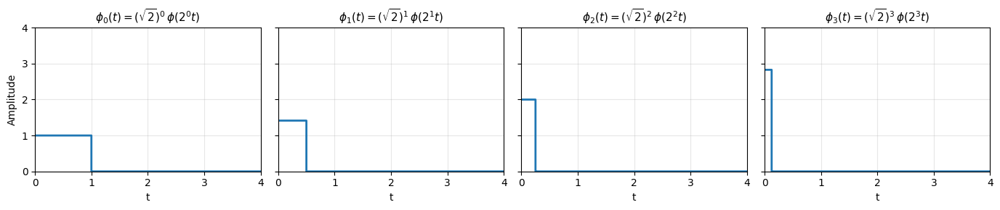

j=0: numerical ∫|phi_j|^2 dt over [0,4] ≈ 0.999875 (target 1.0)
j=1: numerical ∫|phi_j|^2 dt over [0,4] ≈ 0.999625 (target 1.0)
j=2: numerical ∫|phi_j|^2 dt over [0,4] ≈ 0.999125 (target 1.0)
j=3: numerical ∫|phi_j|^2 dt over [0,4] ≈ 0.998125 (target 1.0)


/tmp/ipython-input-2802918599.py:44: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  approx_norm2 = np.trapz(np.abs(y) ** 2, t)


In [ ]:
# @title
# Colab-ready: plot Haar scaling functions phi_0..phi_3
# L2-normalized: phi_j(t) = (sqrt(2))^j * phi(2^j t), so ∫|phi_j|^2 dt = 1
# Required axis scales: x in [0,4], y in [0,4] for ALL subplots

import numpy as np
import matplotlib.pyplot as plt

def phi(t):
    """Haar scaling function: 1 on [0,1), else 0."""
    return np.where((t >= 0) & (t < 1), 1.0, 0.0)

def phi_j(t, j):
    """Normalized Haar scaling family."""
    return (np.sqrt(2) ** j) * phi((2 ** j) * t)

# ---- settings ----
j_list = [0, 1, 2, 3]          # phi_0 to phi_3
t = np.linspace(0, 4, 8000)    # x-axis fixed to 0..4
# ------------------

fig, axes = plt.subplots(1, len(j_list), figsize=(14, 3), sharex=True, sharey=True)

for ax, j in zip(axes, j_list):
    y = phi_j(t, j)

    ax.step(t, y, where="post", linewidth=2)
    ax.set_title(rf"$\phi_{j}(t)=(\sqrt{{2}})^{j}\,\phi(2^{j}t)$", fontsize=11)

    # Fix axis scales as requested
    ax.set_xlim(0, 4)
    ax.set_ylim(0, 4)

    ax.grid(True, alpha=0.3)
    ax.set_xlabel("t")

axes[0].set_ylabel("Amplitude")

plt.tight_layout()
plt.show()

# Optional: numerical verification of L2 norm (integrated over 0..4 includes full support)
for j in j_list:
    y = phi_j(t, j)
    approx_norm2 = np.trapz(np.abs(y) ** 2, t)
    print(f"j={j}: numerical ∫|phi_j|^2 dt over [0,4] ≈ {approx_norm2:.6f} (target 1.0)")

#### 4.3.3 “平均/趋势”来自投影：近似系数
在某一小区间上，$f(t)$ 的平均可写成
$$
\overline{f}=\frac{1}{L}\int f(t)\,dt
$$
用尺度函数的投影（内积）表达更一般。近似系数定义为：
$$
a_{j,k}=\langle f,\phi_{j,k}\rangle=\int f(t)\,\phi_{j,k}(t)\,dt
$$
直观上，$a_{j,k}$ 描述了 $f(t)$ 在尺度 $j$、位置 $k$ 的“分段平均/低频趋势”。

#### 4.3.4 基函数能量归一化与范数（为何要乘 $(\sqrt{2})^j$）
要求每个归一化基函数满足单位能量：
$$
\int|\phi_{j,k}(t)|^2\,dt=1
$$
这保证不同尺度/位置的系数具有可比性。

常用范数形式（连续/离散与复数情形）：

- 连续实函数 $f(x)$：
$$
\|f\|=\sqrt{\int f(x)^2\,dx}
$$

- 连续复函数 $z(x)=f(x)+ig(x)$：
$$
\|z\|=\sqrt{\int\big(f(x)^2+g(x)^2\big)\,dx}
$$

- 离散复序列 $z[n]=f(n)+ig(n)$：
$$
\|z\|=\sqrt{\sum_n \big(f(n)^2+g(n)^2\big)}
$$



#### 4.3.5 仅有“平均”不够：引入 Haar 母小波提取细节（高通信息）
仅用尺度函数只能表达趋势，难以表达局部变化与突变细节。因此引入 Haar 母小波：
$$
\psi(t)=
\begin{cases}
1, & t\in[0,\tfrac12),\\
-1,& t\in[\tfrac12,1),\\
0, & \text{else}.
\end{cases}
$$
对应的尺度-平移族：
$$
\psi_{j,k}(t)=(\sqrt{2})^j\,\psi(2^j t-k)
$$
细节系数（投影强度）：
$$
d_{j,k}=\langle f,\psi_{j,k}\rangle=\int f(t)\,\psi_{j,k}(t)\,dt
$$

在最基础的 $\psi_{0,0}$ 上，细节系数就是“前半段面积减后半段面积”：
$$
d_{0,0}=\int_{0}^{1/2} f(t)\,dt-\int_{1/2}^{1} f(t)\,dt
$$

这给出一个非常直观的“变化量”定义：如果前后两半相近，则 $d_{0,0}$ 小；若差异明显（突变/边缘/不对称），则 $d_{0,0}$ 大。

进一步把“平均 + 差异”用于两半区间的重构直觉：令 $a$ 表示平均强度、$d$ 表示差异强度，则可理解为

- 前半段代表值 $\approx a-d$
- 后半段代表值 $\approx a+d$

（这里的常数因子与具体归一化约定有关，但“平均控制趋势、差异控制细节”的结构保持不变。）

/tmp/ipython-input-4239298086.py:37: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_front = np.trapz(fvals[mask_front], t3[mask_front])     # ∫_0^{1/2} f(t) dt
/tmp/ipython-input-4239298086.py:38: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  A_back  = np.trapz(fvals[mask_back],  t3[mask_back])      # ∫_{1/2}^1 f(t) dt


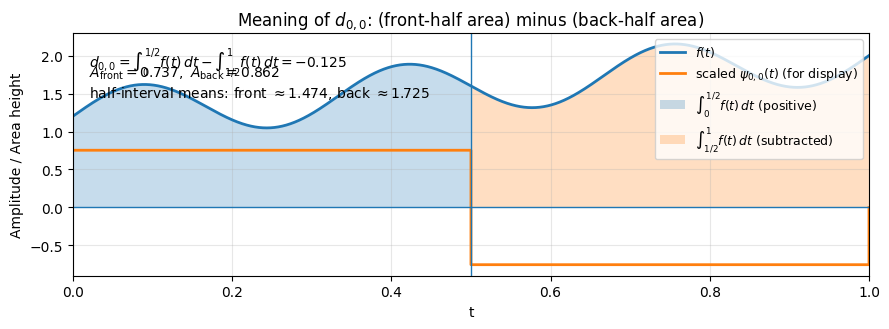

Check identities:
A_front ≈ (m+d)/2 : 0.737003 vs 0.737003
A_back  ≈ (m-d)/2 : 0.862397 vs 0.862397


In [ ]:
# @title
# Colab-ready: Haar mother wavelet (psi) schematic
# Includes:
#   (1) psi_j(t) for j = 0..3 with L2-normalization (energy = 1), shared axes
#   (2) translation example psi_{j,k}(t) showing step size 2^{-j}
#   (3) geometric meaning of d_{0,0}: (area on first half) - (area on second half)
#
# Definitions:
#   psi(t) =  1, t in [0, 1/2)
#          = -1, t in [1/2, 1)
#          =  0, else
#   psi_{j,k}(t) = (sqrt(2))^j * psi(2^j t - k)
#   d_{j,k} = <f, psi_{j,k}> = ∫ f(t) psi_{j,k}(t) dt
#
# Note: With this normalization, ∫ |psi_{j,k}(t)|^2 dt = 1 for all j,k.

import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 4) Geometric meaning of d_{0,0}: front area - back area
# ---------------------------------------------------------
# Example signal f(t) on [0,1]
t3 = np.linspace(0, 1, 6000)

def f(t):
    # choose a smooth, nonstationary-ish example (positive so area shading is intuitive)
    return 1.2 + 0.8*t + 0.35*np.sin(2*np.pi*3*t)

fvals = f(t3)
psi00 = psi_jk(t3, j=0, k=0)

# Compute areas on two halves
mask_front = (t3 >= 0) & (t3 < 0.5)
mask_back  = (t3 >= 0.5) & (t3 < 1.0)

A_front = np.trapz(fvals[mask_front], t3[mask_front])     # ∫_0^{1/2} f(t) dt
A_back  = np.trapz(fvals[mask_back],  t3[mask_back])      # ∫_{1/2}^1 f(t) dt

d00 = A_front - A_back                                     # d_{0,0} for ψ(t) as defined above
m01 = A_front + A_back                                     # ∫_0^1 f(t) dt (since support length=1)

# If you want "piecewise average values" on each half:
avg_front = 2 * A_front                                    # average over [0,1/2)
avg_back  = 2 * A_back                                     # average over [1/2,1)

fig, ax = plt.subplots(1, 1, figsize=(9, 3.4))

# plot f(t)
ax.plot(t3, fvals, linewidth=2, label=r"$f(t)$")

# overlay ψ_{0,0}(t) (scaled for visibility on same axes)
# (purely for schematic; does not affect computations)
scale_vis = 0.35 * fvals.max()
ax.step(t3, scale_vis * psi00, where="post", linewidth=2, label=r"scaled $\psi_{0,0}(t)$ (for display)")

# shade areas contributing with + and - signs
ax.fill_between(t3[mask_front], 0, fvals[mask_front], alpha=0.25, label=r"$\int_{0}^{1/2} f(t)\,dt$ (positive)")
ax.fill_between(t3[mask_back],  0, fvals[mask_back],  alpha=0.25, label=r"$\int_{1/2}^{1} f(t)\,dt$ (subtracted)")

# annotate
ax.axvline(0.5, linewidth=1)
ax.axhline(0, linewidth=1)
ax.text(0.02, 0.95, rf"$d_{{0,0}}=\int_0^{{1/2}} f(t)\,dt-\int_{{1/2}}^1 f(t)\,dt = {d00:.3f}$",
        transform=ax.transAxes, va="top", fontsize=10)
ax.text(0.02, 0.87, rf"$A_\mathrm{{front}}={A_front:.3f},\ A_\mathrm{{back}}={A_back:.3f}$",
        transform=ax.transAxes, va="top", fontsize=10)
ax.text(0.02, 0.79, rf"half-interval means: front $\approx {avg_front:.3f}$, back $\approx {avg_back:.3f}$",
        transform=ax.transAxes, va="top", fontsize=10)

ax.set_title(r"Meaning of $d_{0,0}$: (front-half area) minus (back-half area)", fontsize=12)
ax.set_xlim(0, 1)
ax.set_xlabel("t")
ax.set_ylabel("Amplitude / Area height")
ax.grid(True, alpha=0.3)
ax.legend(loc="upper right", fontsize=9, frameon=True)
plt.tight_layout()
plt.show()

# If you want the compact algebra relating "mean" and "difference" on halves:
#   m = A_front + A_back, d = A_front - A_back
# then:
#   A_front = (m + d)/2,  A_back = (m - d)/2
# and half-interval mean values are:
#   avg_front = 2*A_front = m + d
#   avg_back  = 2*A_back  = m - d
print("Check identities:")
print(f"A_front ≈ (m+d)/2 : {(m01 + d00)/2:.6f} vs {A_front:.6f}")
print(f"A_back  ≈ (m-d)/2 : {(m01 - d00)/2:.6f} vs {A_back:.6f}")

Check max|A[j]+D[j]-A[j+1]| over j=0..4: 6.939e-18


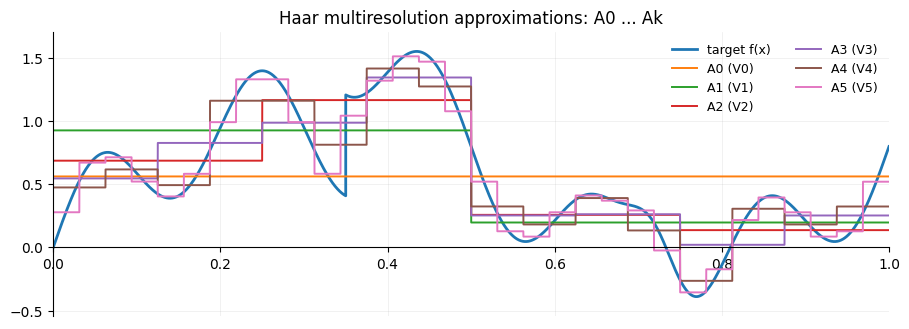

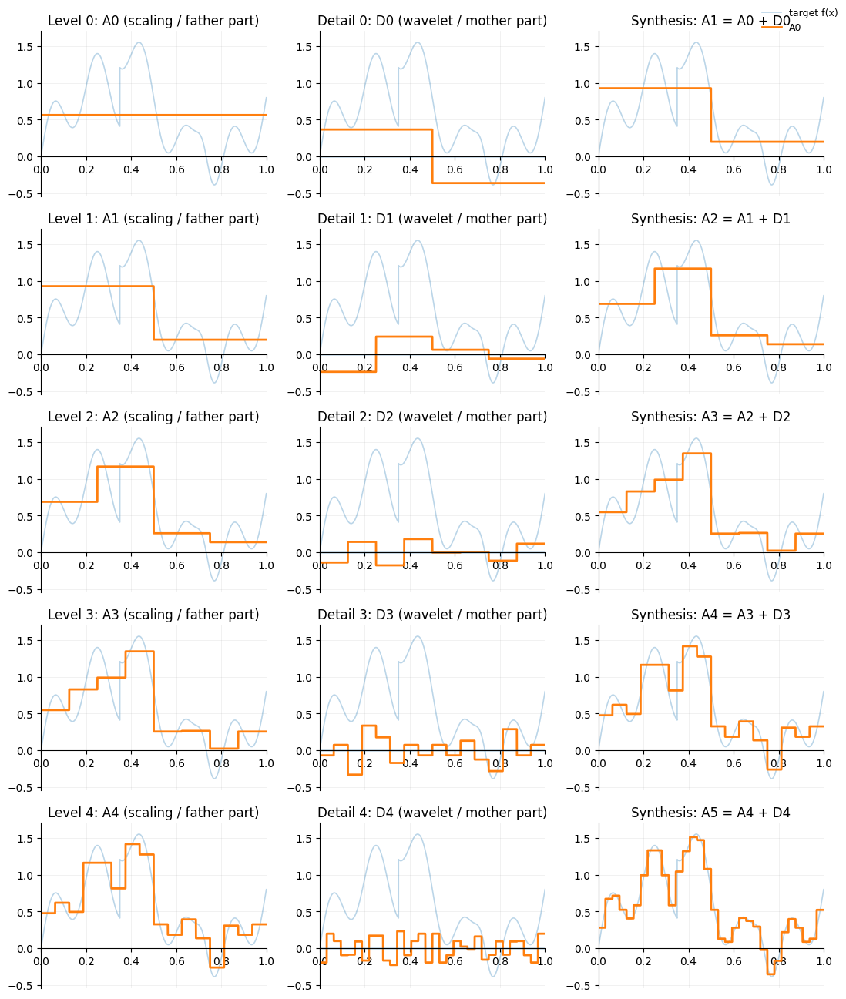

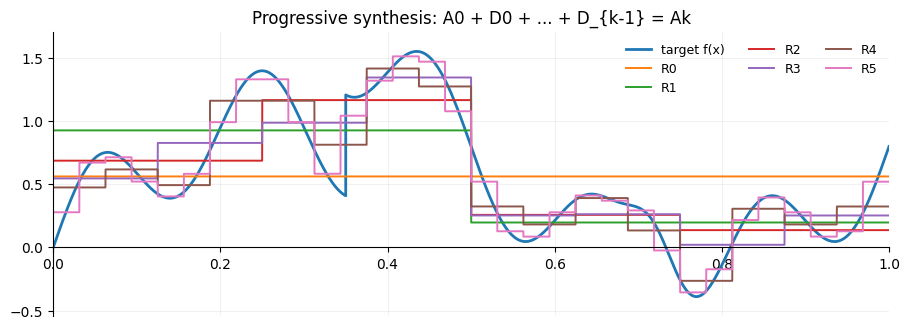

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# =========================
# 1) 用户可改参数
# =========================
k = 5  # 展示到第 k 级（0..k）

# 采样点数：保证 N 是 2 的幂且能被 2^k 整除
N = 2 ** (k + 10)
x = np.linspace(0.0, 1.0, N, endpoint=False)

# 目标函数（可替换）
def f(x):
    step = 0.8 * (x >= 0.35).astype(float)
    bump = 0.6 * np.exp(-((x - 0.72) / 0.04) ** 2)
    return np.sin(2*np.pi*x) + 0.4*np.sin(10*np.pi*x) + step + bump

y = f(x)

# =========================
# 2) 坐标轴：x 轴穿过 y=0
# =========================
def xaxis_through_zero(ax):
    ax.spines["bottom"].set_position(("data", 0))
    ax.spines["top"].set_visible(False)
    ax.spines["left"].set_position(("outward", 0))
    ax.spines["right"].set_visible(False)
    ax.xaxis.set_ticks_position("bottom")
    ax.yaxis.set_ticks_position("left")

# =========================
# 3) Haar 多尺度近似 A_j 与细节 D_j
#    A_j: 在每个长度 2^{-j} 的区间上取平均（分段常数）
#    D_j = A_{j+1} - A_j
# =========================
A = []
for j in range(k + 1):
    blocks = 2**j
    block_len = N // blocks
    Aj = np.repeat(y.reshape(blocks, block_len).mean(axis=1), block_len)
    A.append(Aj)

D = [A[j+1] - A[j] for j in range(k)]

max_err = max(np.max(np.abs((A[j] + D[j]) - A[j+1])) for j in range(k))
print(f"Check max|A[j]+D[j]-A[j+1]| over j=0..{k-1}: {max_err:.3e}")

# =========================
# 4) 全局统一 x/y scale（所有级别一致）
#    需要统一的曲线集合：y, A_j, D_j, A_j+D_j
# =========================
candidates = [y] + A + D + [A[j] + D[j] for j in range(k)]
ymin = min(arr.min() for arr in candidates)
ymax = max(arr.max() for arr in candidates)
pad = 0.08 * (ymax - ymin + 1e-12)
xlim = (0.0, 1.0)
ylim = (ymin - pad, ymax + pad)

# =========================
# 5) 图1：总览——f(x) 与 A_0..A_k（可选）
# =========================
plt.figure(figsize=(9.2, 3.4))
plt.plot(x, y, linewidth=2, label="target f(x)")
for j in range(k + 1):
    plt.plot(x, A[j], linewidth=1.4, label=f"A{j} (V{j})")
plt.title("Haar multiresolution approximations: A0 ... Ak")
plt.xlim(*xlim)
plt.ylim(*ylim)
plt.legend(ncol=2, fontsize=9, frameon=False)
ax = plt.gca()
xaxis_through_zero(ax)
ax.grid(True, linewidth=0.5, alpha=0.25)
plt.tight_layout()
plt.show()

# =========================
# 6) 图2：逐级展示“父小波部分 + 母小波细节”的叠加过程（核心）
#    每一行 j：
#      左：A_j（叠加目标函数 y 半透明）
#      中：D_j（叠加目标函数 y 半透明）
#      右：A_{j+1}=A_j+D_j（叠加目标函数 y 半透明）
#
#    注意：这里的“叠加透明”是对每一级的 A_j / D_j / 合成结果叠加 y，
#          而不是对原始 φ/ψ 基函数叠加。
# =========================
rows = k
fig, axes = plt.subplots(rows, 3, figsize=(11.0, 2.6 * rows), sharex=True, sharey=True)

if rows == 1:
    axes = np.array([axes])

for j in range(k):
    # 左：A_j（父小波/尺度部分）
    axes[j, 0].plot(x, y, linewidth=1.2, alpha=0.30, label="target f(x)" if j == 0 else None)
    axes[j, 0].plot(x, A[j], linewidth=2.0, label=f"A{j}" if j == 0 else None)
    axes[j, 0].set_title(f"Level {j}: A{j} (scaling / father part)")
    axes[j, 0].set_xlim(*xlim)
    axes[j, 0].set_ylim(*ylim)

    # 中：D_j（母小波/细节部分）
    axes[j, 1].plot(x, y, linewidth=1.2, alpha=0.30)
    axes[j, 1].plot(x, D[j], linewidth=2.0)
    axes[j, 1].axhline(0, linewidth=1)
    axes[j, 1].set_title(f"Detail {j}: D{j} (wavelet / mother part)")
    axes[j, 1].set_xlim(*xlim)
    axes[j, 1].set_ylim(*ylim)

    # 右：合成 A_{j+1}
    axes[j, 2].plot(x, y, linewidth=1.2, alpha=0.30)
    axes[j, 2].plot(x, A[j] + D[j], linewidth=2.0)
    axes[j, 2].set_title(f"Synthesis: A{j+1} = A{j} + D{j}")
    axes[j, 2].set_xlim(*xlim)
    axes[j, 2].set_ylim(*ylim)

for j in range(k):
    for i in range(3):
        axes[j, i].grid(True, linewidth=0.5, alpha=0.25)
        xaxis_through_zero(axes[j, i])

# 只放一个 legend，节省空间
handles, labels = axes[0, 0].get_legend_handles_labels()
if handles:
    fig.legend(handles, labels, loc="upper right", fontsize=9, frameon=False)

plt.tight_layout()
plt.show()

# =========================
# 7)（可选）累计相加轨迹：R_0=A0, R_1=A0+D0,...,R_k=Ak
# =========================
R = [A[0].copy()]
cur = A[0].copy()
for j in range(k):
    cur = cur + D[j]
    R.append(cur.copy())

plt.figure(figsize=(9.2, 3.4))
plt.plot(x, y, linewidth=2, label="target f(x)")
for j in range(k + 1):
    plt.plot(x, R[j], linewidth=1.4, label=f"R{j}")
plt.title("Progressive synthesis: A0 + D0 + ... + D_{k-1} = Ak")
plt.xlim(*xlim)
plt.ylim(*ylim)
plt.legend(ncol=3, fontsize=9, frameon=False)
ax = plt.gca()
xaxis_through_zero(ax)
ax.grid(True, linewidth=0.5, alpha=0.25)
plt.tight_layout()
plt.show()



#### 4.3.6 逐级逼近：第 $n$ 级近似到第 $n\!+\!1$ 级近似
Haar 分解的关键是“上一层的趋势 + 上一层的细节 = 下一层更精细的趋势”。这就是多分辨率思想。

用空间语言表述：

- $V_j$：第 $j$ 层的近似空间（趋势/低频）
- $W_j$：第 $j$ 层的细节空间（新增细节/带通）

满足直和分解：
$$
V_{j+1}=V_j\oplus W_j
$$
递推展开：
$$
V_1=V_0\oplus W_0,\quad
V_2=V_0\oplus W_0\oplus W_1,\quad
\cdots,\quad
V_{n+1}=V_0\oplus W_0\oplus\cdots\oplus W_n
$$

直观解释：

- $a_{j,k}$ 给出第 $j$ 层的“分段平均”（趋势）
- $d_{j,k}$ 给出从第 $j$ 层到第 $j+1$ 层“新增的细节补偿”
- 逐层叠加细节，得到越来越接近原信号的近似

#### 4.3.7 可重构展开式：用系数完整表示信号
在离散小波（DWT）与 MRA 框架下，信号可用“最粗层趋势 + 各层细节”表示：
$$
f(t)\approx \sum_k a_{J,k}\phi_{J,k}(t)+\sum_{j=J}^{J_{\max}}\sum_k d_{j,k}\psi_{j,k}(t)
$$
在更常见的“从某一粗层 $J$ 分解到有限层数”设置中，上式是可逆的：给定 $\{a_{J,k}\}$ 与 $\{d_{j,k}\}$ 可重构回原信号（或在数值精度范围内等价）。

---

### 4.4 系数能量图与时频不确定性：从 $|d_{j,k}|^2$ 到“尺度-时间”可视化

本节把两条线索合并成一个连贯叙述：一方面对齐 STFT 的谱图思路（时间-频率能量图），另一方面给出小波/MRA 系数的物理含义、能量定义、可视化组织方式，以及它与固定窗局限（时频不确定性/分辨率权衡）的关系，并落脚到“可逆重构”。

---

#### 4.4.1 从 STFT 谱图到小波能量图：可视化问题的对齐
在 STFT 中，常用谱图
$$
\mathrm{Spectrogram}(\tau,\omega)=|X(\tau,\omega)|^2
$$
把“时间 $\tau$ 附近、频率 $\omega$ 处的局部强度”画成一张时间-频率能量图。

小波分解（DWT/MRA）得到的对象是

- 细节系数 $d_{j,k}$：尺度 $j$、位置 $k$ 的局部细节投影  
- 近似系数 $a_{J,k}$：最粗尺度 $J$ 的趋势投影  

因此对应的自然可视化是：构造一张“时间-尺度”的能量图，让它回答

- 哪个尺度（对应哪个频段）在什么时候更强？

---

#### 4.4.2 细节系数的物理意义：投影、局部、带通
在 MRA 中
$$
d_{j,k}=\langle f,\psi_{j,k}\rangle
$$
其含义可拆成三层直觉：

- “投影”：$d_{j,k}$ 越大，说明 $f$ 在该位置/尺度上越像 $\psi_{j,k}$
- “局部”：$\psi_{j,k}(t)$ 具有紧支撑或快速衰减，只在该时间邻域内敏感
- “带通”：在滤波器组视角下，细节支路等价于对某个频带的局部响应

因此 $d_{j,k}$ 可理解为：

- 在时间位置 $k$ 附近（该尺度支持区间内），信号在尺度 $j$ 对应频带上的“局部变化/细节强度”。

---

#### 4.4.3 系数能量：为什么用平方衡量“局部强度/贡献”
由于 $d_{j,k}$ 是局部带通响应强度，常用系数平方来定义局部能量：
$$
E(j,k)=|d_{j,k}|^2
$$
这样做的理由包括：

- 在能量归一化的基/原子下，系数平方与该方向上的能量贡献直接相关
- 若 $d_{j,k}$ 为复数，$|d_{j,k}|$ 给幅值，平方给能量尺度
- 与 STFT 的谱图 $|X(\tau,\omega)|^2$ 完全同构，便于对照理解

---



/tmp/ipython-input-3881182796.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


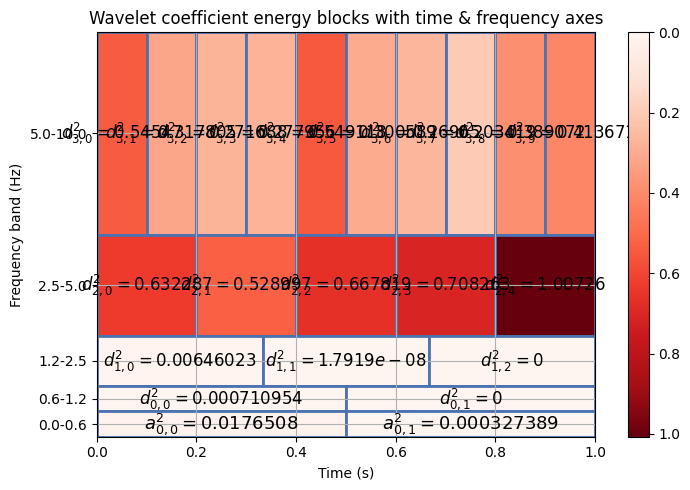

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import pywt

def wavedec_to_energy_blocks(x, wavelet="haar", level=None, mode="periodization"):
    """
    DWT 分解并返回：
    - detail_rows: [D1^2, D2^2, ..., DL^2]（从最细尺度/最高频到最粗尺度/更低频）
    - approx_row : AL^2
    """
    x = np.asarray(x, dtype=float)
    if level is None:
        maxL = pywt.dwt_max_level(len(x), pywt.Wavelet(wavelet).dec_len)
        level = max(1, maxL)

    coeffs = pywt.wavedec(x, wavelet, level=level, mode=mode)
    cA_L = coeffs[0]
    cD_coarse_to_fine = coeffs[1:]         # [cD_L, ..., cD1]
    cD_fine_to_coarse = list(reversed(cD_coarse_to_fine))  # [cD1, cD2, ..., cD_L]

    detail_rows = [np.square(cd) for cd in cD_fine_to_coarse]
    approx_row = np.square(cA_L)
    return detail_rows, approx_row, level

def plot_wavelet_energy_block_matrix(detail_rows, approx_row, fs, level,
                                     duration=None,
                                     vmax=None, vmin=0,
                                     cmap_name="Reds",
                                     edgecolor="#4C72B0", linewidth=2,
                                     invert_colorbar=True,
                                     show_text=True,
                                     title=None):
    """
    画你截图那种“块状小波系数矩阵”，并加上：
    - 横轴：时间（秒）
    - 纵轴：频率（Hz），按 DWT 频带映射（近似 dyadic band）

    频带近似：
    D_i : (fs/2^(i+1), fs/2^i),  i=1..L   (D1最高频)
    A_L : (0, fs/2^(L+1))
    """
    detail_rows = [np.asarray(r, dtype=float) for r in detail_rows]
    approx_row = np.asarray(approx_row, dtype=float)

    # 时长
    if duration is None:
        # 让一行块正好铺满 [0, duration]
        # 如果你知道真实 duration，请直接传入 duration
        duration = 1.0

    # 颜色归一化
    all_vals = np.concatenate(
        [np.concatenate(detail_rows) if len(detail_rows) else np.array([]),
         approx_row.ravel()]
    )
    if vmax is None:
        vmax = float(np.max(all_vals)) if all_vals.size else 1.0

    norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.get_cmap(cmap_name)

    fig, ax = plt.subplots(figsize=(7, 5))

    # 纵轴频率范围：0 到 Nyquist
    f_nyq = fs / 2
    ax.set_xlim(0, duration)
    ax.set_ylim(0, f_nyq)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Frequency (Hz)")

    if title:
        ax.set_title(title)

    # ---------- 画 D1..DL（从高频到低频） ----------
    # D_i 的频带：(fs/2^(i+1), fs/2^i)
    # 每一行块数不同，但都横向铺满全时长 duration
    for i, row in enumerate(detail_rows, start=1):  # i=1..L
        f_low = fs / (2 ** (i + 1))
        f_high = fs / (2 ** i)

        n_blocks = len(row)
        w = duration / max(1, n_blocks)
        h = f_high - f_low

        for k, val in enumerate(row):
            x0 = k * w
            y0 = f_low
            rect = Rectangle(
                (x0, y0), w, h,
                facecolor=cmap(norm(val)),
                edgecolor=edgecolor, linewidth=linewidth
            )
            ax.add_patch(rect)

            if show_text and n_blocks <= 16:  # 块太多时不写字，避免糊
                ax.text(
                    x0 + w/2, y0 + h/2,
                    rf"$d^2_{{{level-i},{k}}}={val:g}$",
                    ha="center", va="center", fontsize=12
                )

    # ---------- 画 A_L（最低频带：0 到 fs/2^(L+1)） ----------
    f_low = 0.0
    f_high = fs / (2 ** (level + 1))
    n_blocks = len(approx_row)
    w = duration / max(1, n_blocks)
    h = f_high - f_low

    for k, val in enumerate(approx_row):
        x0 = k * w
        y0 = f_low
        rect = Rectangle(
            (x0, y0), w, h,
            facecolor=cmap(norm(val)),
            edgecolor=edgecolor, linewidth=linewidth
        )
        ax.add_patch(rect)

        if show_text and n_blocks <= 16:
            ax.text(
                x0 + w/2, y0 + h/2,
                rf"$a^2_{{0,{k}}}={val:g}$",
                ha="center", va="center", fontsize=13
            )

    # y 轴刻度：标一下每个频带中心（可读性更强）
    # 只放 D1..DL 和 A_L 的中心点
    yticks = []
    ylabels = []
    for i in range(1, level + 1):
        fl = fs / (2 ** (i + 1))
        fh = fs / (2 ** i)
        yticks.append((fl + fh) / 2)
        ylabels.append(f"{fl:.1f}-{fh:.1f}")
    # A_L
    fl = 0.0
    fh = fs / (2 ** (level + 1))
    yticks.append((fl + fh) / 2)
    ylabels.append(f"{fl:.1f}-{fh:.1f}")

    ax.set_yticks(yticks)
    ax.set_yticklabels(ylabels)
    ax.set_ylabel("Frequency band (Hz)")

    # colorbar（0 在上 vmax 在下，和你截图一致）
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.045, pad=0.06)
    if invert_colorbar:
        cbar.ax.invert_yaxis()

    plt.tight_layout()
    plt.show()


# =========================
# 用法示例：自动算出 + 带时间/频率轴
# =========================
# 示例信号（你换成自己的 1D 信号即可）
fs = 20  # 采样率 Hz
t = np.arange(0, 1, 1/fs)
x = 0.8*np.sin(2*np.pi*5*t) + ((t>0.9)&(t<1.1))*np.sin(2*np.pi*40*t)
x += 0.1*np.random.randn(len(t))

# 建议用 periodization 得到更规整的分块
detail_rows, approx_row, L = wavedec_to_energy_blocks(x, wavelet="haar", level=4, mode="periodization")

plot_wavelet_energy_block_matrix(
    detail_rows=detail_rows,
    approx_row=approx_row,
    fs=fs,
    level=L,
    duration=t[-1] + (t[1]-t[0]),  # 信号总时长
    vmax=None,                    # 或者固定成 500：vmax=500
    cmap_name="Reds",
    edgecolor="#4C72B0",
    linewidth=2,
    invert_colorbar=True,
    show_text=True,
    title="Wavelet coefficient energy blocks with time & frequency axes"
)

#### 4.4.4 时间-尺度能量图（离散 scalogram）：矩阵定义与坐标含义
离散小波的“离散”在于基的尺度变换上是否连续


把 $E(j,k)$ 按尺度 $j$（纵轴）与时间位置 $k$（横轴）排列，得到“时间-尺度能量图”（离散 scalogram）：

$$
E(j,k)=|d_{j,k}|^2
$$

- 横轴：时间位置 $k$  
  可以进一步映射为真实时间 $t_k$（取决于采样率以及该层的下采样因子）

- 纵轴：尺度层级 $j$  
  可以进一步映射为等效频率/频段（取决于采样率与具体小波）

- 像素值：$E(j,k)$  
  表示该尺度、该时间位置的局部能量强度

它直接回答：

- 在时间 $k$ 附近，哪些尺度（频段）能量更强？
- 某个突发事件的能量集中在哪些尺度上？
- 多尺度结构是否随时间切换（状态变化、节律转换）？

---

#### 4.4.5 “金字塔/块图”直觉：dyadic 分解下的分辨率层级
在 dyadic（$2$ 倍）尺度分解中存在很强的几何直觉：

- 尺度层级越“细”（通常对应更高频细节），时间分辨率越高，块数越多、块更窄
- 尺度越“粗”（通常对应更低频变化），时间分辨率越低，块更宽、块更少

用块图表达时常见结构是“上层块更细密、下层块更宽”，并在块内填入 $|d_{j,k}|^2$ 表示能量强度。这样一眼就能看出：短暂突发会在高频层形成短时团块，而慢变化会在低频层形成更连续的带状结构。

---

#### 4.4.6 如何把尺度 $j$ 读成“频段”（dyadic 频带划分的直觉）
在 dyadic 分解里，每一层细节系数对应一个近似的频带分段（概念直觉）：

- 更“细”的层 $\Rightarrow$ 更偏高频的细节
- 更“粗”的层 $\Rightarrow$ 更偏低频的变化

从滤波器组实现理解更清晰：

- 每层的高通支路输出该层带通细节（对应 $d_{j,k}$）
- 低通支路继续递归分解，逐层把频带往低频推进

因此把纵轴画成 $j$，等价于画了一个“从高频到低频（或从细到粗）”的多尺度轴。

---



#### 4.4.7 Shannon 采样与时频不确定性：为何“想更准频率就得看更久”
Shannon 采样定理给出采样频率下限（以最高频率 $f_{\max}$ 表示）：
$$
f_s \ge 2f_{\max}
$$

更一般地，在“时间定位”和“频率定位”之间存在不可同时无限精细的权衡（时频不确定性）。直觉表述为：

- 若要把频率确定得更精细（频率分辨更高），通常需要更长的观测时间窗口  
- 若要把时间定位得更精细（时间分辨更高），通常会牺牲频率分辨，只能确定“能量在哪个较宽的频带内”

这正是 STFT 固定窗的根本局限，也解释了小波为何更适合非平稳信号：

- STFT：固定窗 $\Rightarrow$ 固定时频分辨率  
- 小波：尺度变化 $\Rightarrow$ 多分辨率  

具体表现为：

- 高频层：等效短窗，时间定位强（尖峰、短 burst 更清晰）
- 低频层：等效长窗，频带更窄（慢振荡、趋势更稳定）

### 从傅里叶变换出发得到时频不确定性
对有限能量信号 $x(t)\in L^2(\mathbb{R})$，取角频率形式的傅里叶变换
$$
X(\omega)=\int_{-\infty}^{\infty} x(t)e^{-i\omega t}\,dt
$$
在该约定下 Parseval 恒等式为
$$
\int_{-\infty}^{\infty}|x(t)|^2\,dt=\frac{1}{2\pi}\int_{-\infty}^{\infty}|X(\omega)|^2\,d\omega
$$

用能量归一化的方差来度量“时间扩展”与“频率扩展”。定义
$$
|x|_2^2=\int |x(t)|^2dt\,\qquad
\mu_t=\frac{1}{|x|_2^2}\int t|x(t)|^2dt\,\qquad
\sigma_t^2=\frac{1}{|x|_2^2}\int (t-\mu_t)^2|x(t)|^2dt
$$
以及
$$
|X|2^2=\int |X(\omega)|^2d\omega\,\qquad
\mu\omega=\frac{1}{|X|2^2}\int \omega|X(\omega)|^2d\omega\,\qquad
\sigma\omega^2=\frac{1}{|X|2^2}\int (\omega-\mu\omega)^2|X(\omega)|^2d\omega
$$

通过对信号做平移与调制可以不改变方差，因此可在不失一般性的前提下令 $\mu_t=0$、$\mu_\omega=0$（把“中心”移到零）。此时有
$$
\sigma_t^2=\frac{1}{|x|_2^2}\int t^2|x(t)|^2dt
$$

另一方面，利用傅里叶导数性质 $\mathcal{F}{x’(t)}(\omega)=i\omega X(\omega)$ 并结合 Parseval，可把频域二阶矩写回到时域：
$$
\int_{-\infty}^{\infty}\omega^2|X(\omega)|^2d\omega=2\pi\int_{-\infty}^{\infty}|x’(t)|^2dt
$$
再用 $|X|_2^2=2\pi|x|2^2$ 得到
$$
\sigma\omega^2=\frac{1}{|x|_2^2}\int |x’(t)|^2dt
$$

对两个函数 $t,x(t)$ 与 $x’(t)$ 用 Cauchy–Schwarz 不等式：
$$
\left(\int |t,x(t)|^2dt\right)\left(\int |x’(t)|^2dt\right)
\ge \left|\int t,x(t),\overline{x’(t)},dt\right|^2
$$
通过分部积分可得
$$
\left|\int t,x(t),\overline{x’(t)},dt\right|^2\ge \frac{1}{4}|x|2^4
$$
于是得到海森堡–加博不确定性原理：
$$
\sigma_t^2\,\sigma\omega^2\ge \frac{1}{4}
\qquad\Rightarrow\qquad
\sigma_t\,\sigma_\omega\ge \frac{1}{2}
$$

若用普通频率 $f$（Hz），由于 $\omega=2\pi f$，得到等价形式
$$
\sigma_t\,\sigma_f\ge \frac{1}{4\pi}
$$

这一定量结论说明：任何有限能量信号都无法同时做到“时间高度集中”与“频率高度集中”。想让频率更精细（$\sigma_f$ 更小），就必须付出更长的时间扩展（$\sigma_t$ 更大）。

---

#### 4.4.8 与“趋势 + 细节”的对应关系：是否需要画 $|a_{J,k}|^2$
MRA 的结构是：

- 近似系数 $a_{J,k}$：最粗尺度趋势（低频背景）
- 细节系数 $d_{j,k}$：各尺度细节（不同频段的局部变化）

可视化时的常见策略：

- 只画 $|d_{j,k}|^2$：突出各频段细节能量的演化（更像 STFT 谱图）
- 同时画 $|a_{J,k}|^2$：把低频背景也纳入观察  
  可以把 $|a_{J,k}|^2$ 作为最底部一行（或单独一幅趋势图），便于同时观察“背景漂移/慢变化”与“细节能量”。

---

#### 4.4.9 逆变换/重构：从“展开基函数”的角度理解
无论 STFT 还是小波，核心都是“投影得到系数”。当所用基/框架满足可逆条件时，重构就是把系数乘回对应基函数并叠加：

- 分析：$f(t)\rightarrow \{a_{J,k},d_{j,k}\}$
- 合成：$\{a_{J,k},d_{j,k}\}\rightarrow f(t)$  

在离散实现里通常对应“逐层上采样、滤波、相加”；在展开式视角下就是把各层趋势与细节按基函数叠加回去。

---

#### 4.4.10 本节小结：从“局部投影”到“局部能量地图”
- STFT 用 $|X(\tau,\omega)|^2$ 给时间-频率的局部能量分布  
- 小波/MRA 用 $|d_{j,k}|^2$ 给时间-尺度的局部能量分布  
- 小波的尺度自适应使其在非平稳信号（尤其突发事件）上更自然

为了把图画得“可解释”，实现层面还需要明确：

- $k$ 如何映射到真实时间 $t_k$（采样率 + 每层下采样）
- 尺度 $j$ 如何映射为等效频率/频段（采样率 + 小波中心频率/滤波器带宽）
- 不同小波（Haar、db4、Morlet）下映射与图像外观的差异


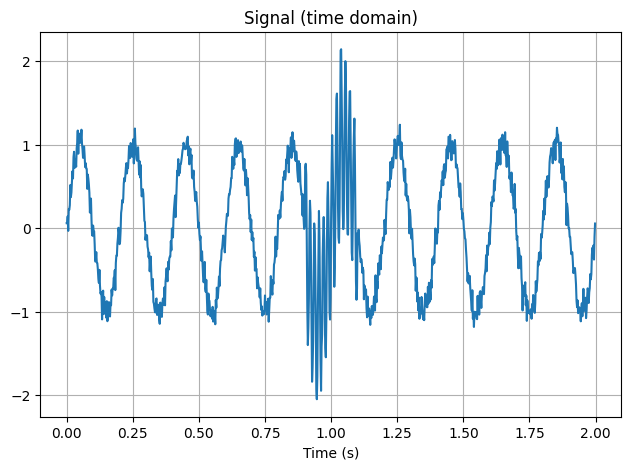

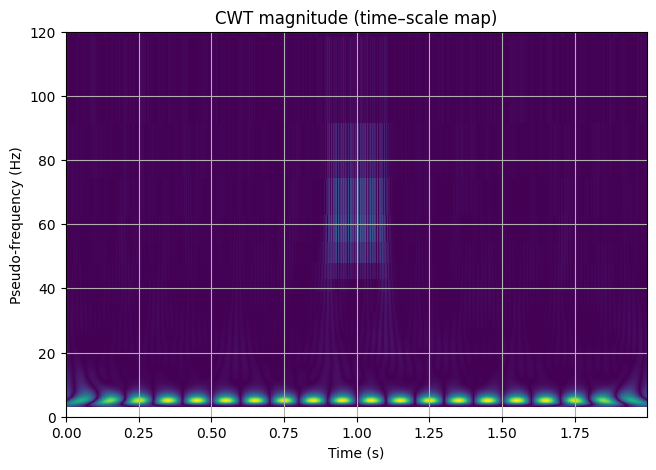

In [ ]:
# @title
# CWT 时-尺度（伪频率）图
fs = 500
t = np.arange(0, 2, 1/fs)
x = np.sin(2*np.pi*5*t) + ((t>0.9)&(t<1.1))*np.sin(2*np.pi*60*t) + 0.1*np.random.randn(len(t))

scales = np.arange(1, 128)
coef, freqs = pywt.cwt(x, scales, 'morl', sampling_period=1/fs)

plt.figure()
plt.plot(t, x)
plt.title("Signal (time domain)")
plt.xlabel("Time (s)")
plt.show()

plt.figure()
plt.pcolormesh(t, freqs, np.abs(coef), shading='auto')
plt.title("CWT magnitude (time–scale map)")
plt.xlabel("Time (s)")
plt.ylabel("Pseudo-frequency (Hz)")
plt.ylim(0, 120)
plt.show()

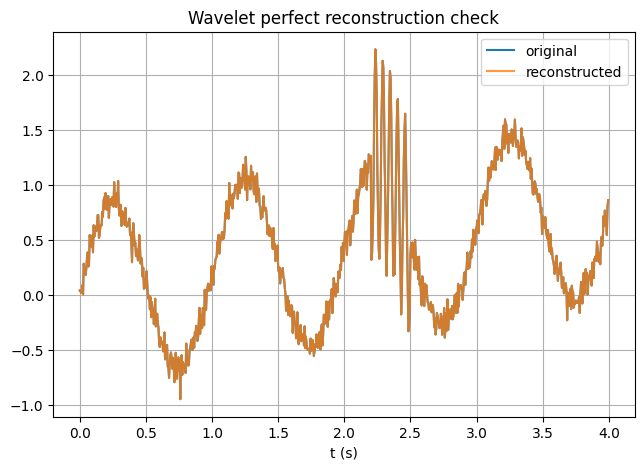

reconstruction MSE = 3.9394355720802242e-31


In [ ]:
# @title
# DWT 分解与重构
fs = 200
t = np.arange(0, 4, 1/fs)
x = 0.8*np.sin(2*np.pi*1.0*t) + 0.2*t
x += ((t>2.2)&(t<2.5))*0.9*np.sin(2*np.pi*18*t)
x += 0.08*np.random.randn(len(t))

wavelet = "haar"
level = 6
coeffs = pywt.wavedec(x, wavelet, level=level)

x_rec = pywt.waverec(coeffs, wavelet)[:len(x)]

plt.figure()
plt.plot(t, x, label="original")
plt.plot(t, x_rec, label="reconstructed", alpha=0.8)
plt.legend()
plt.title("Wavelet perfect reconstruction check")
plt.xlabel("t (s)")
plt.show()

print("reconstruction MSE =", np.mean((x-x_rec)**2))

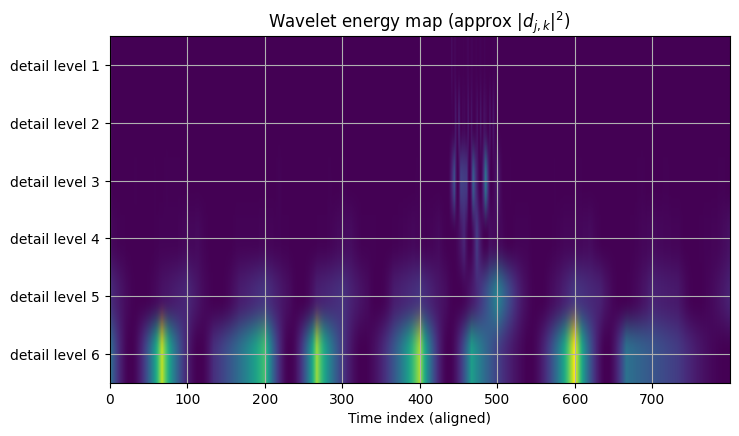

In [ ]:
# @title
# 将不同尺度 detail 系数对齐到时间轴，堆叠显示能量
details = coeffs[1:]
L = len(details)
T = len(x)

def upsample_to_T(arr, T):
    idx = np.linspace(0, len(arr)-1, T)
    return np.interp(idx, np.arange(len(arr)), arr)

stack = []
labels = []
for j in range(L, 0, -1):  # j=level..1
    d = details[L-j]
    stack.append(upsample_to_T(d, T)**2)
    labels.append(f"detail level {j}")
stack = np.vstack(stack)

plt.figure(figsize=(8, 4.5))
plt.imshow(stack, aspect="auto", origin="lower")
plt.yticks(np.arange(L), labels)
plt.xlabel("Time index (aligned)")
plt.title(r"Wavelet energy map (approx $|d_{j,k}|^2$)")
plt.show()

### 4.5 从小波到卷积：把“局部投影”写成“滑动匹配”

在前面的小波表述中，系数来自内积（投影）：
$$
W(a,b)=\int_{-\infty}^{\infty} f(t)\,\psi_{a,b}^*(t)\,dt,
\qquad
\psi_{a,b}(t)=\frac{1}{\sqrt{|a|}}\psi\!\left(\frac{t-b}{a}\right)
$$
这一定义的直觉是：把一个“局部模板”$\psi_{a,b}$ 放到时间 $b$ 附近，与信号 $f(t)$ 做相似度打分。由于 $b$ 在时间轴上连续变化，相当于模板在信号上不断滑动并输出一条响应曲线。因此，小波“投影系数随位置变化”的过程，本质上与卷积的“滑动加权求和”高度一致。

---

#### 4.5.1 卷积：滑动加权求和的统一表达

给定信号 $f(t)$ 与核函数（kernel）$k(t)$，卷积定义为
$$
(f*k)(b)=\int_{-\infty}^{\infty} f(t)\,k(b-t)\,dt
$$
对零基础读者，可以把卷积理解为“滑动加权求和”：

1. **核是局部模板**：$k(\cdot)$ 只在有限邻域内起作用（或快速衰减），因此卷积是局部运算。  
2. **滑动产生输出信号**：对每一个位置 $b$，把核移到 $b$ 附近，与信号在该位置的局部片段做加权求和，得到输出值；随着 $b$ 改变，输出形成一条新的函数。  
3. **翻转的来源**：卷积写成 $k(b-t)$ 等价于把核先做时间翻转，再平移到位置 $b$；这是卷积与相关的形式差异来源之一。

因此，卷积可以先理解为：用一个局部模板在信号上滑动，逐点计算“匹配程度/加权和”。

---

#### 4.5.2 连续小波变换（CWT）是“按尺度变化的一族卷积”

连续小波变换的系数
$$
W(a,b)=\int_{-\infty}^{\infty} f(t)\,\frac{1}{\sqrt{|a|}}\psi^*\!\left(\frac{t-b}{a}\right)\,dt
$$
可以改写成标准卷积形式。定义随尺度 $a$ 伸缩的卷积核
$$
\tilde\psi_a(t)=\frac{1}{\sqrt{|a|}}\psi^*\!\left(\frac{-t}{a}\right)
$$
则有
$$
W(a,b)=(f*\tilde\psi_a)(b)
$$

用尺度为 a 的小波核 \tilde\psi_a 去滤波（卷积）信号 f，得到一条输出曲线；在时间/位置 b 处读出输出值。

这给出一个非常工程化的理解：对每个尺度 $a$，用一个宽度与 $a$ 相对应的局部核 $\tilde\psi_a$ 去卷积信号 $f$，并把在位置 $b$ 的输出读作小波系数。换句话说，小波分析就是一组“尺度可变的局部滤波器”在时间轴上滑动扫描信号，输出多尺度响应。

---

#### 4.5.3 伸缩为何对应“自动改变窗长/频段”

尺度 $a$ 控制核的时间宽度：

- $|a|$ 小：核更窄，局部性更强，更敏感于短时突发与尖峰（高频变化）。  
- $|a|$ 大：核更宽，覆盖更长的时间范围，更适合表达慢变化与趋势（低频结构）。

因此，小波相对于 STFT 的优势可以用卷积语言概括为：

- STFT：核的有效窗长固定，因此时频分辨率固定。  
- 小波：核随尺度伸缩，高频采用短窗、低频采用长窗，从而形成多分辨率表征。

---

### 4.6 离散小波变换（DWT）：卷积 + 下采样的快速实现

CWT 在每个时间位置 $b$ 都输出系数，结果冗余且计算量大。DWT 的核心思想是：把尺度与平移参数离散化为 dyadic 网格（常用 $2$ 倍尺度），从而得到既可重构又高效计算的表示。实现上，DWT 可以完全写成滤波器组：先卷积（滤波），再下采样（降低时间分辨率）。

---

#### 4.6.1 Haar 情形：从“平均/差异”直接得到卷积核

在最基础的 Haar 小波中，一层分解做两件事：

- 近似（低频趋势）：相邻两点取平均。  
- 细节（高频变化）：相邻两点取差异。  

对应的低通/高通滤波器（核）可写为
$$
h=\Big[\frac{1}{\sqrt2},\frac{1}{\sqrt2}\Big],\qquad
g=\Big[\frac{1}{\sqrt2},-\frac{1}{\sqrt2}\Big]
$$

对离散信号 $x[n]$，第一层分解得到
$$
a_1[k]=\frac{x[2k]+x[2k+1]}{\sqrt2},\qquad
d_1[k]=\frac{x[2k]-x[2k+1]}{\sqrt2}
$$
它们可以理解为：

- $a_1[k]$：第 $k$ 个小区间的“平均强度”（趋势）。  
- $d_1[k]$：第 $k$ 个小区间内“前后差异”（细节/变化）。  

将其写成卷积形式更统一。记“卷积后下采样”为：先用核滑动求和，再每隔一个点取一次（$\downarrow2$）：
$$
a_1=\downarrow2\,(x*h),\qquad d_1=\downarrow2\,(x*g)
$$
这里的 $\downarrow2$ 表示下采样因子为 2。下采样的意义是：当把信号分辨率降低一层时，时间位置的采样密度也应降低一半，以匹配该层的有效时间分辨率，并避免产生不必要的冗余。

---

#### 4.6.2 一般 DWT（Mallat 分解）：每一层都是“低通/高通 + 抽取”

在多分辨率分析中，逐层分解可写为递推形式：
$$
a_{j-1}=\downarrow2\,(a_j*h),\qquad d_{j-1}=\downarrow2\,(a_j*g)
$$
其中：

- $a_j$：第 $j$ 层的近似系数（低频趋势）。  
- $d_j$：第 $j$ 层的细节系数（带通细节）。  
- $h$：低通滤波器（产生趋势）。  
- $g$：高通滤波器（产生细节）。  

这种“卷积 + 下采样”的结构在计算图上表现为两条并行支路：一条保留低频并继续递归分解，另一条输出该层细节并停止分解。它与 4.3 的空间分解 $V_{j+1}=V_j\oplus W_j$ 是同一件事的两种表述：空间语言强调“趋势空间 + 细节空间”，滤波器语言强调“低通输出 + 高通输出”。

---

### 4.7 逆变换（重构）：上采样 + 卷积 + 相加

小波分解的重要性不仅在于分析，更在于它支持可逆重构。在离散实现中，重构与分解互为配对：把低频趋势与高频细节两条支路合成回更高分辨率的序列。

---

#### 4.7.1 Haar 的重构直觉：由“平均 + 差异”恢复原样本

设某一对相邻样本为 $x[2k],x[2k+1]$，分解得到
$$
a_1[k]=\frac{x[2k]+x[2k+1]}{\sqrt2},\qquad
d_1[k]=\frac{x[2k]-x[2k+1]}{\sqrt2}
$$
则可解回
$$
x[2k]=\frac{a_1[k]+d_1[k]}{\sqrt2},\qquad
x[2k+1]=\frac{a_1[k]-d_1[k]}{\sqrt2}
$$
这清楚表明：只要同时保留趋势 $a_1$ 与细节 $d_1$，就能无损恢复原信号。

---

#### 4.7.2 合成滤波器组：上采样插零后卷积并相加

将 Haar 的“点对点恢复”写成通用滤波器组形式，重构步骤为：

1. 对 $a_{j-1}$、$d_{j-1}$ 上采样 $\uparrow2$（在相邻样本间插入 0）。  
2. 分别与合成滤波器卷积。  
3. 两支路相加得到更高分辨率的 $a_j$。  

形式化写为
$$
a_j=(\uparrow2\,a_{j-1})*h \;+\; (\uparrow2\,d_{j-1})*g
$$
在满足完美重构条件的小波系统（正交或双正交）中，该合成过程与分解过程严格配对，从而保证可逆重构。

---

### 4.8 从卷积视角回看能量图：为什么用 $E(j,k)=|d_{j,k}|^2$

在 4.4 中定义了系数能量：
$$
E(j,k)=|d_{j,k}|^2
$$
在卷积视角下，这一定义更直观：$d_{j,k}$ 可以理解为信号在第 $j$ 个尺度对应的高通（带通）核上卷积后的局部响应（再经过下采样定位到 $k$）。因此：

- $|d_{j,k}|$ 描述该尺度频段在该时间邻域内的响应幅度。  
- $|d_{j,k}|^2$ 描述响应能量强度，适合作为“热力图”像素值。  

这与 STFT 的谱图 $|X(\tau,\omega)|^2$ 在结构上对齐：两者都是“局部滤波响应的能量可视化”，差别在于 STFT 的核窗固定，而小波的核随尺度伸缩，从而形成多分辨率的时间–尺度能量图。

---

### 4.9 小结：小波是可重构的多尺度卷积表示

- CWT 可看成：对每个尺度 $a$，用尺度化核 $\tilde\psi_a$ 与信号卷积，得到随时间位置变化的响应 $W(a,b)$。  
- DWT 是 CWT 的高效可逆版本：每层均为“低通卷积+下采样”得到趋势、“高通卷积+下采样”得到细节。  
- 逆变换对应“上采样+卷积+相加”，逐层把趋势与细节合成为原信号，实现可重构表示。  
- 因为细节系数本质上是带通卷积响应，所以用 $E(j,k)=|d_{j,k}|^2$ 构造时间–尺度能量图具有清晰的物理含义：它标记了不同频带能量随时间的分布与迁移。

# 第五部分：从小波重构到稀疏编码——通往流形的关键桥梁

小波可重构、多尺度坐标系”进一步推向两个更强的观点：

- **在小波/局域字典里，真实信号往往稀疏或可压缩**  
- **稀疏/可压缩并不只是工程技巧，它是“低维结构（并集子空间/流形）”的直接线索**


---

### 5.1 稀疏性（Sparsity）为什么提示低维结构？

#### 5.1.1 当前问题：为什么不仅要“分析”，还要“重构/压缩/去噪”？它和流形有什么关系？
先区分两类工作：

- 只做分析（analysis）：例如画谱图。你能回答

“什么时候能量更强？”“哪个频段更明显？”
但谱图本身通常不能让你“删掉噪声再回到时域信号”，也不方便“用少量参数生成信号”。

- 做可逆变换 + 可控修改 + 再重构（reconstruction）：

这类方法的目标是：
你不只要看懂信号，还要能“抽取结构”、删掉不重要的部分，然后回到时域得到一个更干净/更短/更可解释的信号。

神经信号里，这很关键，因为你经常要做：

- **压缩**：记录/传输成本高，希望保留结构、丢掉冗余  
- **去噪**：观测常被噪声污染，希望恢复潜在真实信号  
- **重构/生成**：希望从少量参数（系数）重建信号，便于建模与解释  
- **下游低维建模**：分类/解码/动力学分析希望输入更结构化、更稳定

这些任务背后共享一个假设：

信号不是任意乱变的，它有可利用的“结构”。

这一章就是在说明：稀疏性就是这种结构最常见、最可操作的一种形式。




#### 5.1.2 解决：小波域稀疏性（Wavelet-domain sparsity）
经验事实：大量真实信号（自然图像、语音、LFP/EEG、尖峰、瞬态 burst、事件相关振荡）在合适的基/字典（小波、Gabor、局域正弦原子）下表现为**稀疏**：

- 多数系数 $\approx 0$  
- 少数大系数承载主要结构（边缘、突发、节律、阶跃变化等）

把信号用一组“局部模板”（小波）去匹配。匹配得很像的位置会得到大系数；不太像的地方系数就接近 0。
- 边缘/突变/尖峰/瞬态 burst → 少数位置出现大系数
- 平滑段或无结构段 → 大多数系数很小

这就是“稀疏”：大多数≈0，少数很大。

对 DWT/MRA，小波系数可以写成
$$w=\{a_{J,k}\}\ \cup\ \{d_{j,k}\}_{j=J,\dots,J_{\max}}$$
含义是：
- $a_{J,k}$：最粗尺度（低频/趋势）的一组系数
- $d_{j,k}$：各个尺度的细节（高频/局部变化）系数

稀疏/可压缩的意思不是“所有细节都为 0”，而是：

把所有系数按绝对值从大到小排队，数值会很快变小。
因此只保留前面少量大系数，也能近似重构原信号。

常用两种形式化描述：

#### (1) K-稀疏（hard sparsity）

$$\|w\|_0=K$$
这里 $\|w\|_0$ 的意思是“非零元素的个数”（它不是严格意义的范数，但大家习惯这么写）。
- 极端理想化：只有 K 个系数非零
- 现实里常用“显著”替代“非零”：超过某阈值的系数约 K 个

#### (2) 可压缩（compressible）

不是恰好只有 K 个非零，而是前 K 个足够大，其余迅速变小。
所以“只留前 K 个”时，误差会很小。

神经数据多数属于第二种：不是严格稀疏，但非常可压缩。

### 5.1.3 推导到下一步：稀疏 → 不占满高维空间 → 低维结构（流形假设）
这里要非常小心：
“稀疏向量在 $\mathbb{R}^N$ 里”并不意味着它只在某个固定的低维子空间里。
它在的是：许多低维子空间的并集。

### Step A：固定支持集 $S$ 时，会发生什么？

“支持集” $\mathrm{supp}(w)$ 就是非零的位置集合。
如果我先把“哪些位置可以非零”固定为 $S$，并且 $|S|=K$，那么满足
$\mathrm{supp}(w)\subseteq S$
的所有向量有什么特征？

它们只有 S 这 K 个坐标可以变化，其他坐标都必须是 0。
所以它们构成一个**K 维线性子空间**（本质上就是“把 $\mathbb{R}^K$ 填进 $\mathbb{R}^N$ 的某些坐标位置”）。

这一步的直觉是：

你允许自由变化的“旋钮”只有 K 个，所以自由度就是 K。

### Step B：但真实信号的支持集不会永远固定

不同时间点、不同 trial、不同状态，非零位置集合 S 会变。
因此“所有 K-稀疏向量的集合”不是一个子空间，而是很多个子空间的并集：
$$\mathcal{S}_K=\bigcup_{|S|=K}\{w:\ \mathrm{supp}(w)\subseteq S\}$$

这句话的含义是：
- 在任意一个具体时刻/具体条件下：信号有效自由度很低（像落在某个 K 维子空间里）
- 跨时刻/跨条件总体看：它会在不同 K 维子空间之间切换，所以整体结构是“并集”

### Step C：并集子空间怎么走向“流形”？

如果支持集切换是“随机跳变”，那整体就是一团离散散布的并集。
但真实生理系统通常不是随机跳变，而是平滑变化：
- burst 逐渐增强再衰减（系数逐步变大变小）
- 节律能量随觉醒水平缓慢漂移
- 事件相关成分在任务进程中渐进出现/消失

这种平滑变化的结果是：

数据点会沿着某些连续轨迹移动。
局部看像线性子空间（近似线性），整体看会弯曲（非线性）。

流形视角入口:
- 局部近似低维（像某个子空间）
- 整体可能弯曲（需要非线性坐标描述）
---

### 5.2 小波稀疏如何落地为压缩与去噪：阈值化（Thresholding）与可重构性

#### 5.2.1 核心观点：可逆变换 + 稀疏系数 = 可控地删减信息
小波变换在合适条件下可逆（DWT 完美重构）。因此我们可以在系数域进行“删减/修正”，再逆变换回时域得到压缩或去噪的信号：

- 分析：$f \xrightarrow{\mathcal{w}} w$  
- 修改系数：$w \to \tilde{w}$（阈值化/保留 Top-$K$）  
- 合成：$\tilde{f}=\mathcal{w}^{-1}(\tilde{w})$

#### 5.2.2 压缩：保留 Top-$K$ 大系数（$K$-term approximation）
最简单压缩：只保留幅值最大的 $K$ 个系数，其余置 0：
$$
\tilde{w}=\mathcal{k}_K(w)
$$
再重构：
$$
\tilde{f}=\mathcal{w}^{-1}(\tilde{w})
$$

直观理解：大系数承载结构，小系数多为细碎纹理/噪声或冗余。

#### 5.2.3 去噪：硬阈值与软阈值
把噪声理解为“到处都有的微小扰动”，而结构是“少数显著系数”，则阈值化可抑制噪声。

- **硬阈值（Hard）**
$$
\tilde{d}_{j,k}=
\begin{cases}
d_{j,k}, & |d_{j,k}|\ge\lambda\\
0, & |d_{j,k}|<\lambda
\end{cases}
$$

- **软阈值（Soft）**
$$
\tilde{d}_{j,k}=
\mathrm{sign}(d_{j,k})\max(|d_{j,k}|-\lambda,0)
$$


不仅砍掉小的，还把大的往 0 拉一点（收缩）。

软阈值相比硬阈值更“平滑”，在统计意义上常更稳健（减少重构振铃）。

因为硬阈值会造成“突然断崖式”修改，逆变换后更容易出现振铃/假边缘；软阈值更连续，重构更平滑


#### 5.2.4 阈值 $\lambda$ 怎么选：通用阈值（Donoho-Johnstone）与噪声估计
若观测信号为 $y=f+\epsilon$，且 $\epsilon$ 近似白噪声、方差 $\sigma^2$，常用通用阈值：
$$
\lambda=\sigma\sqrt{2\log N}
$$
其中 $N$ 是样本长度。

$\sigma$ 常用最高频细节系数的 MAD（中位数绝对偏差）估计：
$$
\hat{\sigma}=\frac{\mathrm{median}(|d_{j_{\max},k}|)}{0.6745}
$$
这使得阈值化方法完全可操作：估计噪声强度 → 计算阈值 → 细节系数阈值化 → 逆变换重构。

---

### 5.3 从“固定小波基”到“稀疏编码字典”：为何要学习字典？

#### 5.3.1 小波很好，但并非对所有结构最稀疏
小波对“阶跃、边缘、瞬态”非常有效（尤其 Haar 对突变），但真实神经信号可能包含：

- 非正弦的窄带振荡  
- 多尺度的非线性形态  
- 个体差异与任务相关结构

固定的小波族未必对所有数据都“最稀疏”。因此引入更一般的思想：**用字典表示**。

#### 5.3.2 稀疏表示：$x\approx D\alpha$
- $x\in\mathbb{R}^N$：一段信号片段（或一个 trial 的某种向量化特征）
- $D\in\mathbb{R}^{N\times M}$：字典（很多“原子/模板”，通常 $M>N$，过完备）
- $\alpha\in\mathbb{R}^M$：系数，希望它稀疏

优化问题：
$$\min_\alpha\ \frac12\|x-D\alpha\|_2^2+\lambda\|\alpha\|_1$$

- $\|x-D\alpha\|_2^2$：重构要像
-	$\|\alpha\|_1$：用得越少越好（促稀疏）
-	$\lambda$：像与稀疏的权衡

这就是稀疏编码的标准形式（LASSO/BPDN）。



#### 5.3.3 为什么 $L_1$ 会产生稀疏：几何直觉
在二维时，$\|\alpha\|_1=c$ 是菱形，$\|x-D\alpha\|_2^2$ 的等高线是椭圆。椭圆与菱形相切时更容易落在坐标轴上（即某些维度为 0），因此 $L_1$ 更容易产生稀疏解。  
这是 $L_1$ 作为“稀疏松弛”的核心原因。

---

### 5.4 稀疏 → 并集子空间 → 流形：把“低维结构”说清楚

#### 5.4.1 并集子空间（Union of subspaces）：稀疏数据的天然几何结构
如 5.1 所述，$K$-稀疏向量集合：
$$
\mathcal{S}_K=\bigcup_{|S|=K}\{w:\ \mathrm{supp}(w)\subseteq S\}
$$
这是许多 $K$ 维线性子空间的并集。

这一步非常重要，因为它提供了“低维结构”的一个比“流形”更可计算的中间概念：  
很多稀疏模型学习（压缩感知、子空间聚类）都是在利用这个结构。

#### 5.4.2 从并集子空间到流形：支持集平滑变化带来“弯曲”
当系统状态连续变化时，“当前属于哪个子空间/哪些原子被激活”也会连续调整。

于是从全局看，“很多平面拼起来”在空间里呈现弯曲连续形态——这就是流形。

稀疏给你“局部低维”的保证；

平滑变化把这些局部低维结构串成“整体非线性”的流形。


在真实系统里，支持集并不随机跳变，而会随状态/刺激连续变化：

- 突发事件逐渐出现、增强、消失  
- 节律频段能量随相位/觉醒水平连续变化  
- 多尺度结构在任务进程中渐进调整

于是，数据点在高维空间中会沿着某些连续方向移动，形成**弯曲的低维集合**。这可以被看作流形假设的一种来源：  
“局部上近似低维（像某个子空间），整体上弯曲（需要非线性坐标）”。

---

### 5.5 生物学解释：从 V1 的 Gabor 到神经群体的低维流形

#### 5.5.1 V1 的简单细胞与稀疏编码的经典连接
大量研究指出 V1 简单细胞感受野与 Gabor 原子高度相似。Gabor 是“局域窗 + 振荡”，在思想上与 STFT/小波同源。这提示：

- 感觉皮层可能在做类似“局域字典投影”  
- 神经响应可能是一种稀疏表征（只有少数单元在特定刺激下强响应）

因此“稀疏编码”不仅是工程技巧，也是一种合理的生物计算假设。

#### 5.5.2 群体活动的低维：稀疏性与潜变量的桥梁
在群体神经元空间中（维度很高），如果系统只由少数潜变量控制（如相位、强度、状态切换、策略变量），则群体活动不会填满高维空间，而会集中在低维结构上（子空间/流形）。

稀疏性提供了一种机制解释：  
**系统在任何时刻只激活少数“特征维度/字典原子”，那么有效自由度自然低，低维结构自然出现。**

---

### 5.6 推导到下一步：从“稀疏系数空间”进入“流形学习/动力学”

到这里我们得到了一个清晰链条：

- 小波（可重构、多尺度）$\Rightarrow$ 系数域稀疏  
- 稀疏 $\Rightarrow$ 压缩/去噪（工程可操作）  
- 稀疏 $\Rightarrow$ 并集子空间（几何结构）  
- 支持平滑变化 $\Rightarrow$ 低维流形（连续结构）  
- 流形 $\Rightarrow$ 可用非线性降维/动力系统建模（PCA/jPCA/Isomap/UMAP/状态空间模型等）


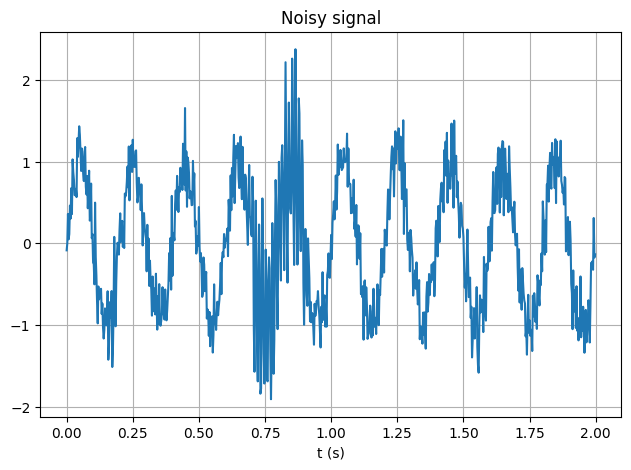

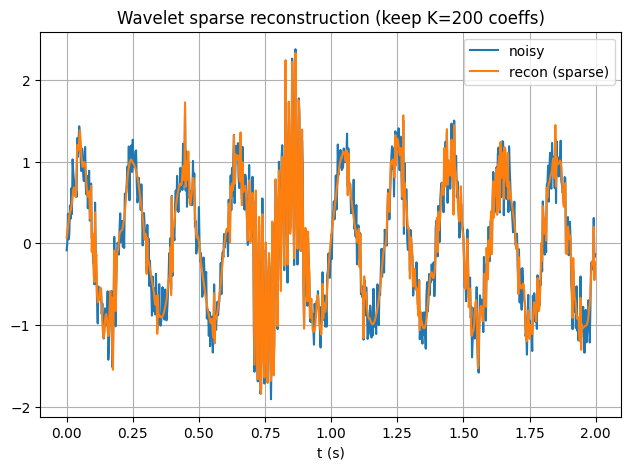

K = 200 MSE = 0.027244526492646283


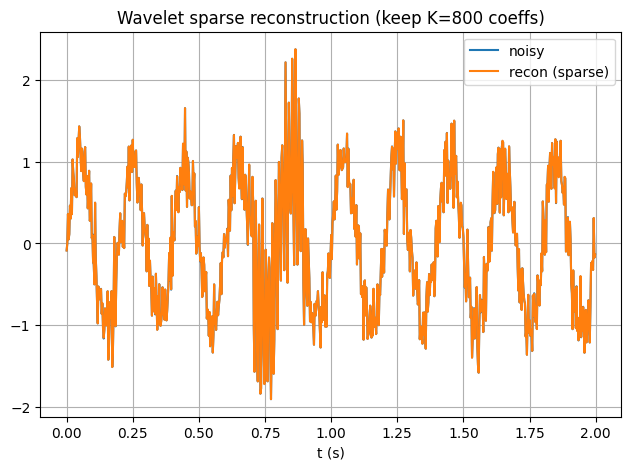

K = 800 MSE = 5.998859832782637e-06


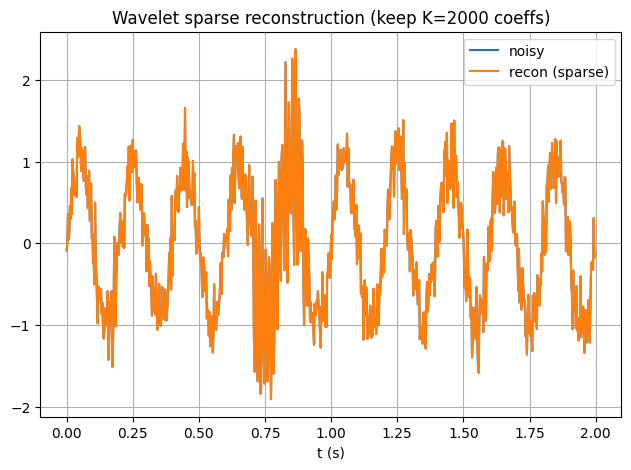

K = 2000 MSE = 8.153502660467354e-32


In [ ]:
# @title
# 稀疏截断仍可重构：去噪/压缩直觉
fs = 400
t = np.arange(0, 2, 1/fs)
x = np.sin(2*np.pi*5*t) + ((t>0.7)&(t<0.9))*np.sin(2*np.pi*80*t)
x += 0.25*np.random.randn(len(t))

wavelet = "db6"
level = 5
coeffs = pywt.wavedec(x, wavelet, level=level)
arr, slices = pywt.coeffs_to_array(coeffs)

def keep_top_k_wavelet(arr, slices, K, wavelet, length):
    idx = np.argsort(np.abs(arr).ravel())[::-1]
    flat = arr.ravel().copy()
    mask = np.zeros_like(flat, dtype=bool)
    mask[idx[:K]] = True
    flat2 = np.zeros_like(flat)
    flat2[mask] = flat[mask]
    arr2 = flat2.reshape(arr.shape)
    coeffs2 = pywt.array_to_coeffs(arr2, slices, output_format="wavedec")
    xr = pywt.waverec(coeffs2, wavelet)[:length]
    return xr

plt.figure()
plt.plot(t, x)
plt.title("Noisy signal")
plt.xlabel("t (s)")
plt.show()

for K in [200, 800, 2000]:
    xr = keep_top_k_wavelet(arr, slices, K, wavelet, len(x))
    plt.figure()
    plt.plot(t, x, label="noisy")
    plt.plot(t, xr, label="recon (sparse)")
    plt.legend()
    plt.title(f"Wavelet sparse reconstruction (keep K={K} coeffs)")
    plt.xlabel("t (s)")
    plt.show()
    print("K =", K, "MSE =", np.mean((x-xr)**2))

# 第六部分：从稀疏系数到神经流形——低维表示、动力学与可解释性



本部分承接第五部分的链条：小波/字典 $\Rightarrow$ 稀疏系数 $\Rightarrow$ 并集子空间/流形假设。核心任务是把“稀疏表征”真正转化为**可用于神经数据分析的低维坐标系**，并进一步讨论如何在低维空间中理解**群体动力学**（轨迹、旋转结构、状态切换）以及如何保证解释性与可验证性。

---
## 什么是流形？“揉皱的纸团”理论

### 当前问题
如果记录 100 个神经元，我们得到 100 维点云。它看起来混乱。  
但系统真的需要 100 个自由度吗？

### 解决：流形假设（Manifold Hypothesis）
神经元高度相关（连接与共同输入约束），活动被限制在高维空间里的低维曲面上：
$$
\mathbf{x}(t)=f(\mathbf{z}(t))+\epsilon,\qquad \mathbf{z}(t)\in\mathbb{R}^d,\ d\ll N
$$
比喻：A4 纸（2D）揉成纸团（嵌入 3D），但本质仍是 2D 表面。  
蚂蚁只能沿纸面走，不能穿越空气（非法神经状态）。

### 局部线性（切空间）与降维算法
流形整体弯曲，但局部近似平坦，因此线性代数仍有用；PCA/Isomap 等算法试图“展开纸团”。

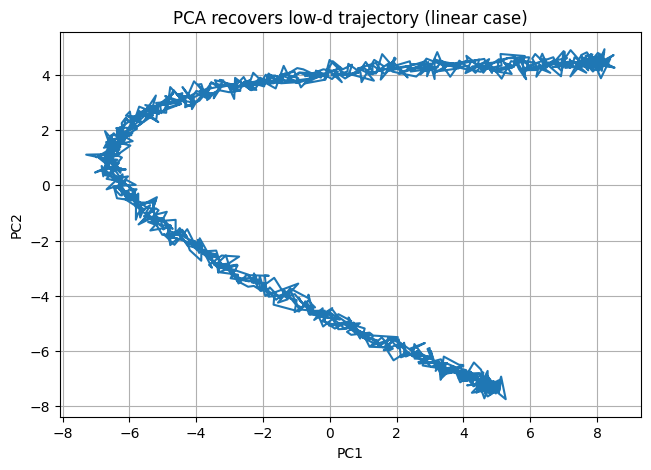

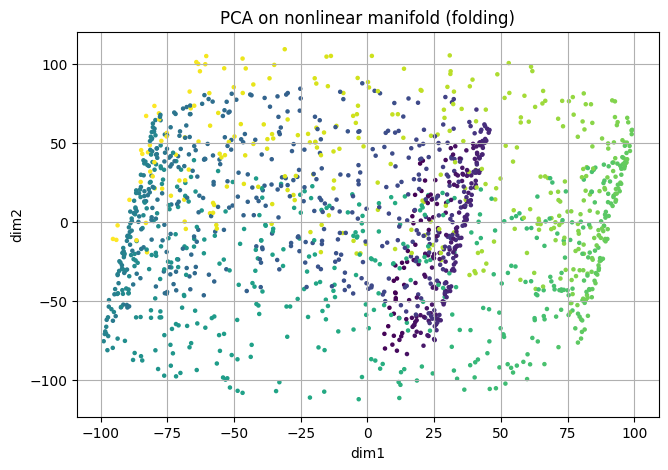

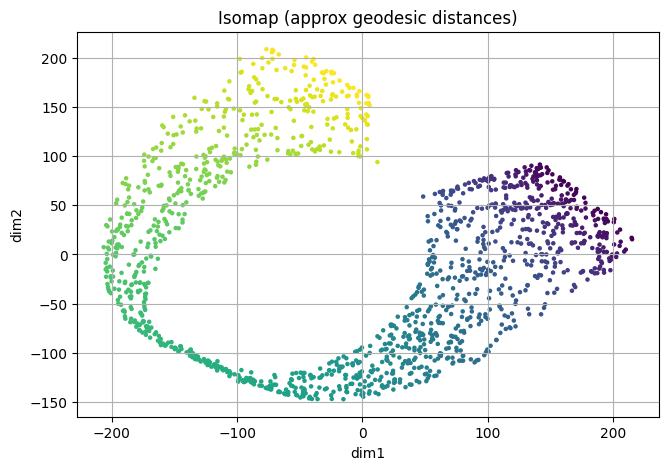

In [ ]:
# @title
# 线性 vs 非线性低维：PCA vs Isomap
# (A) 线性：2D 潜变量 -> 高维
n = 50
T = 1200
t = np.linspace(0, 6*np.pi, T)
Z = np.vstack([np.sin(t), np.cos(2*t)]).T
A = np.random.randn(n, 2)
X = Z @ A.T + 0.2*np.random.randn(T, n)
Y = PCA(n_components=2).fit_transform(X)

plt.figure()
plt.plot(Y[:,0], Y[:,1])
plt.title("PCA recovers low-d trajectory (linear case)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# (B) 非线性：Swiss roll
X3, color = make_swiss_roll(n_samples=1500, noise=0.05)
n = 60
W = np.random.randn(3, n)
Xh = X3 @ W + 0.1*np.random.randn(X3.shape[0], n)

Y_pca = PCA(n_components=2).fit_transform(Xh)
Y_iso = Isomap(n_neighbors=12, n_components=2).fit_transform(Xh)

plt.figure()
plt.scatter(Y_pca[:,0], Y_pca[:,1], s=5, c=color)
plt.title("PCA on nonlinear manifold (folding)")
plt.xlabel("dim1")
plt.ylabel("dim2")
plt.show()

plt.figure()
plt.scatter(Y_iso[:,0], Y_iso[:,1], s=5, c=color)
plt.title("Isomap (approx geodesic distances)")
plt.xlabel("dim1")
plt.ylabel("dim2")
plt.show()



### 6.1 从信号到样本点：构造“进入流形学习”的数据矩阵

#### 6.1.1 当前问题：流形学习需要“样本点”，但我们的数据是连续时间信号
时频分析或小波分解给出的是 $f(t)$ 的系数随时间变化（例如 $d_{j,k}$ 或稀疏编码 $\alpha(t)$）。要进入 PCA/UMAP/jPCA 等低维方法，需要把数据组织成矩阵：

- 行：样本点（试次、时间窗、事件对齐片段、连续滑窗等）
- 列：特征维度（小波系数、频带能量、稀疏编码系数、神经元放电率等）

#### 6.1.2 解决：两类常用“样本点”定义
**A. 事件对齐（event-locked）样本**  
给定事件时间 $t_0$（刺激开始、行为反应、尖峰 burst 触发点），取对齐片段 $[t_0-T_1, t_0+T_2]$，在每个时间点或每个短窗提取特征，形成一条轨迹。

**B. 连续滑窗样本（time-warp free）**  
用长度 $L$ 的滑动窗（步长 $s$）在整个记录上滑动，每个窗提取一组特征，得到时间序列样本点 $\{x_n\}$。

#### 6.1.3 小波/稀疏特征的典型选择
你可以把每个样本点定义为以下任一特征向量：

- **尺度-时间能量向量**：把每个尺度层的能量堆叠  
  $$
  x_n=\big[\,E(j,k_n)\,\big]_{j=1}^{J}\quad,\quad E(j,k)=|d_{j,k}|^2
  $$
  适合“节律/频带能量随时间变化”的流形。

- **多尺度系数向量（含符号）**：直接使用 $d_{j,k}$（或其局部统计量）  
  $$
  x_n=\big[\,d_{j,k_n}\,\big]_{j=1}^{J}
  $$
  适合“形态变化/相位信息”也重要的任务。

- **稀疏编码系数向量**：先字典学习/稀疏编码得到 $\alpha_n$  
  $$
  x_n=\alpha_n
  $$
  适合“学习到的原子更贴合数据结构”的场景。

为了对齐不同尺度/不同特征的量纲，通常需要做标准化：

- 去均值与标准差归一化：$x\leftarrow (x-\mu)/\sigma$
- 或对每个尺度做能量归一化（防止低频层统治）

---

### 6.2 线性流形：PCA 作为“最小假设”的低维基线

#### 6.2.1 当前问题：我们如何验证“低维结构”确实存在？
PCA 是最强的基线，因为它只假设数据在一个低维线性子空间附近。若 PCA 已经能解释绝大部分方差，并且在下游任务中表现良好，那么“流形”至少在局部可近似为线性。

对数据矩阵 $X\in\mathbb{R}^{N\times D}$（$N$ 个样本点，$D$ 维特征），PCA 解决：
$$
\min_{U\in\mathbb{R}^{D\times m}}\ \|X - XUU^\top\|_F^2 \quad\text{s.t. } U^\top U=I
$$
得到前 $m$ 个主成分。

#### 6.2.2 关键诊断：解释方差与“有效维度”
- 解释方差比（EVR）：前 $m$ 个 PC 的累计解释比例
- 有效维度（可选）：参与率（participation ratio）
$$
D_{\mathrm{eff}}=\frac{\left(\sum_{i}\lambda_i\right)^2}{\sum_{i}\lambda_i^2}
$$
$\lambda_i$ 为协方差矩阵特征值。$D_{\mathrm{eff}}$ 小意味着“能量集中在少数维度”。

#### 6.2.3 解释性：主成分与尺度/频带的对齐
若 $X$ 的列是多尺度能量或多尺度系数，PCA 的载荷（loadings）可以直接解释“哪些尺度（频段）共同变化”。这一步很关键：它把“黑箱降维”转回可解释的时频结构。

---

### 6.3 非线性流形：什么时候需要 Isomap/LLE/UMAP？

#### 6.3.1 当前问题：PCA 不够好时，说明什么？
当数据的低维结构明显弯曲（例如状态在低维空间形成环、螺旋、分叉轨迹），PCA 可能需要很多维度才能逼近，且可视化不稳定。这时非线性方法更合适。

判断信号：

- PCA 需要很高维才能解释主要方差
- 在低维 PCA 投影中轨迹明显重叠但标签/状态区分仍存在
- 局部邻域结构看起来稳定，但整体形状弯曲

#### 6.3.2 方法选择的“工程语义”
- **Isomap**：保持测地距离，适合“弯曲但近似等距”的流形  
- **LLE**：保持局部线性重构权重，适合“局部几何更可信”的场景  
- **UMAP**：强调保留局部邻域拓扑、可扩展、可视化效果强（神经数据常用）

在写作中建议强调：非线性方法主要用于**可视化与探索**；用于定量结论时最好配合交叉验证、重采样稳定性检验（见 6.6）。

---

### 6.4 从“点云”到“轨迹”：神经流形的动力学视角

#### 6.4.1 当前问题：神经系统不是静态的，流形更多时候表现为轨迹
当样本点来自时间窗序列或事件对齐片段，降维后你得到的是低维轨迹：
$$
z(t)=g(x(t))\in\mathbb{R}^m
$$
其中 $g(\cdot)$ 是 PCA/UMAP/编码器等映射。

典型现象：

- 轨迹在不同条件下沿不同路径演化（任务状态、注意、觉醒）
- 轨迹围绕某个区域旋转（节律/循环动力学）
- 轨迹在若干“吸引子”之间切换（状态跃迁）

#### 6.4.2 最小动力学模型：线性近似与局部线性
在低维空间中常用局部线性动力学近似：
$$
z_{t+1}\approx Az_t + b
$$
或连续形式：
$$
\dot{z}(t)\approx Az(t)+b
$$
用以解释局部稳定性、收敛/发散方向与耦合结构。

---

### 6.5 旋转流形与 jPCA：把“循环动力学”显式提取出来

#### 6.5.1 为什么需要 jPCA？
在很多神经群体数据中（尤其运动皮层、节律任务、周期性过程），低维轨迹呈现旋转结构。jPCA 的目标是从数据的时间导数中提取“最接近纯旋转”的子空间。

基本思想：在 PCA 降维后的空间中拟合线性动力学
$$
\dot{z}=Mz
$$
并约束 $M$ 为反对称矩阵（skew-symmetric）：
$$
M^\top=-M
$$
反对称矩阵对应纯旋转流场，因此提取出的平面可以直接解释为“旋转动力学主平面”。

#### 6.5.2 与时频/稀疏系数的关系（建议写进你论文/讲义的关键句）
如果 $x(t)$ 是多尺度能量/稀疏系数向量，那么 jPCA 提取到的旋转平面可解释为：

- 若干尺度（频段）能量之间的相位式耦合与循环交换  
- 事件相关 burst 在不同尺度间的“能量流动”形成闭合轨迹  
- 状态变量（相位、节律强度、任务阶段）在低维空间形成近似周期环

这把“时频结构”与“动力学流形”打通了。

---

### 6.6 可解释与可验证：避免“漂亮图但不稳”的流形结论

#### 6.6.1 稳定性检验
- **重采样稳定性**：bootstrap 试次/时间窗，查看低维嵌入是否保持拓扑（邻域一致）  
- **扰动鲁棒性**：改变窗长、尺度层数、阈值 $\lambda$、字典大小 $M$，嵌入是否稳健  

#### 6.6.2 量化指标
- 重构误差 vs 维度 $m$：PCA 误差曲线  
- 邻域保持（trustworthiness/continuity，用于 UMAP/Isomap）  
- 下游任务性能：低维表示用于分类/解码的交叉验证准确率  
- 动力学拟合优度：$\dot{z}\approx Az$ 的 $R^2$ 或预测误差

---

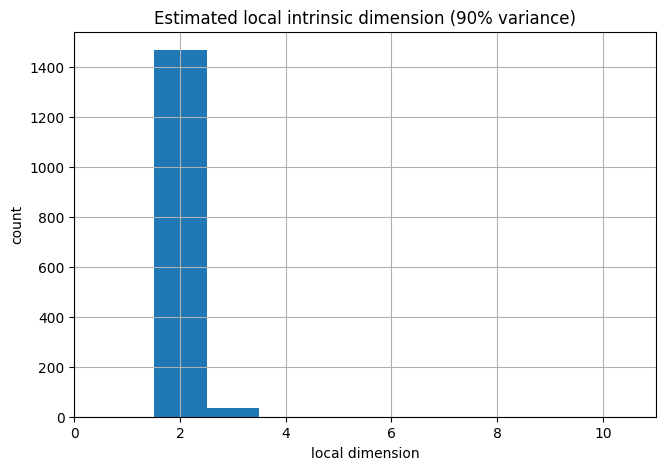

median local dim = 2.0


In [ ]:
# @title
# 局部线性：局部 PCA 估计内蕴维度（90% 方差）
nbrs = NearestNeighbors(n_neighbors=30).fit(Xh)
_, idx = nbrs.kneighbors(Xh)

local_dims = []
for i in range(Xh.shape[0]):
    Xi = Xh[idx[i]]
    p = PCA(n_components=10).fit(Xi)
    cum = np.cumsum(p.explained_variance_ratio_)
    d = np.searchsorted(cum, 0.9) + 1
    local_dims.append(d)

local_dims = np.array(local_dims)
plt.figure()
plt.hist(local_dims, bins=np.arange(1, 12)-0.5)
plt.title("Estimated local intrinsic dimension (90% variance)")
plt.xlabel("local dimension")
plt.ylabel("count")
plt.show()

print("median local dim =", np.median(local_dims))

# 第七部分：拓扑结构实例——环、环面与旋转动力学

## 7.1 环形吸引子（Ring Attractor）：头朝向系统

- **功能：** 动物需要知道自己的头朝向哪儿（0° - 360°）。
    
- **几何结构：** 方向是一个循环变量。360° 等于 0°。
    
- **神经流形：** 在小鼠和果蝇的**头朝向细胞（Head Direction Cells）**中，研究发现群体活动在高维空间中呈现强环状结构/与环形吸引子一致。
    
- **动力学：** 神经活动在圆环上形成一个“凸起（Bump）”。当动物转头时，这个凸起就在圆环上移动。这是一个**连续吸引子网络**：系统在环上是中性稳定的（可以停在任何角度），但在环外是稳定的（会被拉回环上） 。

- **发现：** 尽管单个神经元的调谐曲线看起来杂乱无章，但当我们将群体活动投影到低维空间时，它们形成了一个完美的圆环。这被称为**环形吸引子（Ring Attractor）**。无论外界提示如何，系统状态总是被约束在这个圆环上移动。

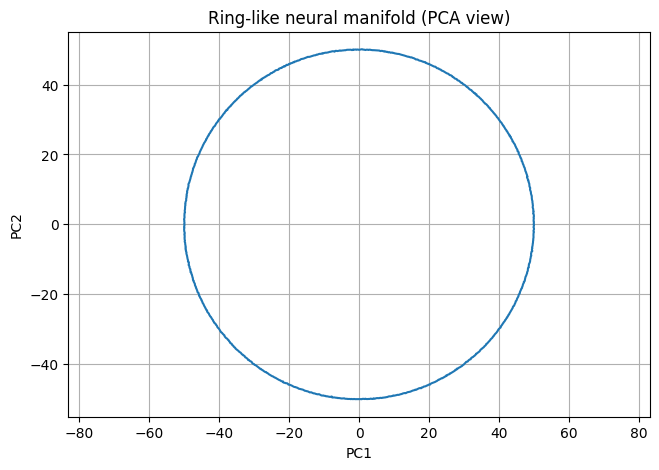

In [ ]:
# @title
# 环流形玩具：θ -> 高维调谐发放 -> PCA 看见环
N = 80
T = 1200
theta = np.linspace(0, 2*np.pi, T, endpoint=False)
pref = np.linspace(0, 2*np.pi, N, endpoint=False)
kappa = 3.0

R = np.exp(kappa*np.cos(theta[:,None] - pref[None,:]))
R += 0.05*np.random.randn(*R.shape)

Y = PCA(n_components=2).fit_transform(R)

plt.figure()
plt.plot(Y[:,0], Y[:,1])
plt.title("Ring-like neural manifold (PCA view)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.axis("equal")
plt.show()

## 7.2 环面（Torus）：网格细胞的周期性边界条件
- **功能：** 空间导航。内嗅皮层的**网格细胞（Grid Cells）**呈现周期性的六边形发放。
    
- **几何结构：** 这种周期性意味着空间是“循环”的。想象一个 2D 平面，上下边界粘合变成圆柱，左右边界再粘合，就变成了**环面（甜甜圈形状）**。
    
- **神经流形：** 2022 年的研究利用拓扑数据分析（TDA）证实，网格细胞群体的联合活动确实分布在一个环面流形上。大脑通过在甜甜圈表面移动坐标来表征二维空间。

二维相位（两方向都循环）在拓扑上等价于甜甜圈表面（torus）。  
直觉：向右走到底回到左边、向上走到底回到下边，两维循环叠加。

- **解释：** 网格细胞的周期性意味着当你在一张地图上一直向右走，神经状态会循环回到起点。这种双向循环在拓扑上等价于甜甜圈表面。2022年 Gardner 等人的研究证实了这一点，这是神经科学与拓扑学结合的里程碑 22。

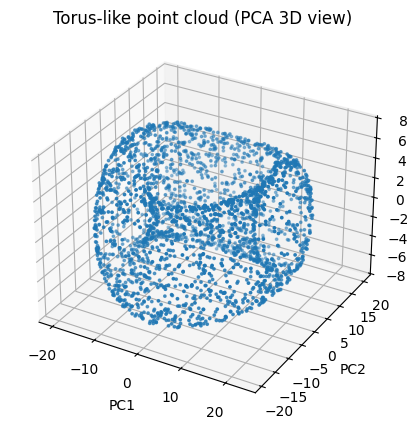

In [ ]:
# @title
# Torus 玩具：两个相位 (θ1,θ2) -> 高维嵌入 -> PCA 3D 直觉图
T = 2500
theta1 = 2*np.pi*np.random.rand(T)
theta2 = 2*np.pi*np.random.rand(T)

R0 = 2.0
r0 = 0.7
x = (R0 + r0*np.cos(theta2))*np.cos(theta1)
y = (R0 + r0*np.cos(theta2))*np.sin(theta1)
z = r0*np.sin(theta2)
w = 0.5*np.sin(2*theta1)

X4 = np.c_[x,y,z,w]

N = 60
W = np.random.randn(4, N)
Xh = X4 @ W + 0.1*np.random.randn(T, N)

Y = PCA(n_components=3).fit_transform(Xh)

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.scatter(Y[:,0], Y[:,1], Y[:,2], s=3)
ax.set_title("Torus-like point cloud (PCA 3D view)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.show()

## 7.3 旋转动力学：运动皮层中的“引擎”
- **功能：** 产生运动。
    
- **几何结构：** 不再是静态的环，而是动态的**流场（Flow Field）**。
    
- **jPCA与欧拉公式的回归：**  为了看到这些结构，传统的 PCA（主成分分析）往往不够，因为它只找方差最大的静止方向。Churchland 和 Shenoy 等人发现，在猴子伸手运动时，运动皮层的神经状态在进行**旋转**。他们开发了 **jPCA** 算法来提取这种旋转结构。
    
- **引擎假说：** 运动皮层像一个动力学引擎。准备阶段（Preparation）设定了旋转的“半径”和“相位”，运动开始信号（Go cue）释放系统，使其按照内在的旋转动力学演化。这种旋转通过线性读出转化为肌肉活动的复杂波形。这里，欧拉公式中的旋转项 $e^{i\omega t}$ 成为了运动生成的基石。
    
- **结论：** 运动皮层的群体活动在运动准备期设定初始状态，在运动执行期表现为强烈的旋转。这种旋转就像发条被释放，驱动肌肉产生复杂的周期性运动（如走路、咀嚼）。这证明了大脑利用**振荡动力学**作为计算基元 。

群体状态在某个子空间里旋转，准备期设定初始状态，执行期沿内在动力学演化。  
欧拉公式的旋转视角在这里回归：旋转就是 $e^{i\omega t}$ 的几何含义。

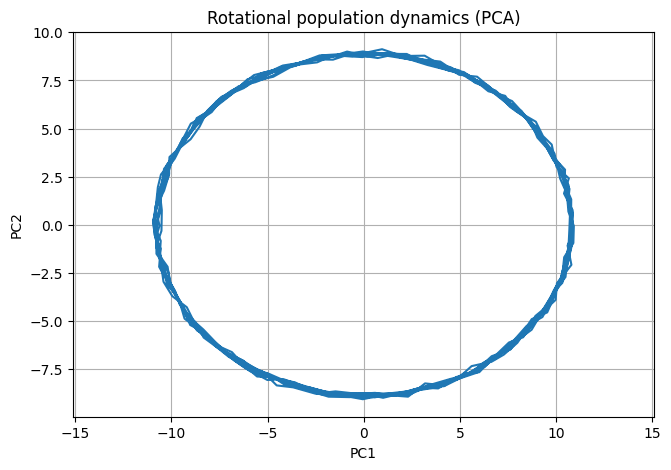

In [ ]:
# @title
# 旋转潜变量 -> 高维观测 -> PCA 看见旋转
dt = 0.01
t = np.arange(0, 6, dt)
omega = 2*np.pi*1.5

z = np.c_[np.cos(omega*t), np.sin(omega*t)]
N = 80
A = np.random.randn(2, N)
X = z @ A + 0.1*np.random.randn(len(t), N)

Y = PCA(n_components=2).fit_transform(X)

plt.figure()
plt.plot(Y[:,0], Y[:,1])
plt.title("Rotational population dynamics (PCA)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.axis("equal")
plt.show()

# 第八部分：从理论到实践——重构与解码（Takens / 降维工具箱）

## 8.1 状态空间重构：Takens 时间延迟嵌入（直觉版）

### 当前问题
如果只能记录少数神经元，能否看到“系统的流形结构”？

### 解决：时间延迟嵌入
- **Takens 定理：** 混沌理论告诉我们，对于一个耦合的动力系统，仅仅观测一个变量的时间序列（Time Series），通过**时间延迟嵌入（Time-delay Embedding）**技术（即构建向量 $[x(t), x(t-\tau), x(t-2\tau)...]$），就可以拓扑等价地恢复出原系统的流形结构。
    
- 这意味着，单个神经元的时间序列中其实隐含了整个网络的动力学信息


构造延迟向量：
$$
\mathbf{v}(t)=[x(t),x(t-\tau),x(t-2\tau),\dots,x(t-(m-1)\tau)]
$$
在合适的 $m,\tau$ 下，它与原系统流形拓扑等价（直觉：仍能恢复“纸面结构”）。

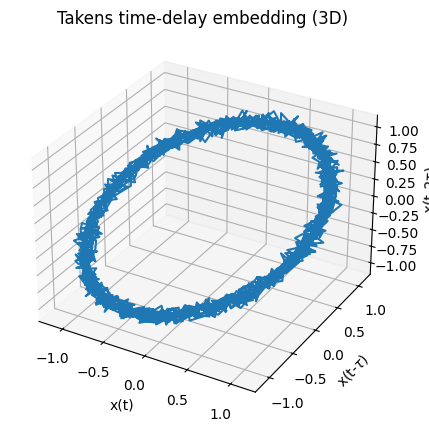

In [ ]:
# @title
# Takens 延迟嵌入：用单变量观测重构相空间
fs = 200
t = np.arange(0, 10, 1/fs)
x = np.sin(2*np.pi*1.5*t) + 0.05*np.random.randn(len(t))

tau = int(0.08*fs)
m = 3
L = len(x) - (m-1)*tau

V = np.zeros((L, m))
for i in range(m):
    V[:,i] = x[i*tau:i*tau+L]

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot(V[:,0], V[:,1], V[:,2])
ax.set_title("Takens time-delay embedding (3D)")
ax.set_xlabel("x(t)")
ax.set_ylabel(r"x(t-$\tau$)")
ax.set_zlabel(r"x(t-2$\tau$)")
plt.show()

## 8.2 降维算法：展开纸团的工具（PCA vs Isomap / LLE / UMAP）

- **PCA（主成分分析）：** 寻找数据方差最大的方向。假设流形是线性的（平整的纸）。
    
- **Isomap / LLE / UMAP：** 非线性降维。它们试图保持数据点之间的**测地线距离（Geodesic Distance）**（即蚂蚁在纸面上爬过的距离），而不是欧氏距离。这允许我们将卷曲的流形展开，看到其内在结构 14。

# 第九部分：多模态落地（Spike rate / LFP / Ca imaging / 混合）

把本讲义的数学链条落回真实数据类型：  
- **Spike rate**：天然是 $\mathbb{R}^N$ 向量轨迹 → 直接进入流形  
- **LFP/EEG**：节奏 + 爆发 → FFT/STFT/小波  
- **Ca imaging**：观测系统低通 → 频域解释要区分“生理 vs 观测”  
- **混合特征**：把多模态统一为一个向量 → 再投影/嵌入/解码

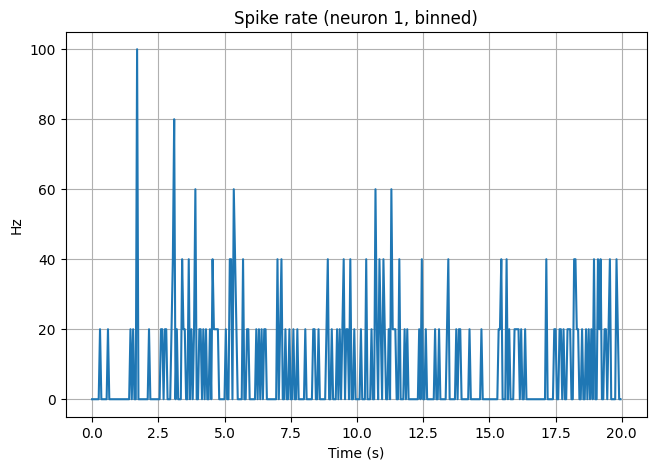

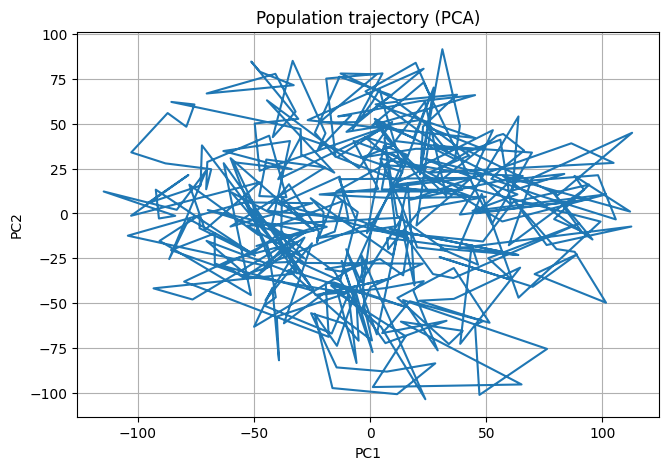

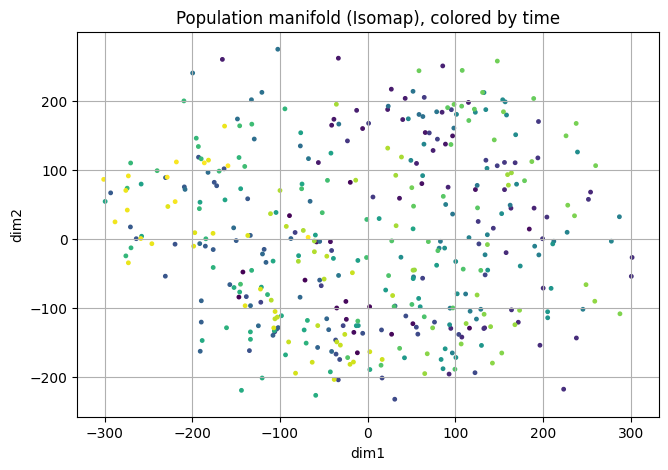

In [ ]:
# @title
# Spike rate：Poisson -> 分箱 -> PCA/Isomap
n_neurons = 80
T = 2000
dt = 0.01
t = np.arange(T)*dt

theta = 2*np.pi * (t / (t[-1]+dt)) * 3
Z = np.vstack([np.sin(0.5*2*np.pi*t), np.cos(theta), np.sin(theta)]).T

W = np.random.randn(n_neurons, 3) * 0.8
bias = np.random.randn(n_neurons) * 0.2
rate = np.log1p(np.exp(Z @ W.T + bias)) * 15  # Hz

spikes = np.random.poisson(rate*dt)

bin_size = 5
Tbin = T // bin_size
spk_bin = spikes[:Tbin*bin_size].reshape(Tbin, bin_size, n_neurons).sum(axis=1)
rate_bin = spk_bin / (bin_size*dt)
tbin = t[:Tbin*bin_size:bin_size]

Y_pca = PCA(n_components=2).fit_transform(rate_bin)
Y_iso = Isomap(n_neighbors=12, n_components=2).fit_transform(rate_bin)

plt.figure()
plt.plot(tbin, rate_bin[:,0])
plt.title("Spike rate (neuron 1, binned)")
plt.xlabel("Time (s)")
plt.ylabel("Hz")
plt.show()

plt.figure()
plt.plot(Y_pca[:,0], Y_pca[:,1])
plt.title("Population trajectory (PCA)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

plt.figure()
plt.scatter(Y_iso[:,0], Y_iso[:,1], s=6, c=tbin)
plt.title("Population manifold (Isomap), colored by time")
plt.xlabel("dim1")
plt.ylabel("dim2")
plt.show()

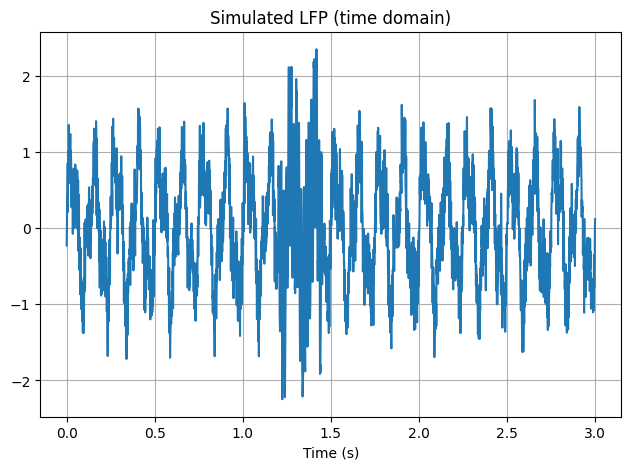

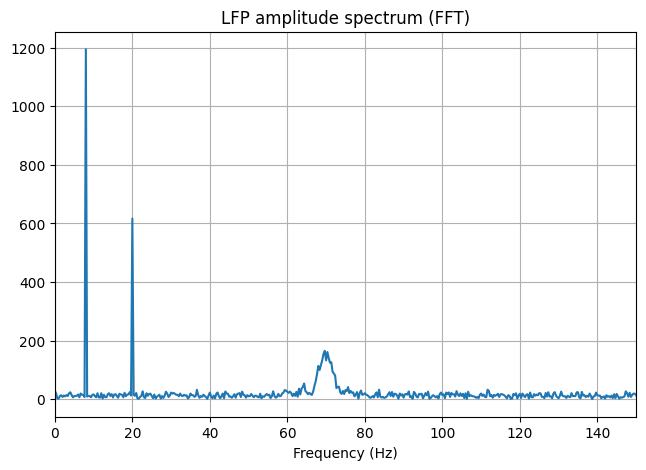

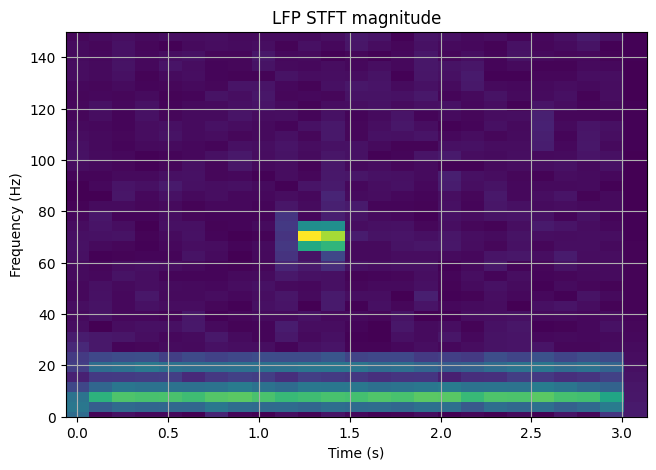

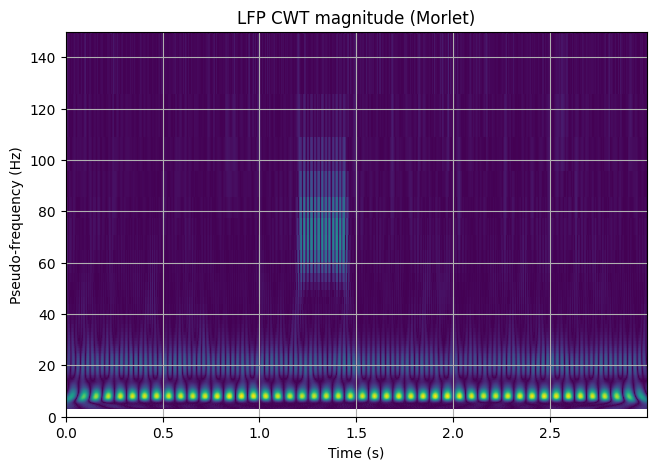

In [ ]:
# @title
# LFP：FFT vs STFT vs CWT
fs = 1000
t = np.arange(0, 3, 1/fs)
lfp = 0.8*np.sin(2*np.pi*8*t) + 0.4*np.sin(2*np.pi*20*t)
lfp += ((t>1.2)&(t<1.45))*1.2*np.sin(2*np.pi*70*t)
lfp += 0.25*np.random.randn(len(t))

plt.figure()
plt.plot(t, lfp)
plt.title("Simulated LFP (time domain)")
plt.xlabel("Time (s)")
plt.show()

LFP = np.fft.rfft(lfp)
freq = np.fft.rfftfreq(len(t), d=1/fs)
plt.figure()
plt.plot(freq, np.abs(LFP))
plt.title("LFP amplitude spectrum (FFT)")
plt.xlabel("Frequency (Hz)")
plt.xlim(0, 150)
plt.show()

f, tt, Z = signal.stft(lfp, fs=fs, nperseg=256, noverlap=128)
plt.figure()
plt.pcolormesh(tt, f, np.abs(Z), shading='auto')
plt.title("LFP STFT magnitude")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.ylim(0, 150)
plt.show()

scales = np.arange(1, 256)
coef, freqs = pywt.cwt(lfp, scales, 'morl', sampling_period=1/fs)
plt.figure()
plt.pcolormesh(t, freqs, np.abs(coef), shading='auto')
plt.title("LFP CWT magnitude (Morlet)")
plt.xlabel("Time (s)")
plt.ylabel("Pseudo-frequency (Hz)")
plt.ylim(0, 150)
plt.show()

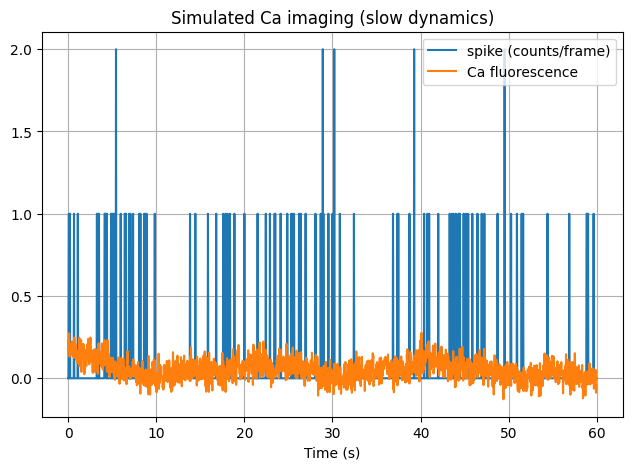

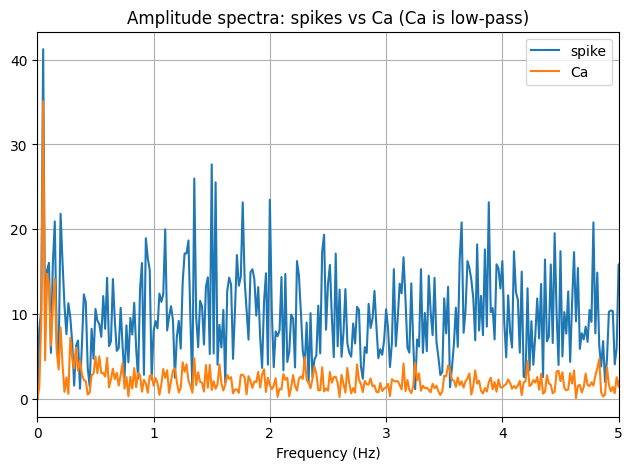

In [ ]:
# @title
# Ca imaging：spike -> 卷积低通 -> 频谱偏低频
fs = 30
t = np.arange(0, 60, 1/fs)

rate_hz = 2.0 + 1.5*np.sin(2*np.pi*0.05*t)
spk = np.random.poisson(rate_hz*(1/fs))

tau = 1.5
kernel_t = np.arange(0, 10, 1/fs)
kernel = np.exp(-kernel_t/tau)
kernel = kernel / kernel.sum()

ca = np.convolve(spk, kernel, mode="same")
ca += 0.05*np.random.randn(len(ca))

plt.figure()
plt.plot(t, spk, label="spike (counts/frame)")
plt.plot(t, ca, label="Ca fluorescence")
plt.legend()
plt.title("Simulated Ca imaging (slow dynamics)")
plt.xlabel("Time (s)")
plt.show()

SPK = np.fft.rfft(spk - spk.mean())
CA  = np.fft.rfft(ca - ca.mean())
freq = np.fft.rfftfreq(len(t), d=1/fs)

plt.figure()
plt.plot(freq, np.abs(SPK), label="spike")
plt.plot(freq, np.abs(CA), label="Ca")
plt.title("Amplitude spectra: spikes vs Ca (Ca is low-pass)")
plt.xlabel("Frequency (Hz)")
plt.xlim(0, 5)
plt.legend()
plt.show()

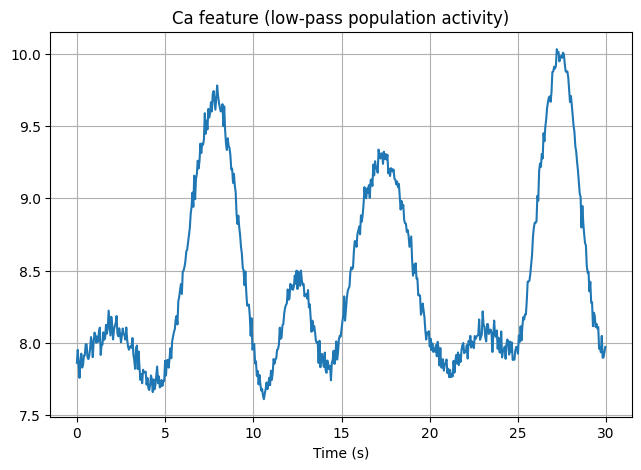

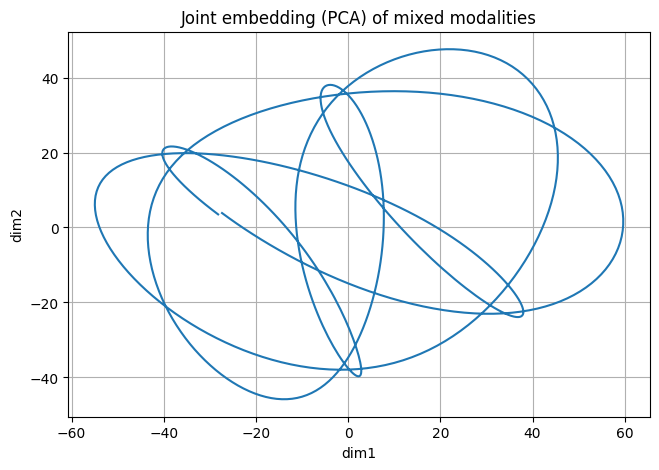

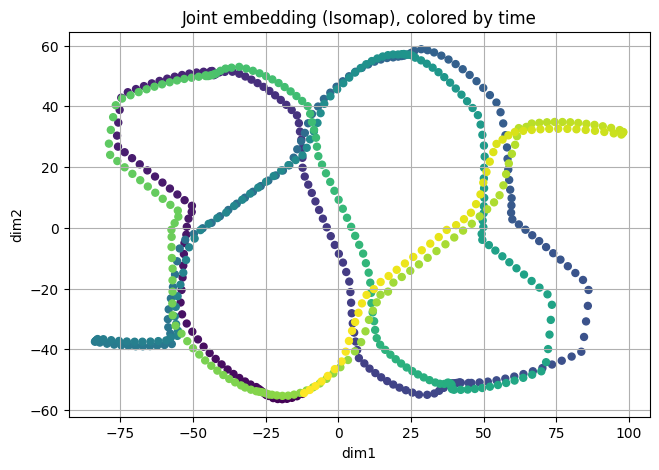

In [ ]:
# @title
# 混合模态：spike rate + LFP band power + Ca feature -> 融合向量 -> 嵌入
dt = 0.05
t = np.arange(0, 30, dt)
T = len(t)

theta = 2*np.pi*(t/t[-1])*5
z_slow = np.sin(2*np.pi*0.1*t)
z_c = np.cos(theta)
z_s = np.sin(theta)
Z = np.vstack([z_slow, z_c, z_s]).T

N = 60
W = np.random.randn(N, 3)*0.9
bias = np.random.randn(N)*0.2
rate = np.log1p(np.exp(Z @ W.T + bias))*10

p_theta = (0.5 + 0.5*(z_c+1)/2) + 0.1*np.random.randn(T)
p_beta  = (0.5 + 0.5*(z_slow+1)/2) + 0.1*np.random.randn(T)
p_gamma = (0.2 + ((np.abs(np.sin(theta*2))>0.9).astype(float))*0.8) + 0.1*np.random.randn(T)
lfp_feat = np.c_[p_theta, p_beta, p_gamma]

pop_spk = rate.mean(axis=1)
b, a = signal.butter(2, 0.2)
ca_feat = signal.filtfilt(b, a, pop_spk) + 0.05*np.random.randn(T)
ca_feat = ca_feat.reshape(-1,1)

V = np.c_[rate, lfp_feat, ca_feat]

Yp = PCA(n_components=2).fit_transform(V)
Yi = Isomap(n_neighbors=10, n_components=2).fit_transform(V)

plt.figure()
plt.plot(t, ca_feat[:,0])
plt.title("Ca feature (low-pass population activity)")
plt.xlabel("Time (s)")
plt.show()

plt.figure()
plt.plot(Yp[:,0], Yp[:,1])
plt.title("Joint embedding (PCA) of mixed modalities")
plt.xlabel("dim1")
plt.ylabel("dim2")
plt.show()

plt.figure()
plt.scatter(Yi[:,0], Yi[:,1], c=t, s=25)
plt.title("Joint embedding (Isomap), colored by time")
plt.xlabel("dim1")
plt.ylabel("dim2")
plt.show()

# 结语：从几何看智能（闭环）

你现在可以把整门课压缩成一句话：  
**把神经活动表示为向量/函数 → 定义内积（相似度）→ 选择基（坐标系）→ 投影得到系数/坐标 → 用重构检验 → 在低维结构（流形与拓扑）中解释大脑计算。**

掌握这些几何工具，你就拥有了把“海量神经数据”翻译成“可解释空间结构”的钥匙。